***AI Engineer - P8 - Traiter les images pour le système embarqué d'une voiture autonome***

# Importation des modules

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

from tensorflow.keras import backend as K
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, UpSampling2D
from tensorflow.keras.optimizers import Adadelta, Nadam
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.utils import plot_model, Sequence, to_categorical
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing import image
import tensorflow as tf

import cv2

import albumentations as A

In [2]:
# Crée le dossier de logs s'il n'existe pas
log_dir = 'C:\\Users\\steph\\Desktop\\Openclassrooms\\tmp'
os.makedirs(log_dir, exist_ok=True)

# Fonctions

## Fonctions d'analyse des images

In [3]:
def find_images_with_text(directory, text):
    """
    Parcourt récursivement un répertoire pour trouver des fichiers contenant un texte spécifique dans leur nom.

    Paramètres:
    directory: Le répertoire racine à parcourir.
    text: Le texte à rechercher dans les noms de fichiers.
    
    Retourne: 
    Une liste des chemins des fichiers dont le nom contient le texte spécifié.
    """
    image_list = []

    # Utilisation de os.walk pour parcourir tous les sous-dossiers et fichiers
    for root, dirs, files in os.walk(directory):
        for file in files:
            # Vérification si le texte spécifié est dans le nom du fichier
            if text in file:
                # Ajout du chemin complet du fichier à la liste
                image_list.append(os.path.join(root, file))

    return image_list

In [4]:
def show_random_images_with_masks(df, n=1):
    """
    Affiche aléatoirement n images et leurs masques associés à partir d'un DataFrame.

    Paramètres:
    df: DataFrame contenant les colonnes 'image' et 'mask', avec les chemins des images.
    n: Nombre d'images à afficher (par défaut 1).
    """
    # Sélectionne n lignes aléatoires dans le DataFrame
    indices = random.sample(range(len(df)), n)
    selected_rows = df.iloc[indices]
    
    # Parcours des lignes sélectionnées pour afficher les images et les masques
    for _, row in selected_rows.iterrows():
        image_path = row['image']
        mask_path = row['mask']
        color_path = row['color']
        
        # Lecture de l'image et du masque
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)  # Charger le masque en niveaux de gris
        color = cv2.imread(color_path)
        
        # Affichage de l'image et du masque côte à côte
        plt.figure(figsize=(10, 5))
        
        # Affiche l'image
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title("Image")
        plt.axis("off")
        
        # Affiche le masque
        plt.subplot(1, 3, 2)
        plt.imshow(mask, cmap='gray')
        plt.title("Masque en gris")
        plt.axis("off")
        
        # Affiche le masque en couleurs
        plt.subplot(1, 3, 3)
        plt.imshow(color)
        plt.title("Masque en couleurs")
        plt.axis("off")
        
        # Affiche le graphique
        plt.show()

## Fonctions des métriques

In [5]:
def dice_coeff(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(K.cast(y_true, 'float32'))  # Conversion explicite en float32
    y_pred_f = K.flatten(K.cast(y_pred, 'float32'))  # Conversion explicite en float32
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    return 1 - dice_coeff(y_true, y_pred)

def total_loss(y_true, y_pred):
    binary_crossentropy_loss = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return binary_crossentropy_loss + (3 * dice_loss(y_true, y_pred))

def jaccard_score(y_true, y_pred):
    smooth = 1.0
    y_true_f = K.flatten(K.cast(y_true, 'float32'))
    y_pred_f = K.flatten(K.cast(y_pred, 'float32'))
    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

# Fonction pour calculer l'IoU (Jaccard) pour chaque classe
def calculate_iou(true_mask, pred_mask, num_classes):
    ious = []
    for cls in range(num_classes):
        true_cls = (true_mask == cls).astype(int)
        pred_cls = (pred_mask == cls).astype(int)
        iou = jaccard_score(true_cls.flatten(), pred_cls.flatten())
        ious.append(iou)
    return ious

## Fonctions de visualisation

In [6]:
# Fonction de visualisation avec IoU pour chaque classe
def plot_sample_prediction(epoch, logs, idx):
    img = np.expand_dims(images[idx], axis=0)
    pred_mask = model.predict(img)[0]
    pred_mask = np.argmax(pred_mask, axis=-1)
    true_mask = np.argmax(masks[idx], axis=-1)
    
    # Calcul des IoU
    num_classes = len(cats)
    iou_true = calculate_iou(true_mask, true_mask, num_classes)
    iou_pred = calculate_iou(true_mask, pred_mask, num_classes)

    # Ajustement de la taille et de la disposition de la figure
    fig, ax = plt.subplots(2, 3, figsize=(15, 8))  # Taille globale plus petite
    fig.suptitle(f"Époque {epoch + 1}")

    # Première ligne : Image d'origine, masque réel, masque prédit
    ax[0, 0].imshow(images[idx])
    ax[0, 0].set_title("Image")
    ax[0, 0].axis('off')
    
    ax[0, 1].imshow(true_mask, cmap='tab20')
    ax[0, 1].set_title("Masque réel")
    ax[0, 1].axis('off')
    
    ax[0, 2].imshow(pred_mask, cmap='tab20')
    ax[0, 2].set_title("Masque prédit")
    ax[0, 2].axis('off')

    # Seconde ligne : Case vide, IoU pour le masque réel, IoU pour le masque prédit
    ax[1, 0].axis('off')  # Case vide
    
    # Graphique IoU pour le masque réel
    ax[1, 1].bar(range(num_classes), iou_true, color=plt.cm.tab20(range(num_classes)))
    ax[1, 1].set_ylim(0, 1)
    ax[1, 1].set_title("IoU pour chaque classe (Masque réel)")
    ax[1, 1].set_xlabel("Classe")
    ax[1, 1].set_ylabel("IoU")

    # Graphique IoU pour le masque prédit
    ax[1, 2].bar(range(num_classes), iou_pred, color=plt.cm.tab20(range(num_classes)))
    ax[1, 2].set_ylim(0, 1)
    ax[1, 2].set_title("IoU pour chaque classe (Masque prédit)")
    ax[1, 2].set_xlabel("Classe")
    ax[1, 2].set_ylabel("IoU")
    
    # Ajustement de l'espacement
    plt.subplots_adjust(hspace=0.4, wspace=0.3)  # Réduit l'espacement entre les graphiques
    plt.show()

## Autres fonctions

In [7]:
# Chargement et préparation des données avec les dimensions correctes
def load_and_preprocess_image(path, target_size=(256, 512)):
    image = cv2.imread(path)
    image = cv2.resize(image, (target_size[1], target_size[0]))  # Mettre en forme (512, 256) pour (largeur, hauteur)
    image = image / 255.0  # Normalisation
    return image

def load_images(df, target_size=(256, 512)):
    images = np.array([load_and_preprocess_image(img_path, target_size) for img_path in df['image']])
    return images

In [8]:
# Préparation des masques de segmentation
def load_mask(path, target_size=(256, 512)):
    mask = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, (target_size[1], target_size[0]), interpolation=cv2.INTER_NEAREST)
    mask = np.vectorize(cat_map.get)(mask)  # Remap categories
    return mask

def load_masks(df, target_size=(256, 512)):
    masks = np.array([load_mask(mask_path, target_size) for mask_path in df['mask']])
    masks = to_categorical(masks, num_classes=len(cats))  # One-hot encoding
    return masks

In [9]:
# Callback pour afficher la prédiction et les graphiques IoU après chaque époque
class PredictionCallback(tf.keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        # Générer un index aléatoire une seule fois pour toutes les époques
        self.idx = np.random.randint(len(images))
    
    def on_epoch_end(self, epoch, logs=None):
        plot_sample_prediction(epoch, logs, self.idx)

# Chargement des images

In [10]:
image_train_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\train\\"
mask_train_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\train\\"

image_val_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\val\\"
mask_val_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\val\\"

image_test_dir = "P8_Cityscapes_leftImg8bit_trainvaltest\\leftImg8bit\\test\\"
mask_test_dir = "P8_Cityscapes_gtFine_trainvaltest\\gtFine\\test\\"

In [11]:
search_image_text = "leftImg8bit"

image_train_list = find_images_with_text(image_train_dir, search_image_text)
image_val_list = find_images_with_text(image_val_dir, search_image_text)
image_test_list = find_images_with_text(image_test_dir, search_image_text)

print('Nombre d\'images d\'entraînement :',len(image_train_list))
print('Nombre d\'images de validation :',len(image_val_list))
print('Nombre d\'images de test :',len(image_test_list))

Nombre d'images d'entraînement : 2975
Nombre d'images de validation : 500
Nombre d'images de test : 1525


In [12]:
search_mask_text = "labelIds"

mask_train_list = find_images_with_text(mask_train_dir, search_mask_text)
mask_val_list = find_images_with_text(mask_val_dir, search_mask_text)
mask_test_list = find_images_with_text(mask_test_dir, search_mask_text)

print('Nombre de mask d\'entraînement :',len(mask_train_list))
print('Nombre de mask de validation :',len(mask_val_list))
print('Nombre de mask de test :',len(mask_test_list))

Nombre de mask d'entraînement : 2975
Nombre de mask de validation : 500
Nombre de mask de test : 1525


In [13]:
search_color_text = "color"

color_train_list = find_images_with_text(mask_train_dir, search_color_text)
color_val_list = find_images_with_text(mask_val_dir, search_color_text)
color_test_list = find_images_with_text(mask_test_dir, search_color_text)

print('Nombre d\'images d\'entraînement :',len(color_train_list))
print('Nombre d\'images de validation :',len(color_val_list))
print('Nombre d\'images de test :',len(color_test_list))

Nombre d'images d'entraînement : 2975
Nombre d'images de validation : 500
Nombre d'images de test : 1525


In [14]:
image_train_list.sort()
mask_train_list.sort()
color_train_list.sort()

image_val_list.sort()
mask_val_list.sort()
color_val_list.sort()

image_test_list.sort()
mask_test_list.sort()
color_test_list.sort()

In [15]:
df_train = pd.DataFrame({
    'image': image_train_list,
    'mask': mask_train_list,
    'color': color_train_list
})

In [16]:
df_val = pd.DataFrame({
    'image': image_val_list,
    'mask': mask_val_list,
    'color': color_val_list
})

In [17]:
df_test = pd.DataFrame({
    'image': image_test_list,
    'mask': mask_test_list,
    'color': color_test_list
})

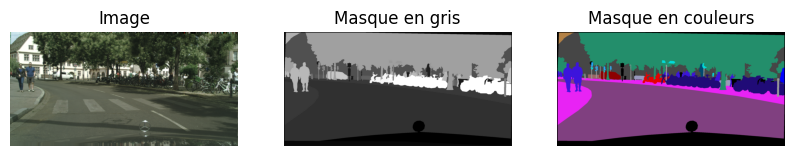

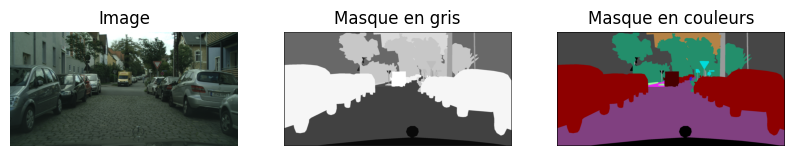

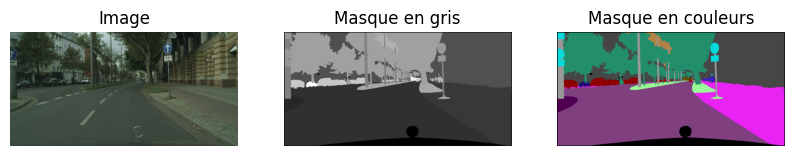

In [18]:
show_random_images_with_masks(df_train, n=3)

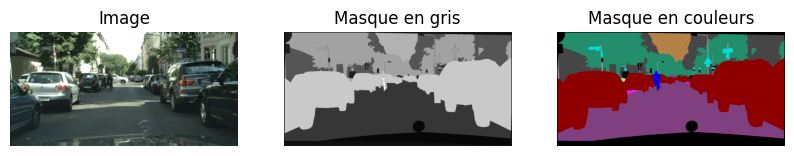

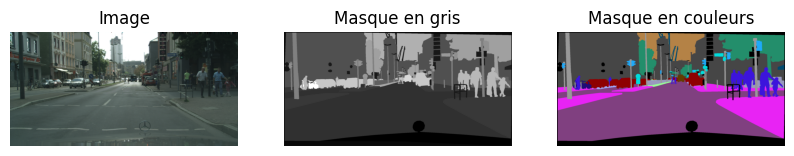

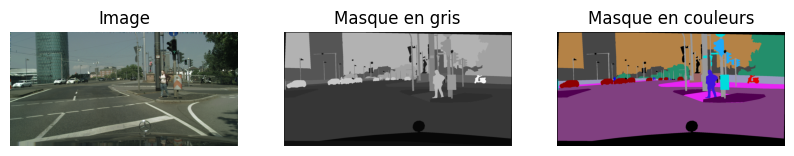

In [19]:
show_random_images_with_masks(df_val, n=3)

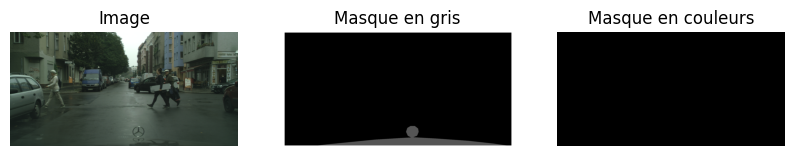

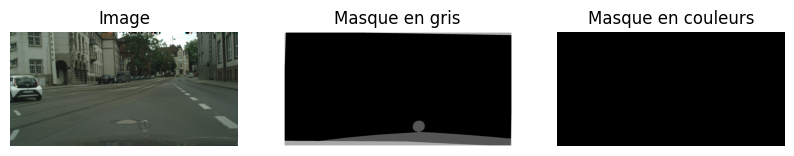

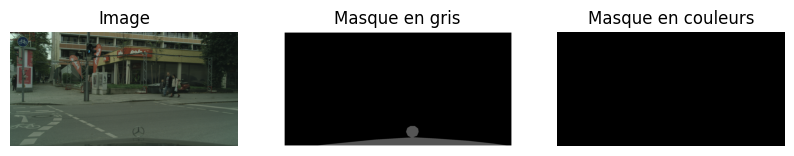

In [20]:
show_random_images_with_masks(df_test, n=3)

In [21]:
image0 = cv2.imread(df_train.iloc[0,0])
mask0 = cv2.imread(df_train.iloc[0,1])

print('Dimension image :', image0.shape)
print('Dimension mask :', mask0.shape)

Dimension image : (1024, 2048, 3)
Dimension mask : (1024, 2048, 3)


In [22]:
df_train_sample = df_train.sample(n=300, random_state=42)

# Catégories

In [23]:
cats = {
    'void': [0, 1, 2, 3, 4, 5, 6],
    'flat': [7, 8, 9, 10],
    'construction': [11, 12, 13, 14, 15, 16],
    'object': [17, 18, 19, 20],
    'nature': [21, 22],
    'sky': [23],
    'human': [24, 25],
    'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]
}

In [24]:
# Création d'une carte de catégories pour les masques
cat_map = {}
for i, (cat, ids) in enumerate(cats.items()):
    for id_ in ids:
        cat_map[id_] = i

# Entrainement avec VGG16

## Avec 10 époques

In [25]:
### Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

# Construction du modèle de segmentation
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 512, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
output = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
model = Model(inputs=base_model.input, outputs=output)

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy'])

# Entraînement du modèle avec le callback
# history = model.fit(
#     images,
#     masks,
#     batch_size=8,
#     epochs=10,
#     callbacks=[PredictionCallback()]
# )

## Avec 20 époques

Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.2877 - dice_coeff: 0.1844 - dice_loss: 0.8156 - jaccard_score: 0.1044 - 


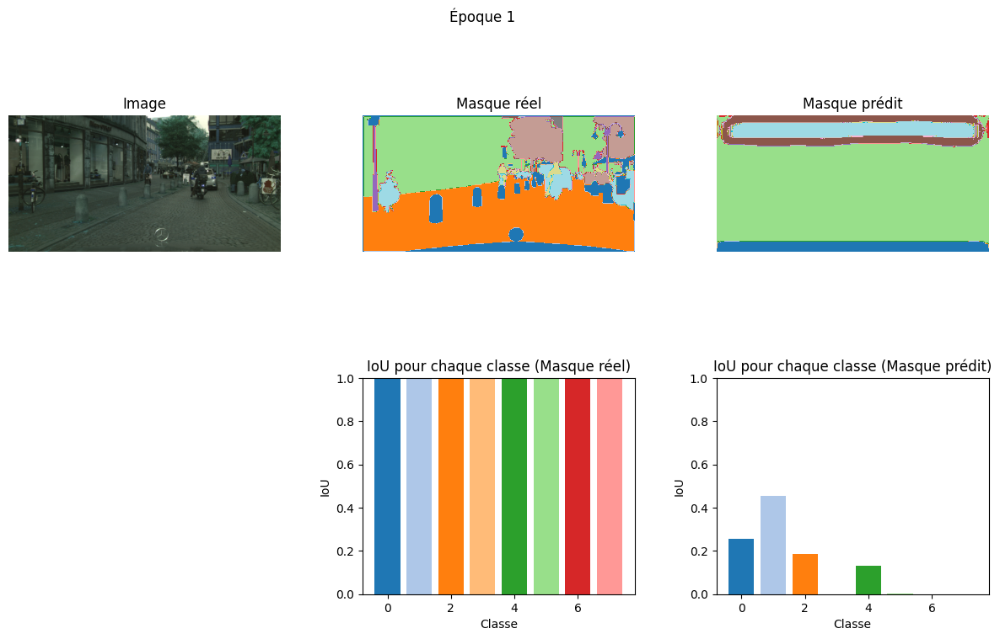

38/38 ━━━━━━━━━━━━━━━━━━━━ 656s 17s/step - accuracy: 0.2893 - dice_coeff: 0.1853 - dice_loss: 0.8147 - jaccard_score: 0.1049 - loss: 13.9247 - total_loss: 5.8205
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4588 - dice_coeff: 0.3269 - dice_loss: 0.6731 - jaccard_score: 0.1972 -


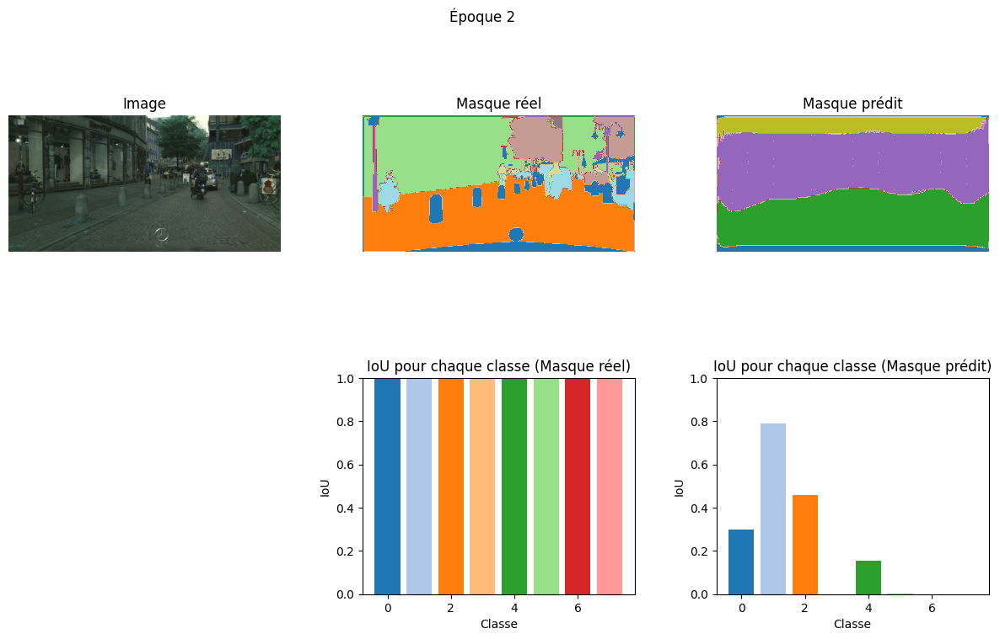

38/38 ━━━━━━━━━━━━━━━━━━━━ 660s 17s/step - accuracy: 0.4597 - dice_coeff: 0.3279 - dice_loss: 0.6721 - jaccard_score: 0.1980 - loss: 1.4780 - total_loss: 2.8971
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.5864 - dice_coeff: 0.4678 - dice_loss: 0.5322 - jaccard_score: 0.3062 -


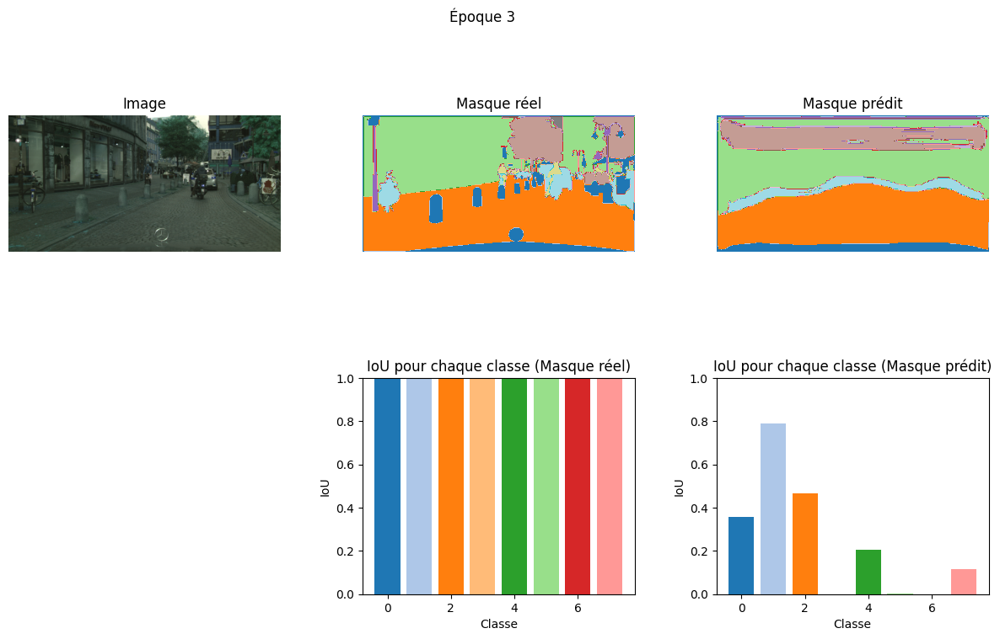

38/38 ━━━━━━━━━━━━━━━━━━━━ 662s 17s/step - accuracy: 0.5868 - dice_coeff: 0.4685 - dice_loss: 0.5315 - jaccard_score: 0.3068 - loss: 1.1104 - total_loss: 2.6040
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.6202 - dice_coeff: 0.5113 - dice_loss: 0.4887 - jaccard_score: 0.3443 -


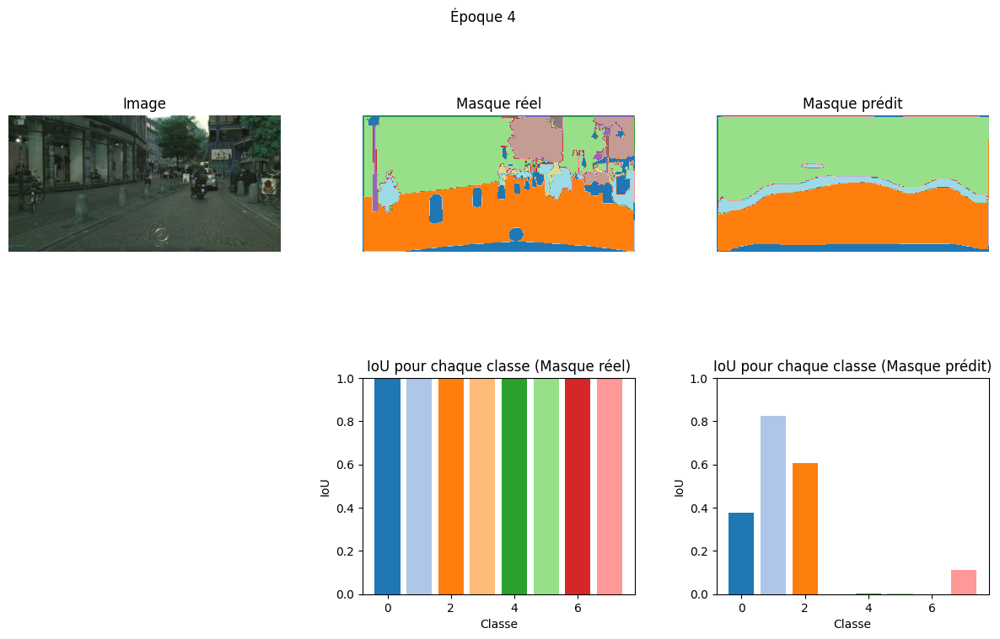

38/38 ━━━━━━━━━━━━━━━━━━━━ 689s 18s/step - accuracy: 0.6198 - dice_coeff: 0.5111 - dice_loss: 0.4889 - jaccard_score: 0.3442 - loss: 1.0196 - total_loss: 2.4751
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.6323 - dice_coeff: 0.5448 - dice_loss: 0.4552 - jaccard_score: 0.3747 -


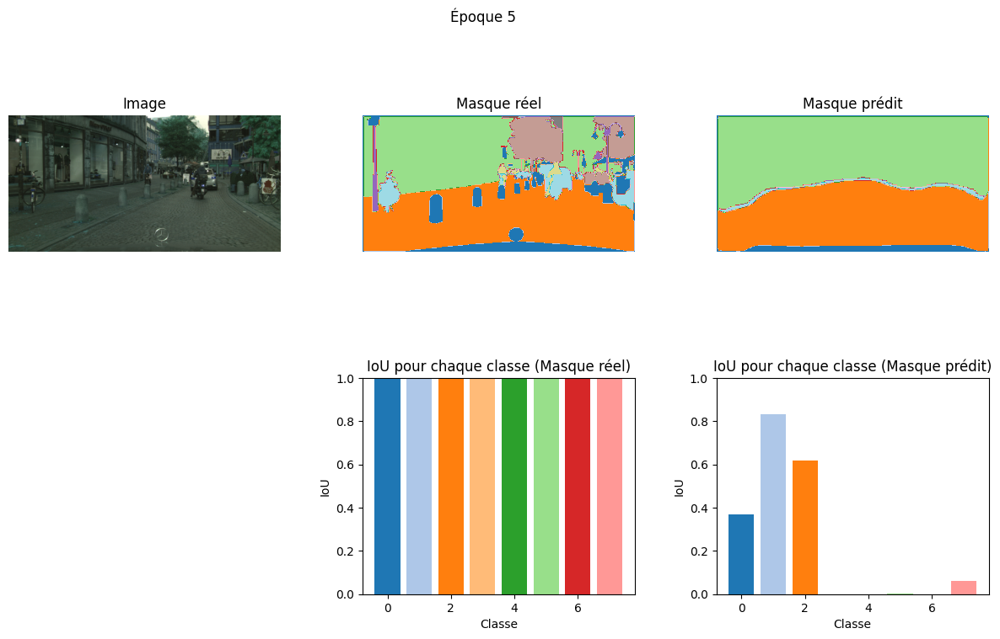

38/38 ━━━━━━━━━━━━━━━━━━━━ 684s 18s/step - accuracy: 0.6323 - dice_coeff: 0.5448 - dice_loss: 0.4552 - jaccard_score: 0.3747 - loss: 0.9256 - total_loss: 2.4520
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.6438 - dice_coeff: 0.5727 - dice_loss: 0.4273 - jaccard_score: 0.4015 -


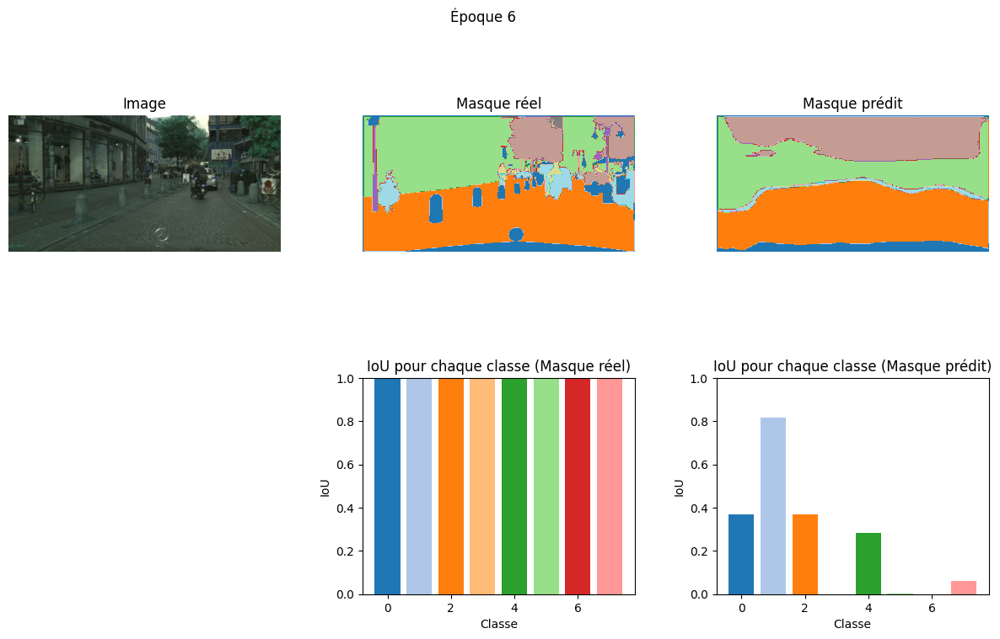

38/38 ━━━━━━━━━━━━━━━━━━━━ 685s 18s/step - accuracy: 0.6440 - dice_coeff: 0.5726 - dice_loss: 0.4274 - jaccard_score: 0.4015 - loss: 0.8565 - total_loss: 2.3315
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.6773 - dice_coeff: 0.5948 - dice_loss: 0.4052 - jaccard_score: 0.4238 -


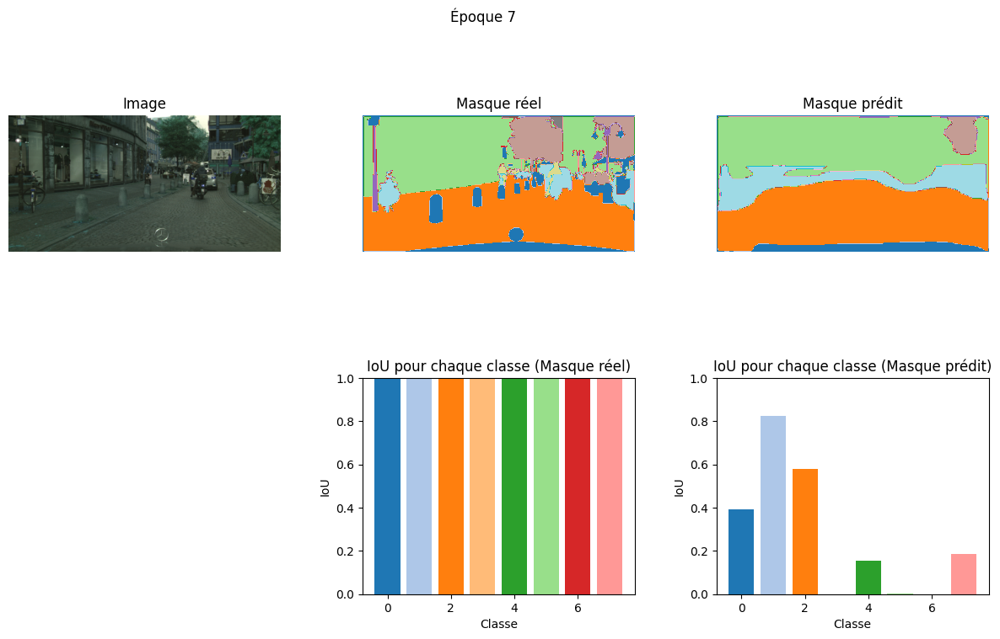

38/38 ━━━━━━━━━━━━━━━━━━━━ 678s 18s/step - accuracy: 0.6773 - dice_coeff: 0.5946 - dice_loss: 0.4054 - jaccard_score: 0.4235 - loss: 0.8131 - total_loss: 2.2791
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.6945 - dice_coeff: 0.6072 - dice_loss: 0.3928 - jaccard_score: 0.4363 -


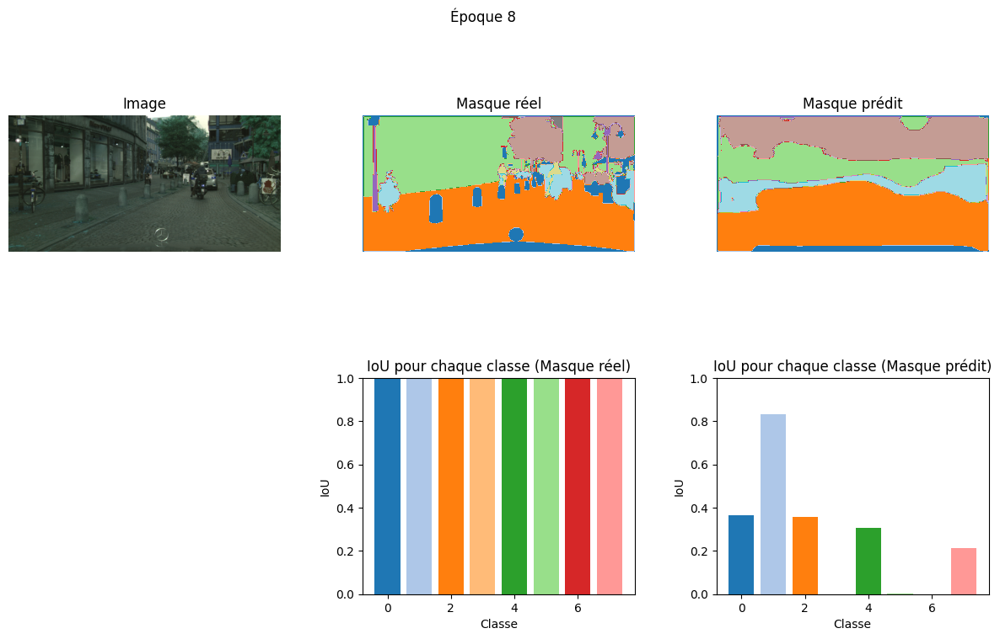

38/38 ━━━━━━━━━━━━━━━━━━━━ 682s 18s/step - accuracy: 0.6943 - dice_coeff: 0.6069 - dice_loss: 0.3931 - jaccard_score: 0.4361 - loss: 0.8075 - total_loss: 2.3002
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.6999 - dice_coeff: 0.6032 - dice_loss: 0.3968 - jaccard_score: 0.4325 -


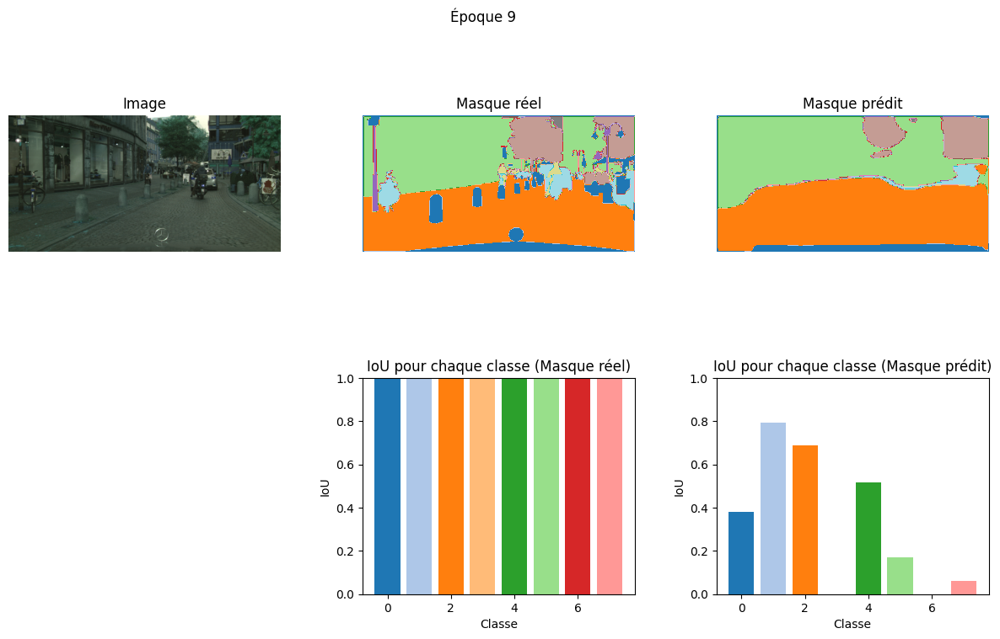

38/38 ━━━━━━━━━━━━━━━━━━━━ 675s 18s/step - accuracy: 0.7002 - dice_coeff: 0.6035 - dice_loss: 0.3965 - jaccard_score: 0.4328 - loss: 0.8205 - total_loss: 2.2500
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7063 - dice_coeff: 0.6204 - dice_loss: 0.3796 - jaccard_score: 0.4503 -


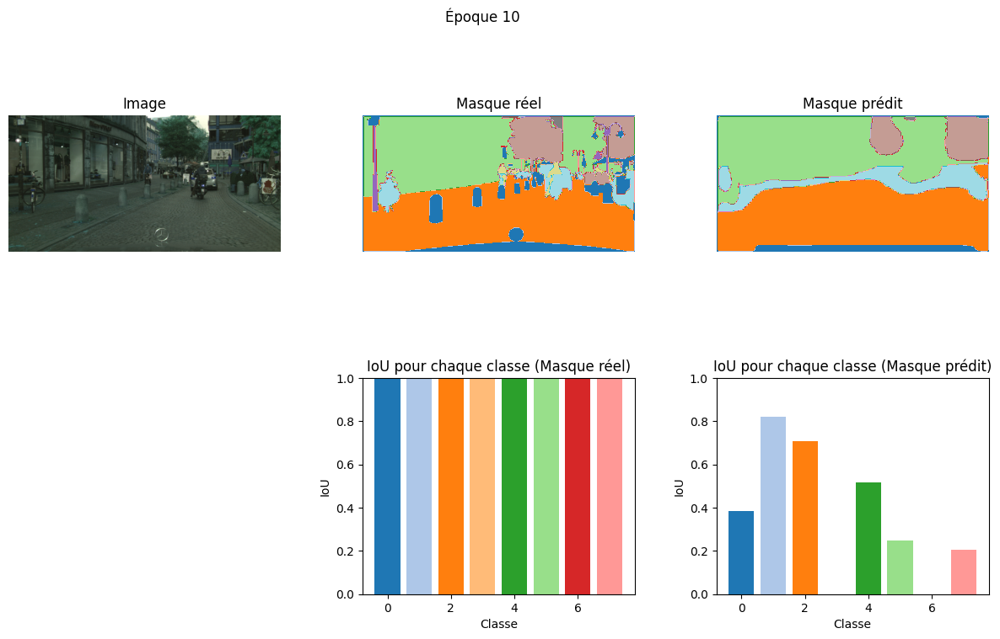

38/38 ━━━━━━━━━━━━━━━━━━━━ 679s 18s/step - accuracy: 0.7065 - dice_coeff: 0.6205 - dice_loss: 0.3795 - jaccard_score: 0.4504 - loss: 0.7852 - total_loss: 2.2330
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7180 - dice_coeff: 0.6205 - dice_loss: 0.3795 - jaccard_score: 0.4506 -


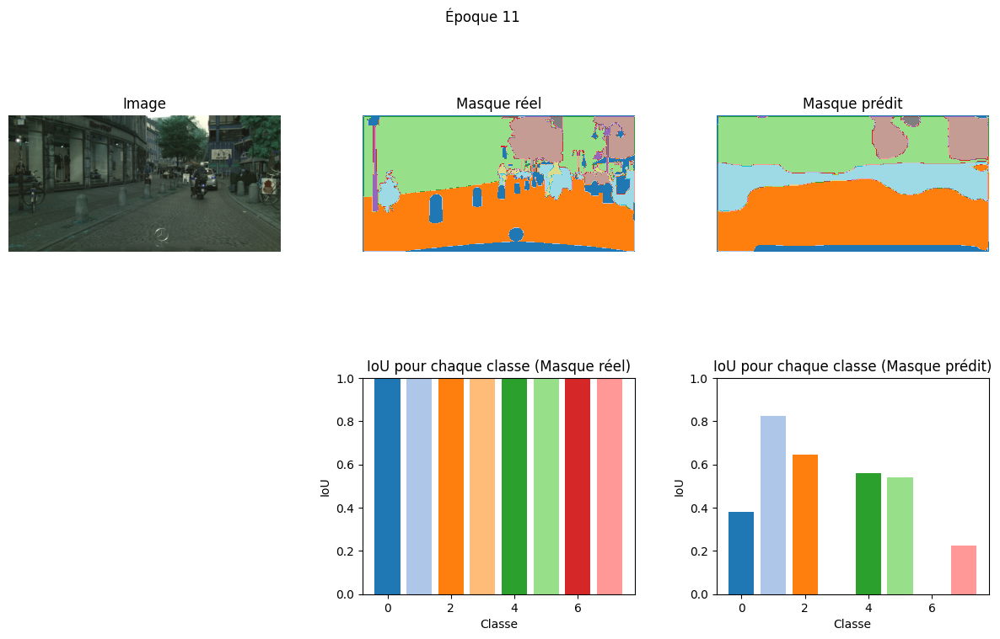

38/38 ━━━━━━━━━━━━━━━━━━━━ 673s 18s/step - accuracy: 0.7180 - dice_coeff: 0.6205 - dice_loss: 0.3795 - jaccard_score: 0.4506 - loss: 0.7786 - total_loss: 2.1853
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.7184 - dice_coeff: 0.6245 - dice_loss: 0.3755 - jaccard_score: 0.4552 -


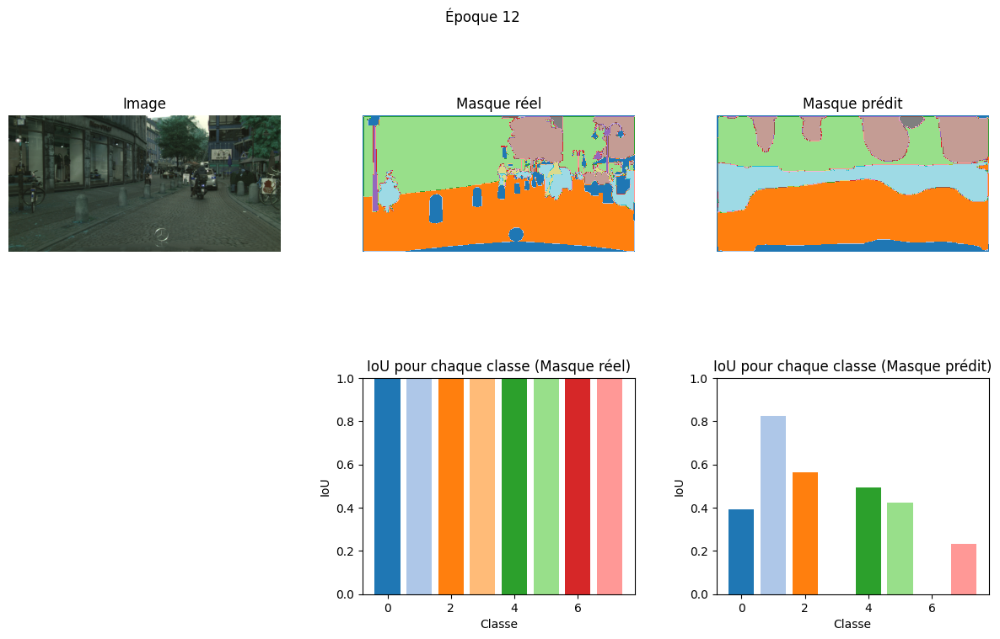

38/38 ━━━━━━━━━━━━━━━━━━━━ 644s 17s/step - accuracy: 0.7187 - dice_coeff: 0.6247 - dice_loss: 0.3753 - jaccard_score: 0.4555 - loss: 0.7736 - total_loss: 2.2062
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.7467 - dice_coeff: 0.6576 - dice_loss: 0.3424 - jaccard_score: 0.4906 -


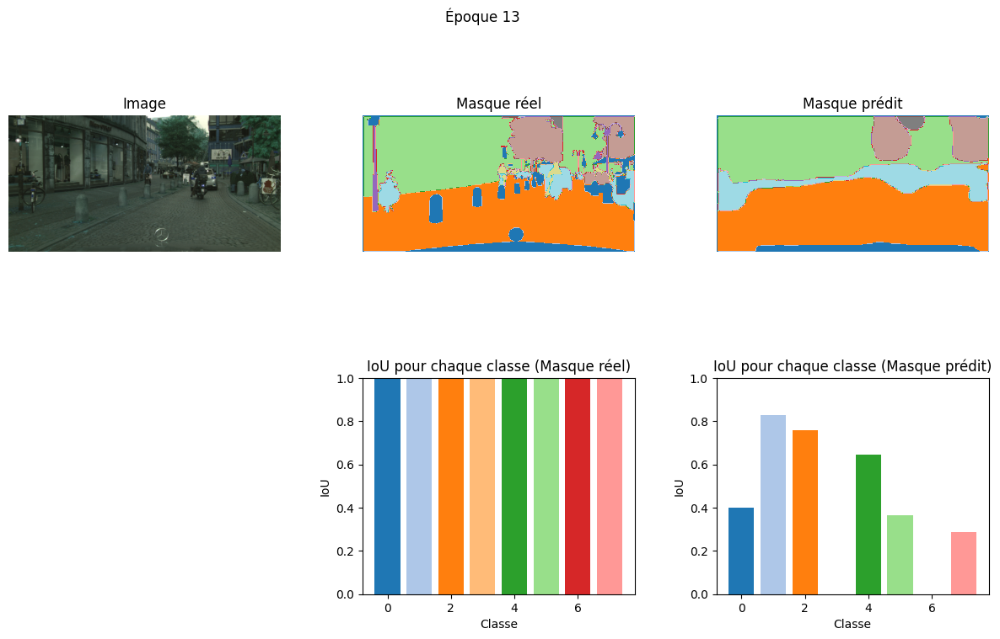

38/38 ━━━━━━━━━━━━━━━━━━━━ 646s 17s/step - accuracy: 0.7465 - dice_coeff: 0.6575 - dice_loss: 0.3425 - jaccard_score: 0.4905 - loss: 0.7277 - total_loss: 2.1262
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7532 - dice_coeff: 0.6610 - dice_loss: 0.3390 - jaccard_score: 0.4942 -


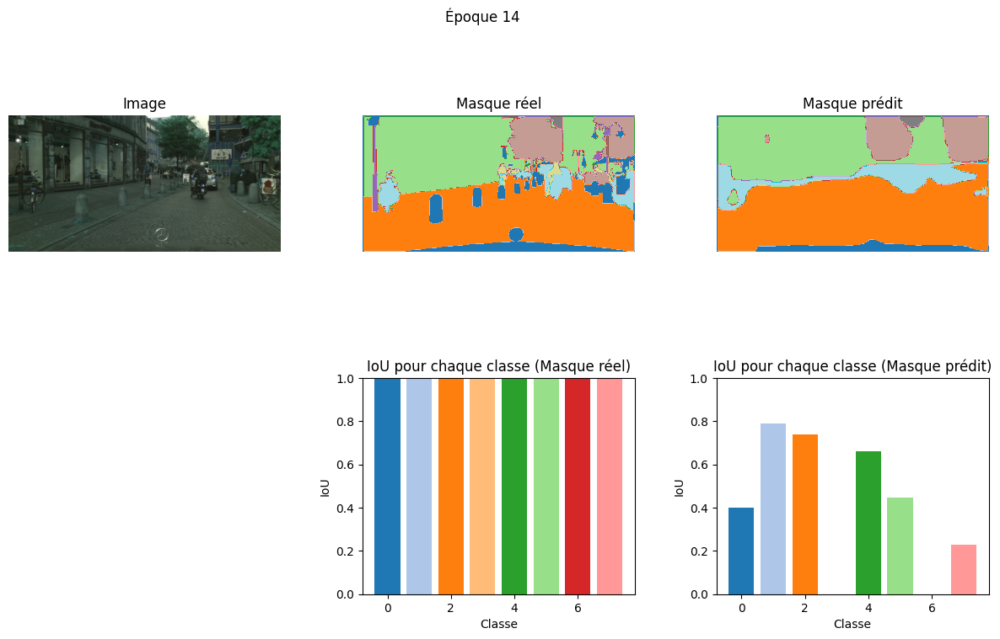

38/38 ━━━━━━━━━━━━━━━━━━━━ 677s 18s/step - accuracy: 0.7533 - dice_coeff: 0.6612 - dice_loss: 0.3388 - jaccard_score: 0.4944 - loss: 0.7094 - total_loss: 2.0832
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7772 - dice_coeff: 0.6904 - dice_loss: 0.3096 - jaccard_score: 0.5277 -


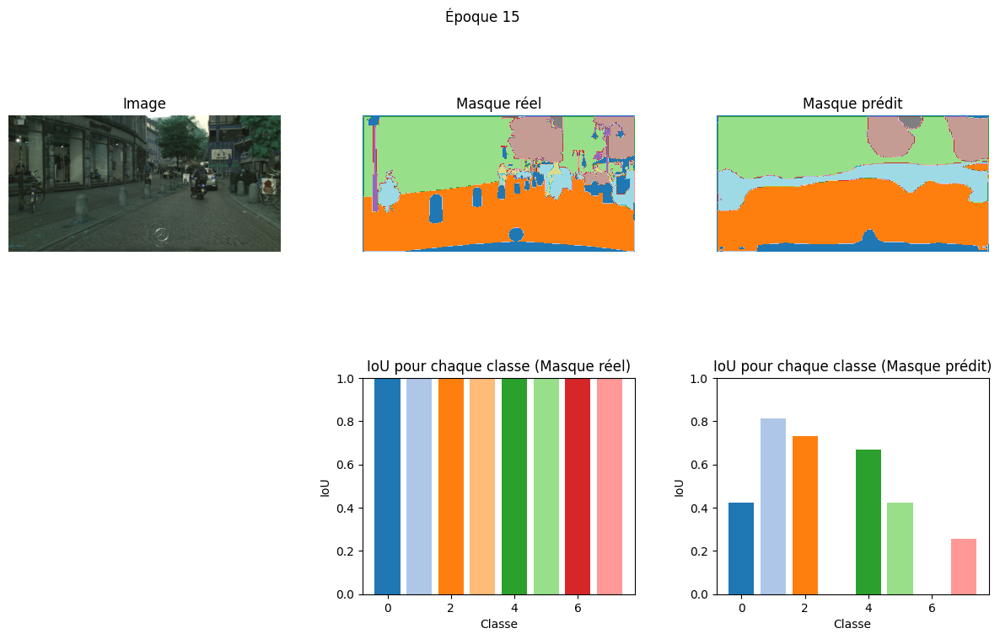

38/38 ━━━━━━━━━━━━━━━━━━━━ 677s 18s/step - accuracy: 0.7770 - dice_coeff: 0.6903 - dice_loss: 0.3097 - jaccard_score: 0.5276 - loss: 0.6518 - total_loss: 2.0247
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7673 - dice_coeff: 0.6780 - dice_loss: 0.3220 - jaccard_score: 0.5138 -


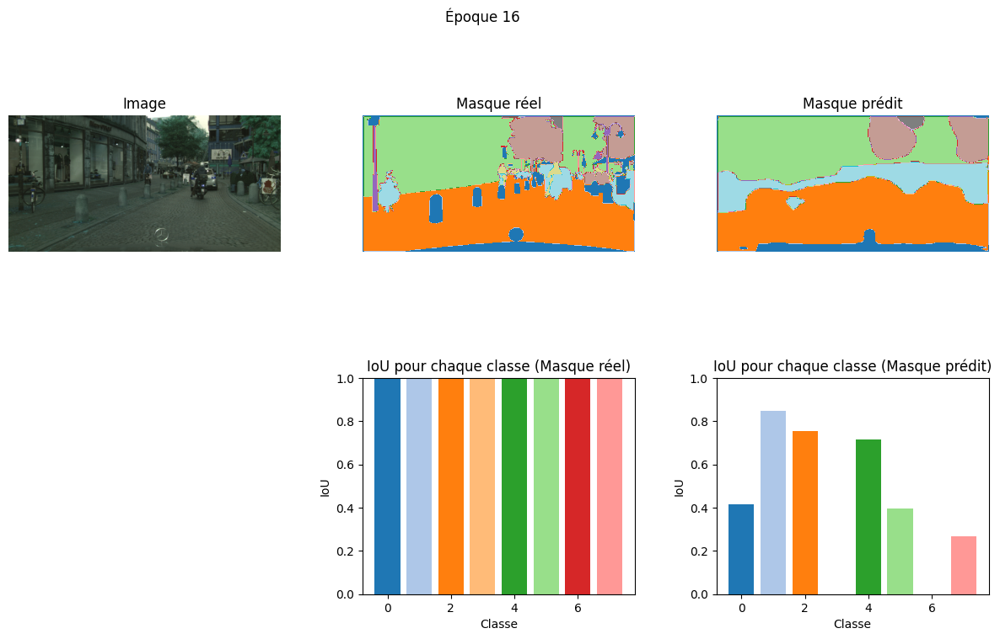

38/38 ━━━━━━━━━━━━━━━━━━━━ 666s 17s/step - accuracy: 0.7675 - dice_coeff: 0.6781 - dice_loss: 0.3219 - jaccard_score: 0.5140 - loss: 0.6680 - total_loss: 2.0292
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7796 - dice_coeff: 0.6925 - dice_loss: 0.3075 - jaccard_score: 0.5303 -


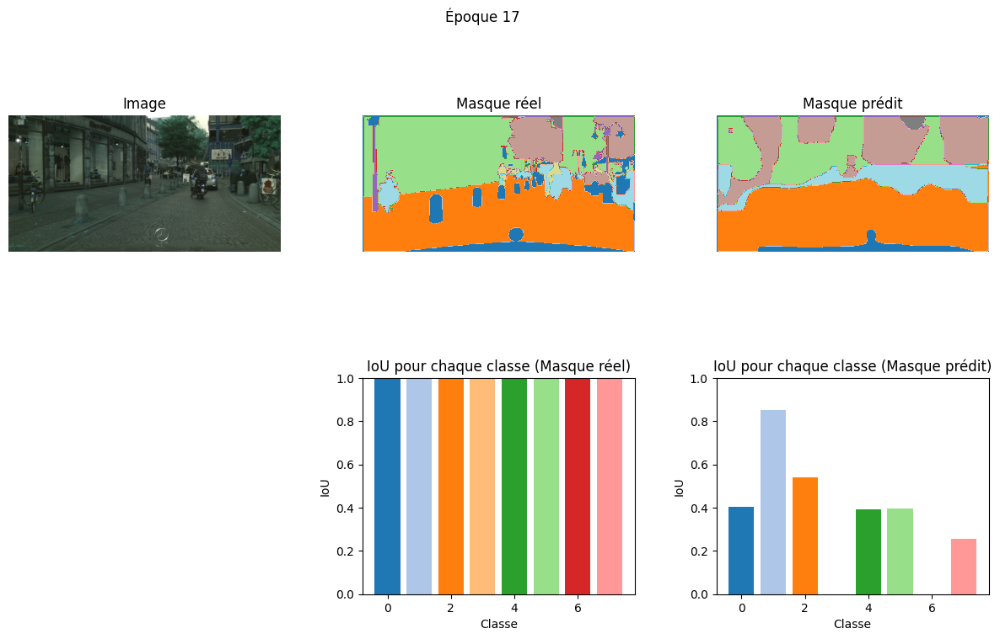

38/38 ━━━━━━━━━━━━━━━━━━━━ 650s 17s/step - accuracy: 0.7794 - dice_coeff: 0.6924 - dice_loss: 0.3076 - jaccard_score: 0.5301 - loss: 0.6456 - total_loss: 2.0844
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.7791 - dice_coeff: 0.6936 - dice_loss: 0.3064 - jaccard_score: 0.5316 -


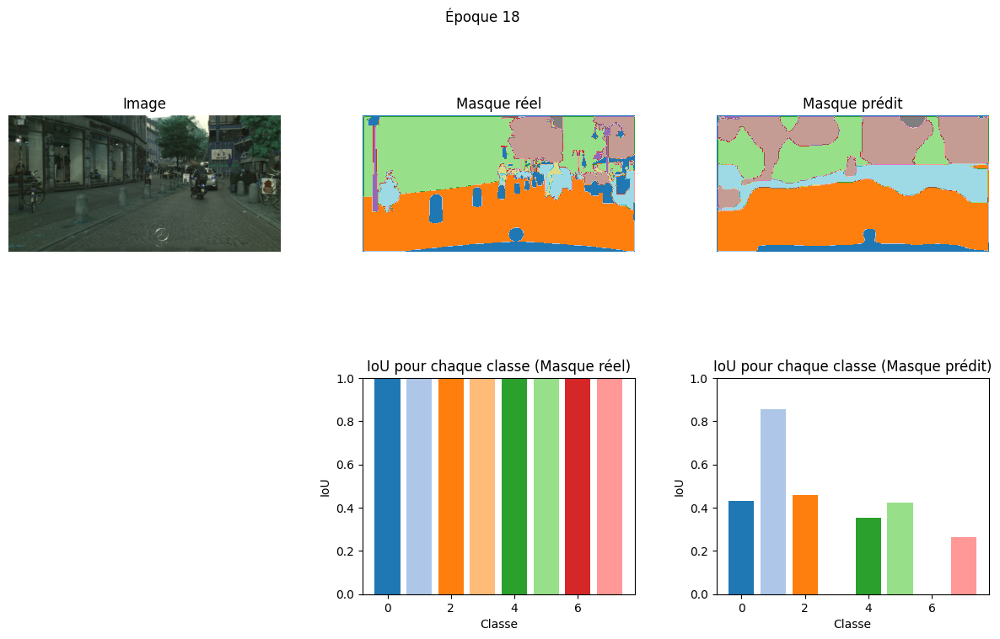

38/38 ━━━━━━━━━━━━━━━━━━━━ 647s 17s/step - accuracy: 0.7790 - dice_coeff: 0.6934 - dice_loss: 0.3066 - jaccard_score: 0.5314 - loss: 0.6450 - total_loss: 2.0322
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7964 - dice_coeff: 0.7107 - dice_loss: 0.2893 - jaccard_score: 0.5518 -


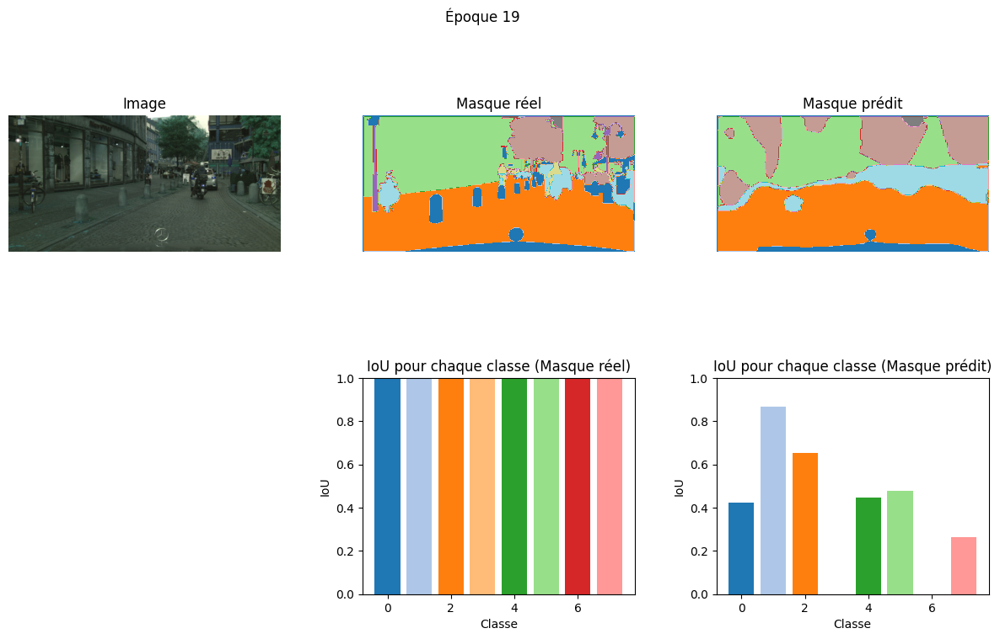

38/38 ━━━━━━━━━━━━━━━━━━━━ 650s 17s/step - accuracy: 0.7964 - dice_coeff: 0.7108 - dice_loss: 0.2892 - jaccard_score: 0.5518 - loss: 0.6052 - total_loss: 1.9699
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7970 - dice_coeff: 0.7159 - dice_loss: 0.2841 - jaccard_score: 0.5585 -


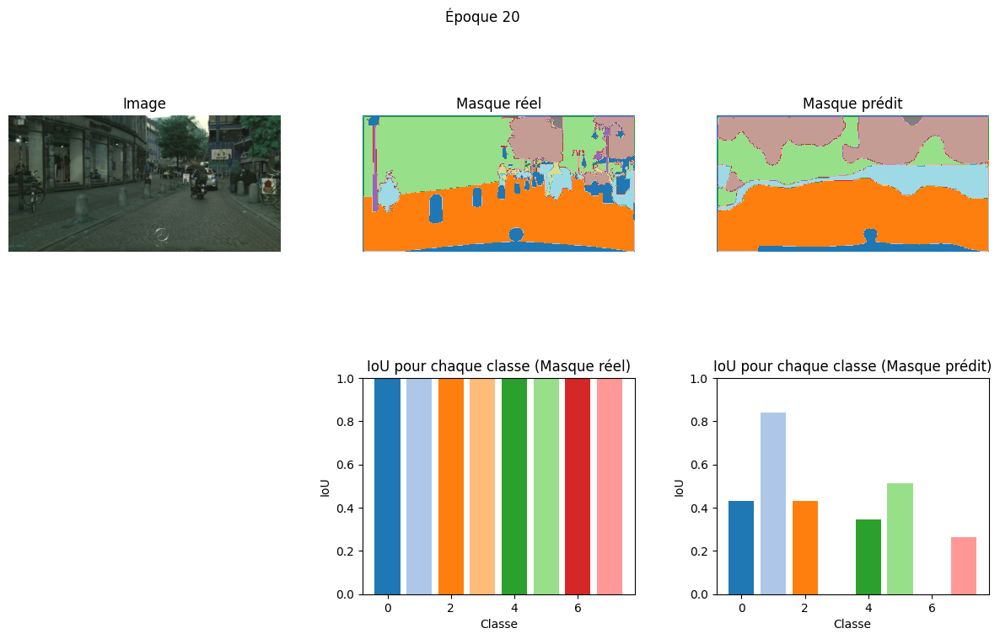

38/38 ━━━━━━━━━━━━━━━━━━━━ 671s 18s/step - accuracy: 0.7969 - dice_coeff: 0.7157 - dice_loss: 0.2843 - jaccard_score: 0.5582 - loss: 0.6067 - total_loss: 1.9865


In [26]:
# Chargement des données
images = load_images(df_train_sample)  # Charger les images
masks = load_masks(df_train_sample)    # Charger les masques

# Construction du modèle de segmentation
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 512, 3))

# Utilisation de la sortie d'un bloc intermédiaire pour conserver des détails spatiaux
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])
x = layer_dict['block5_conv3'].output

# Ajout de couches de déconvolution pour la segmentation
x = UpSampling2D((2, 2))(x)
x = Conv2D(512, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(256, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(128, (3, 3), padding='same', activation='relu')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(64, (3, 3), padding='same', activation='relu')(x)

# Dernière couche pour le nombre de classes
output = Conv2D(len(cats), (1, 1), padding='same', activation='softmax')(x)

# Définition du modèle final
model = Model(inputs=base_model.input, outputs=output)

# Compilation du modèle
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=[dice_coeff, dice_loss, total_loss, jaccard_score, 'accuracy'])

# Entraînement du modèle avec le callback
history = model.fit(
    images,
    masks,
    batch_size=8,
    epochs=20,
    callbacks=[PredictionCallback()]
)

# Data augmentation

## Avec Albumentations

### Fonctions

In [39]:
# Fonction de data augmentation avec albumentations
def augment_data_albumentations(df):
    images = load_images(df)
    masks = load_masks(df)
    
    # Définir les transformations avec redimensionnement
    transform = A.Compose([
        A.HorizontalFlip(p=0.5),            # Flip horizontal avec probabilité 50%
        A.VerticalFlip(p=0.2),              # Flip vertical avec probabilité 20%
        A.Rotate(limit=10),                 # Rotation aléatoire entre -10 et 10 degrés
        A.RandomScale(scale_limit=0.2),     # Zoom de 80% à 120%
        A.Resize(256, 512)                  # Redimensionnement pour garantir une taille constante
    ])
    
    # Appliquer les transformations sur les images et masques
    images_aug, masks_aug = [], []
    for img, mask in zip(images, masks):
        augmented = transform(image=img, mask=mask)
        images_aug.append(augmented['image'])
        masks_aug.append(augmented['mask'])
    
    return np.array(images_aug), np.array(masks_aug)

In [40]:
# Fonction de data augmentation avec transformations supplémentaires
def augment_data_albumentations_extended(df):
    images = load_images(df)
    masks = load_masks(df)
    
    # Définir les transformations avec des manipulations supplémentaires
    transform = A.Compose([
        # Transformations de la première fonction
        A.HorizontalFlip(p=0.5),                # Flip horizontal avec probabilité 50%
        A.VerticalFlip(p=0.2),                  # Flip vertical avec probabilité 20%
        A.Rotate(limit=10),                     # Rotation aléatoire entre -10 et 10 degrés
        A.RandomScale(scale_limit=0.2),         # Zoom de 80% à 120%
        
        # Transformations supplémentaires
        A.RandomBrightnessContrast(p=0.2),      # Ajuste la luminosité et le contraste
        A.GaussianBlur(blur_limit=(3, 7), p=0.2), # Applique un flou gaussien avec une certaine probabilité
        A.HueSaturationValue(p=0.3),            # Modifie la teinte, la saturation et la valeur des couleurs
        A.ElasticTransform(p=0.1),              # Applique des distorsions élastiques (déformation non linéaire)
        A.GridDistortion(p=0.1),                # Applique une distorsion en grille pour un effet de déformation
        A.Resize(256, 512)                      # Redimensionnement pour garantir une taille constante
    ])
    
    # Appliquer les transformations sur les images et masques
    images_aug, masks_aug = [], []
    for img, mask in zip(images, masks):
        augmented = transform(image=img, mask=mask)
        images_aug.append(augmented['image'])
        masks_aug.append(augmented['mask'])
    
    return np.array(images_aug), np.array(masks_aug)

### Entraînement du modèle

#### Entraînement 1

In [41]:
# Utilisation de la fonction d'augmentation avec albumentations
images_aug, masks_aug = augment_data_albumentations(df_train_sample)

Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.5623 - dice_coeff: 0.4367 - dice_loss: 0.5633 - jaccard_score: 0.2846 -


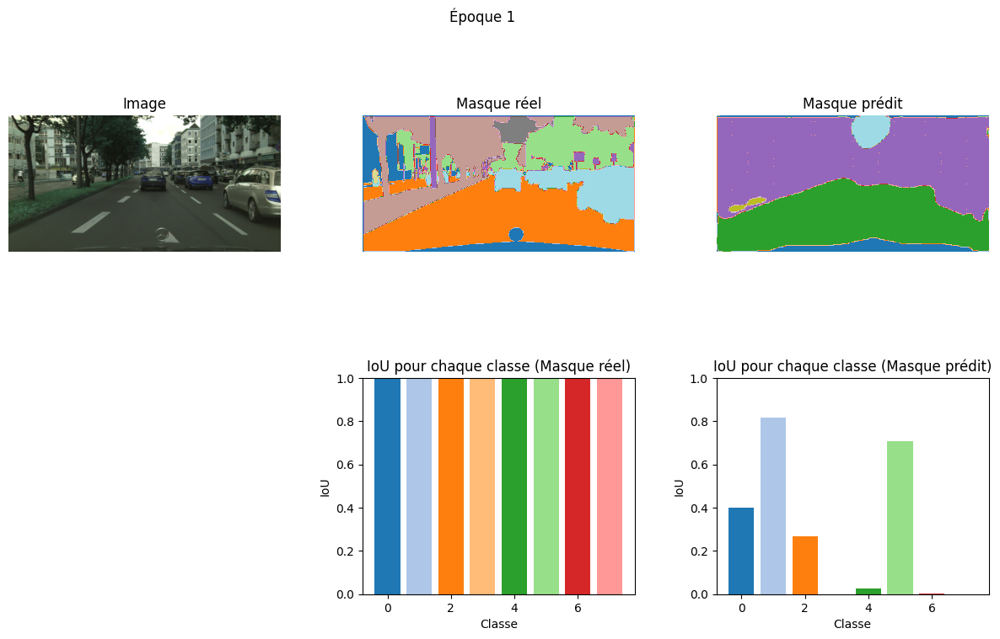

38/38 ━━━━━━━━━━━━━━━━━━━━ 640s 17s/step - accuracy: 0.5639 - dice_coeff: 0.4385 - dice_loss: 0.5615 - jaccard_score: 0.2861 - loss: 1.1691 - total_loss: 2.4460
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.6229 - dice_coeff: 0.5360 - dice_loss: 0.4640 - jaccard_score: 0.3679 -


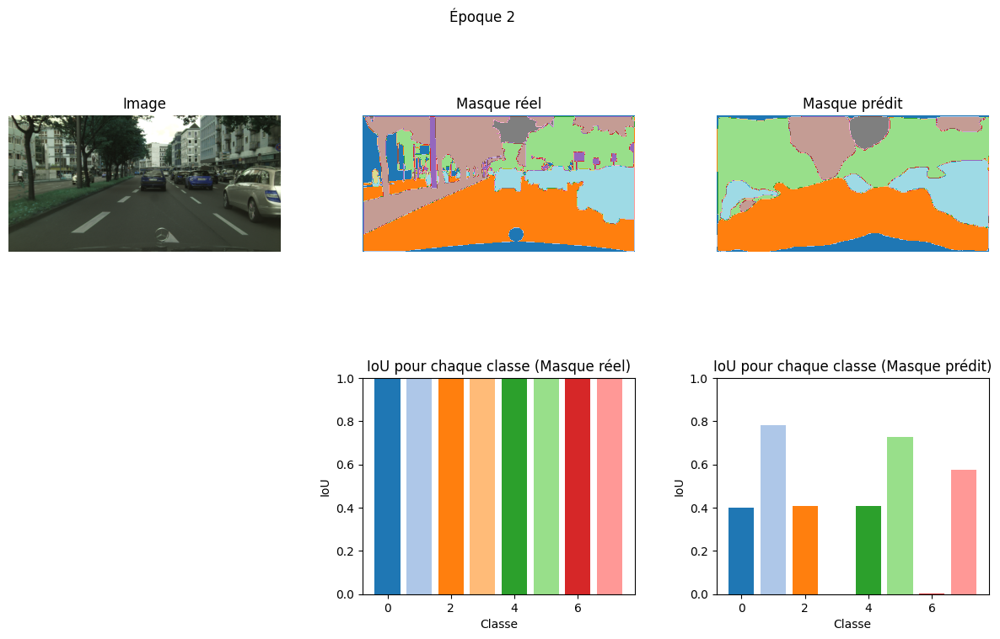

38/38 ━━━━━━━━━━━━━━━━━━━━ 654s 17s/step - accuracy: 0.6237 - dice_coeff: 0.5366 - dice_loss: 0.4634 - jaccard_score: 0.3684 - loss: 1.0172 - total_loss: 2.1355
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7453 - dice_coeff: 0.6335 - dice_loss: 0.3665 - jaccard_score: 0.4646 -


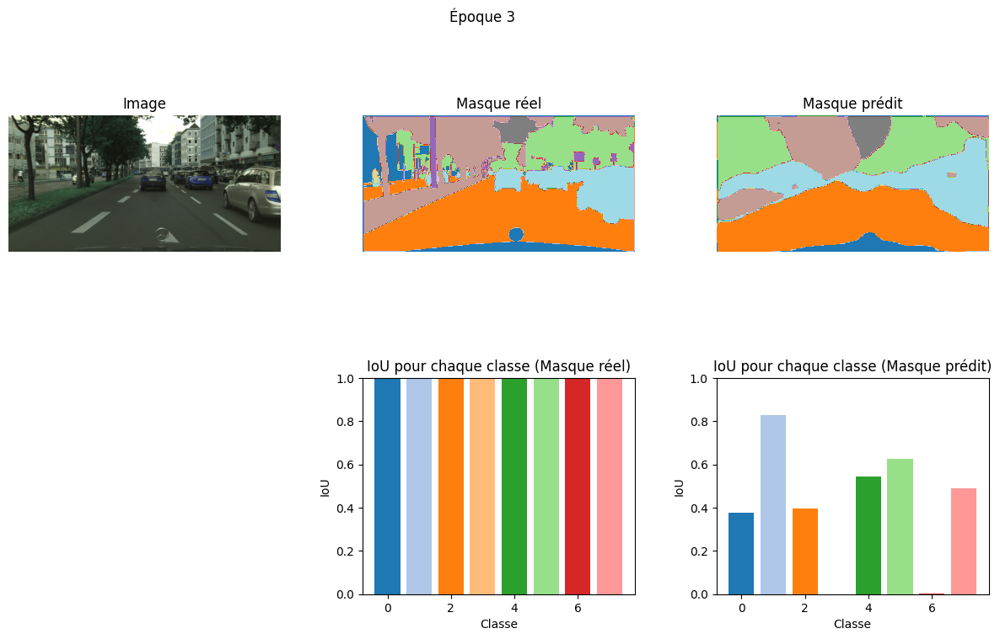

38/38 ━━━━━━━━━━━━━━━━━━━━ 666s 18s/step - accuracy: 0.7449 - dice_coeff: 0.6331 - dice_loss: 0.3669 - jaccard_score: 0.4642 - loss: 0.7738 - total_loss: 1.8970
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7477 - dice_coeff: 0.6405 - dice_loss: 0.3595 - jaccard_score: 0.4721 -


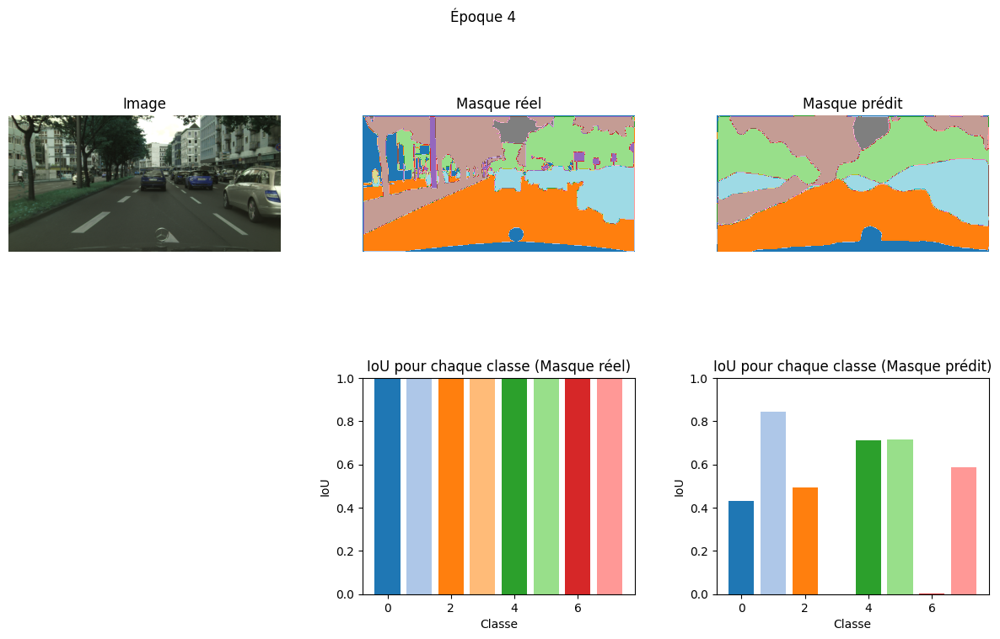

38/38 ━━━━━━━━━━━━━━━━━━━━ 667s 18s/step - accuracy: 0.7481 - dice_coeff: 0.6410 - dice_loss: 0.3590 - jaccard_score: 0.4728 - loss: 0.7538 - total_loss: 1.8648
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7803 - dice_coeff: 0.6857 - dice_loss: 0.3143 - jaccard_score: 0.5225 -


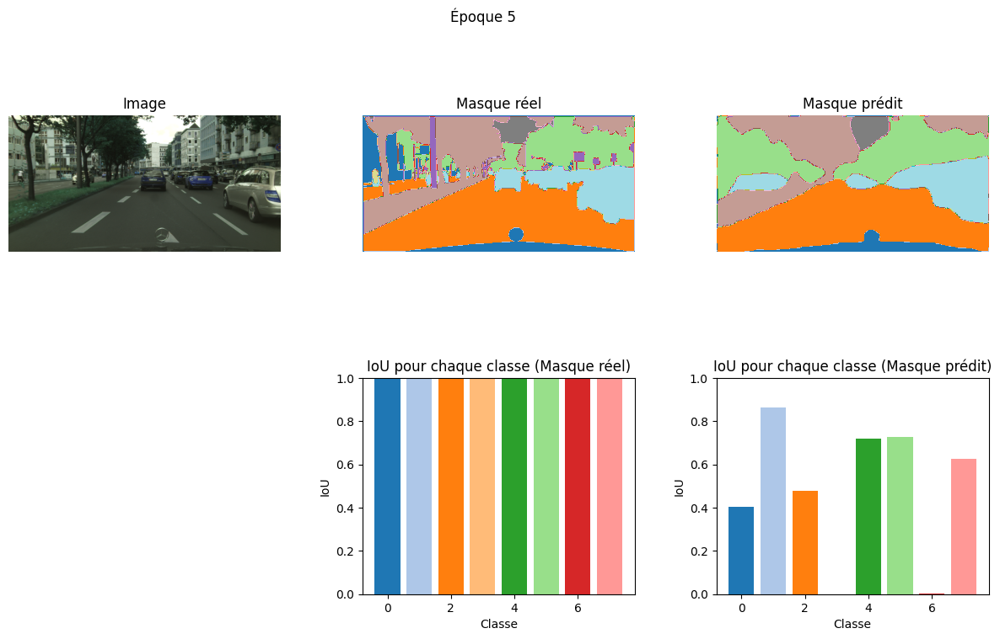

38/38 ━━━━━━━━━━━━━━━━━━━━ 664s 18s/step - accuracy: 0.7805 - dice_coeff: 0.6860 - dice_loss: 0.3140 - jaccard_score: 0.5228 - loss: 0.6711 - total_loss: 1.7120
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8097 - dice_coeff: 0.7220 - dice_loss: 0.2780 - jaccard_score: 0.5654 -


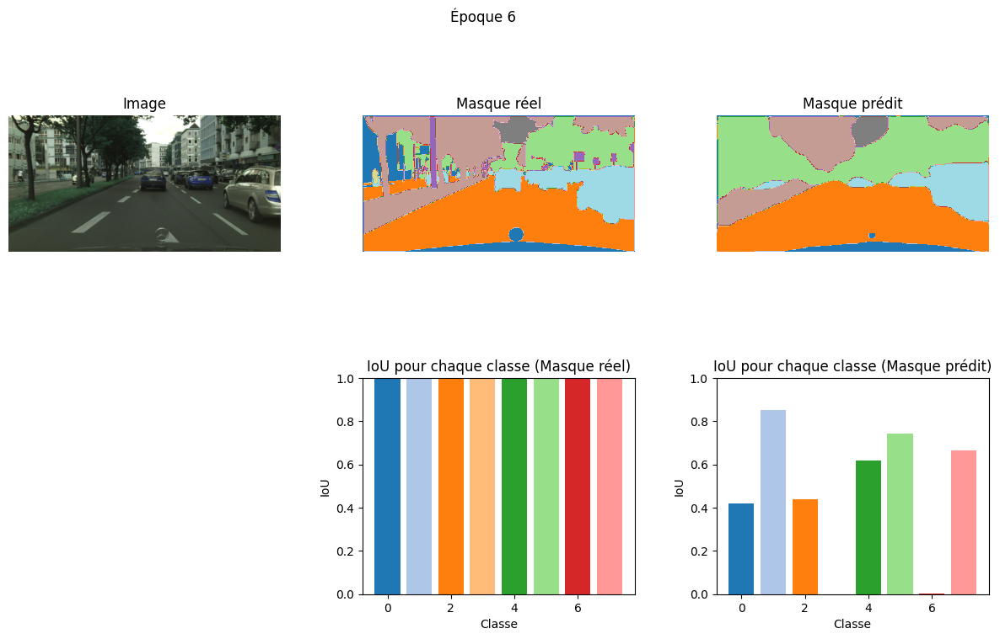

38/38 ━━━━━━━━━━━━━━━━━━━━ 667s 18s/step - accuracy: 0.8096 - dice_coeff: 0.7218 - dice_loss: 0.2782 - jaccard_score: 0.5652 - loss: 0.5855 - total_loss: 1.6578
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8052 - dice_coeff: 0.7186 - dice_loss: 0.2814 - jaccard_score: 0.5621 -


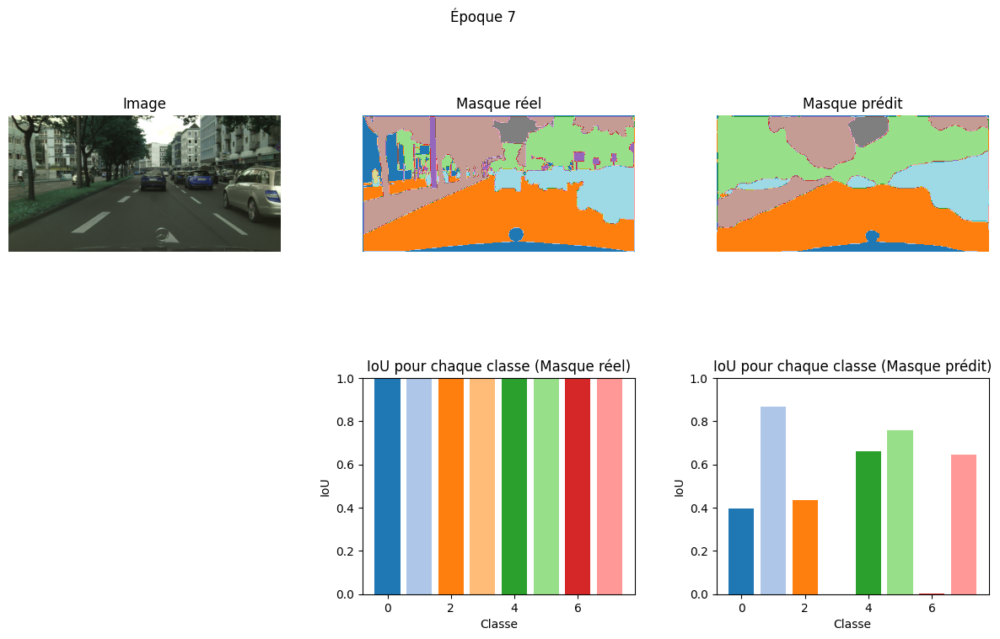

38/38 ━━━━━━━━━━━━━━━━━━━━ 660s 17s/step - accuracy: 0.8053 - dice_coeff: 0.7187 - dice_loss: 0.2813 - jaccard_score: 0.5621 - loss: 0.5994 - total_loss: 1.6686
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8059 - dice_coeff: 0.7200 - dice_loss: 0.2800 - jaccard_score: 0.5633 -


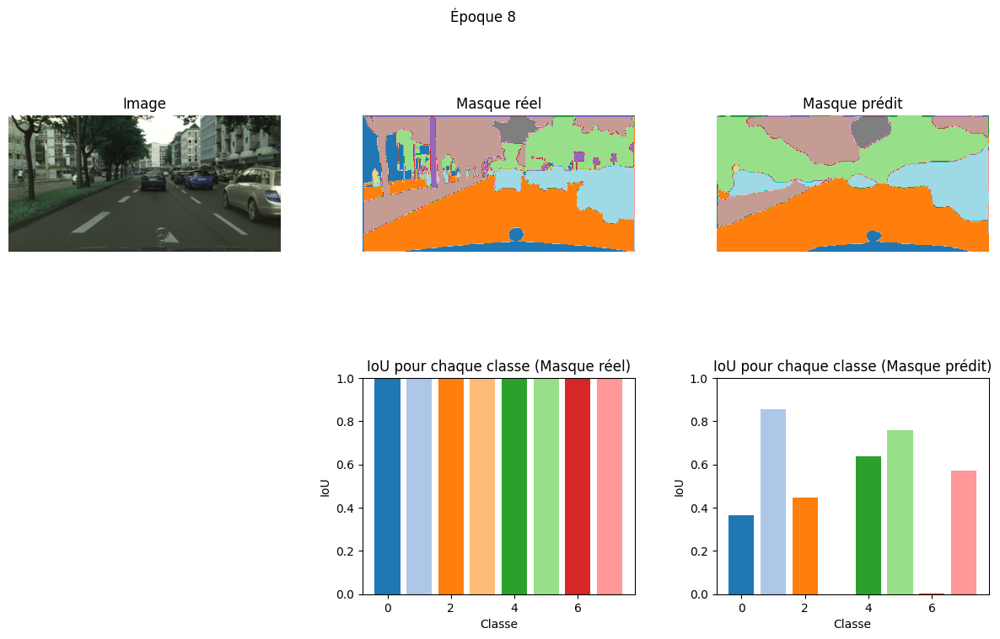

38/38 ━━━━━━━━━━━━━━━━━━━━ 668s 18s/step - accuracy: 0.8060 - dice_coeff: 0.7202 - dice_loss: 0.2798 - jaccard_score: 0.5635 - loss: 0.5997 - total_loss: 1.6550
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8098 - dice_coeff: 0.7300 - dice_loss: 0.2700 - jaccard_score: 0.5756 -


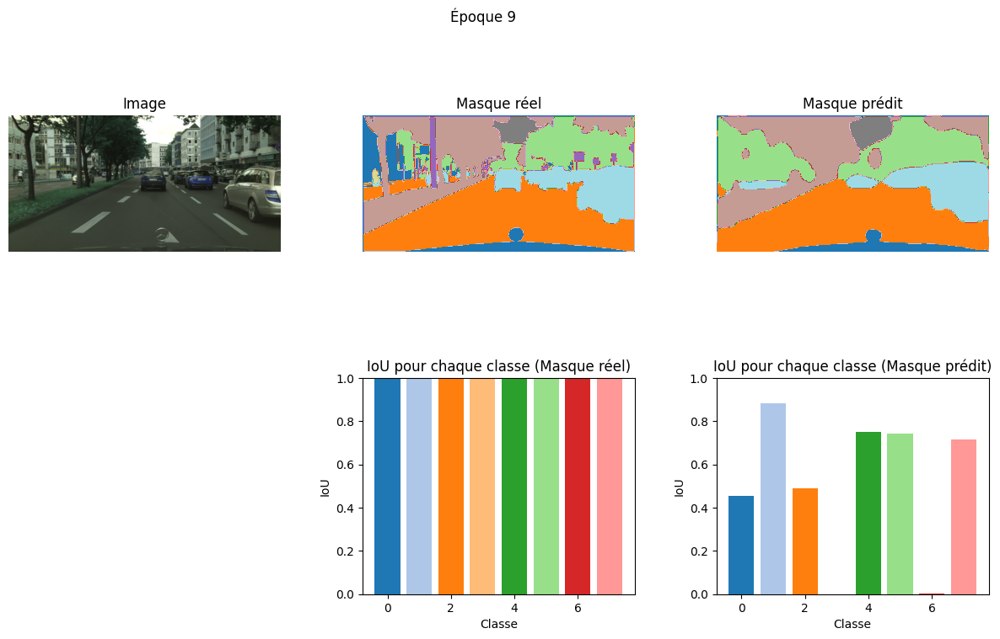

38/38 ━━━━━━━━━━━━━━━━━━━━ 662s 17s/step - accuracy: 0.8101 - dice_coeff: 0.7303 - dice_loss: 0.2697 - jaccard_score: 0.5759 - loss: 0.5801 - total_loss: 1.6894
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8327 - dice_coeff: 0.7568 - dice_loss: 0.2432 - jaccard_score: 0.6094 -


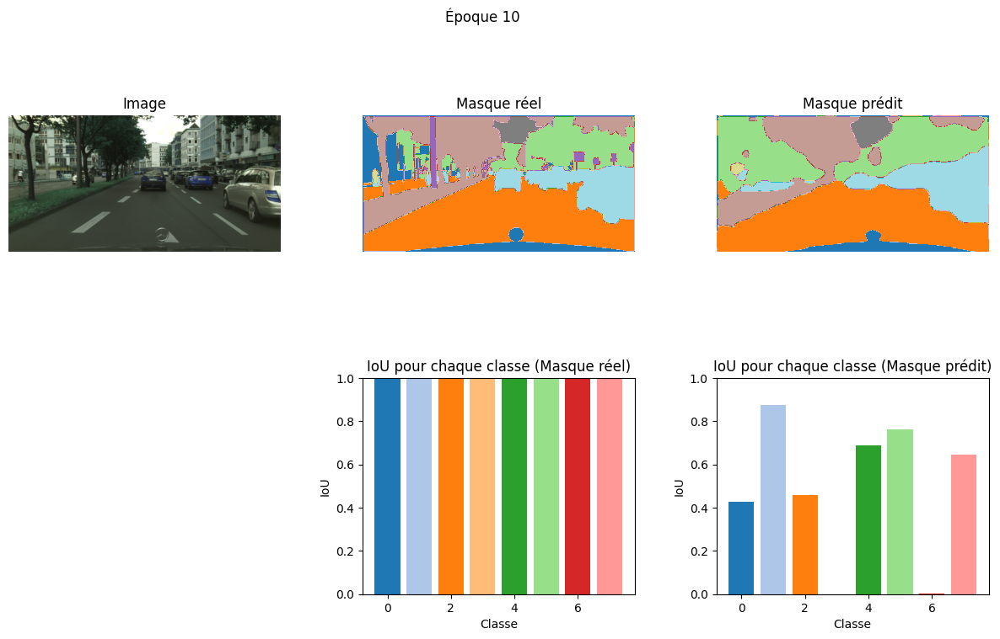

38/38 ━━━━━━━━━━━━━━━━━━━━ 665s 17s/step - accuracy: 0.8325 - dice_coeff: 0.7566 - dice_loss: 0.2434 - jaccard_score: 0.6091 - loss: 0.5084 - total_loss: 1.6536
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8351 - dice_coeff: 0.7602 - dice_loss: 0.2398 - jaccard_score: 0.6138 -


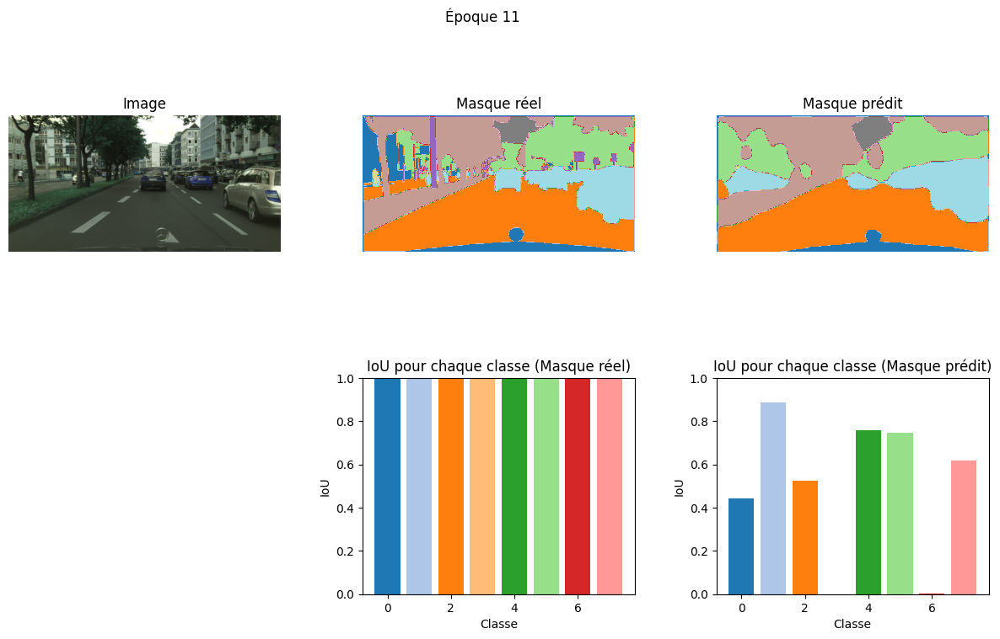

38/38 ━━━━━━━━━━━━━━━━━━━━ 660s 17s/step - accuracy: 0.8350 - dice_coeff: 0.7601 - dice_loss: 0.2399 - jaccard_score: 0.6136 - loss: 0.5017 - total_loss: 1.6861
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.8456 - dice_coeff: 0.7761 - dice_loss: 0.2239 - jaccard_score: 0.6345 -


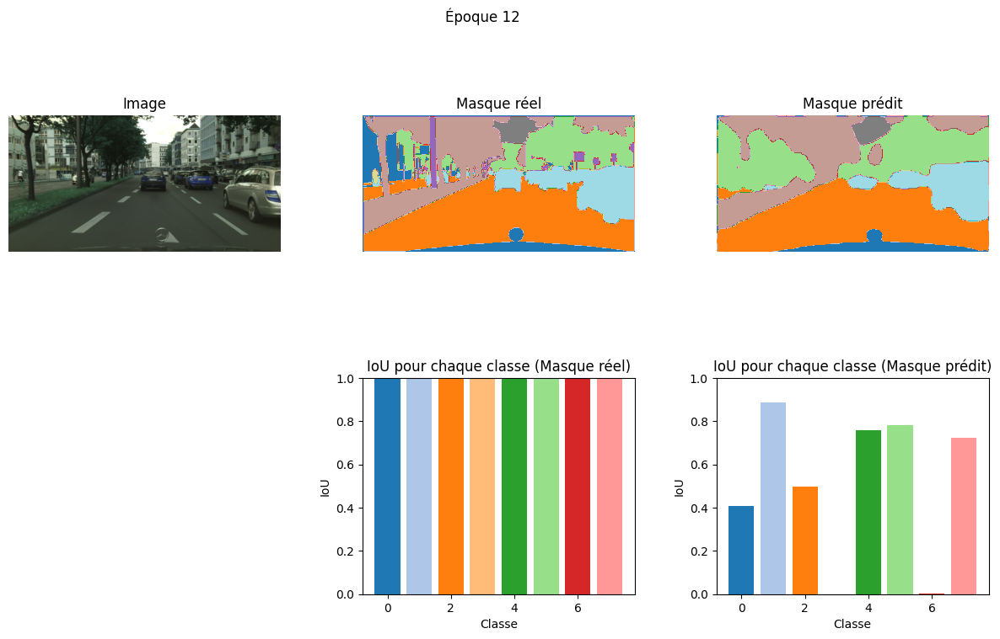

38/38 ━━━━━━━━━━━━━━━━━━━━ 680s 18s/step - accuracy: 0.8456 - dice_coeff: 0.7760 - dice_loss: 0.2240 - jaccard_score: 0.6344 - loss: 0.4680 - total_loss: 1.6974
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.8446 - dice_coeff: 0.7735 - dice_loss: 0.2265 - jaccard_score: 0.6312 -


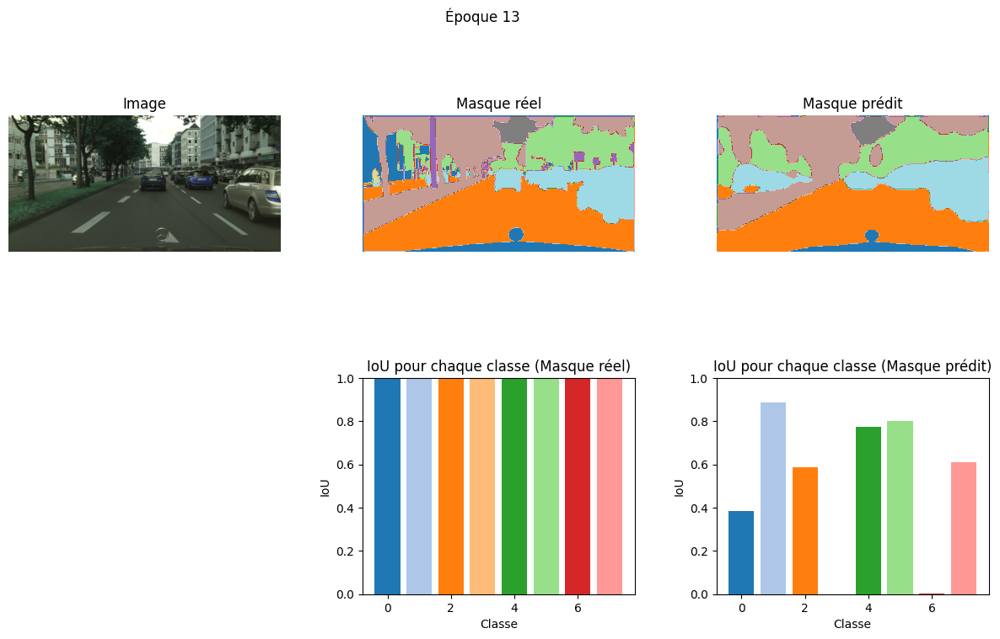

38/38 ━━━━━━━━━━━━━━━━━━━━ 681s 18s/step - accuracy: 0.8446 - dice_coeff: 0.7736 - dice_loss: 0.2264 - jaccard_score: 0.6313 - loss: 0.4662 - total_loss: 1.7248
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8496 - dice_coeff: 0.7848 - dice_loss: 0.2152 - jaccard_score: 0.6465 -


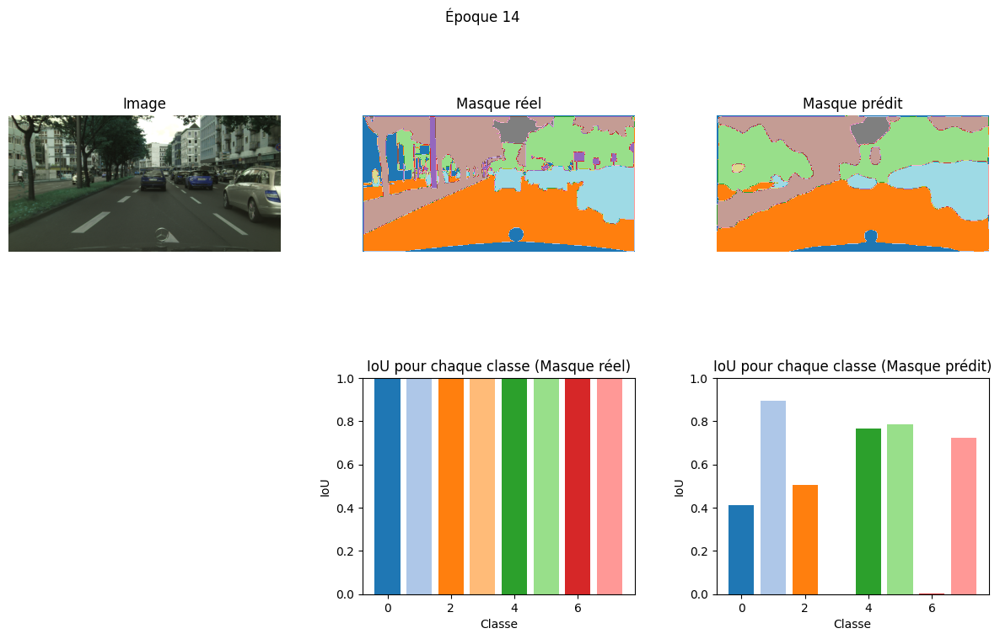

38/38 ━━━━━━━━━━━━━━━━━━━━ 684s 18s/step - accuracy: 0.8497 - dice_coeff: 0.7849 - dice_loss: 0.2151 - jaccard_score: 0.6465 - loss: 0.4529 - total_loss: 1.7336
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8548 - dice_coeff: 0.7929 - dice_loss: 0.2071 - jaccard_score: 0.6572 -


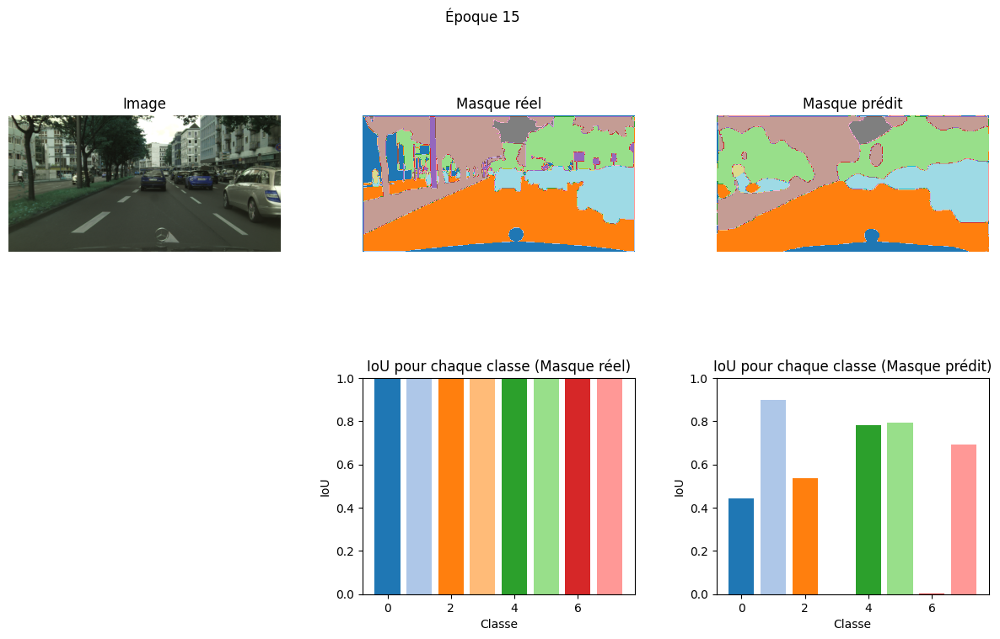

38/38 ━━━━━━━━━━━━━━━━━━━━ 668s 18s/step - accuracy: 0.8549 - dice_coeff: 0.7929 - dice_loss: 0.2071 - jaccard_score: 0.6573 - loss: 0.4313 - total_loss: 1.7898
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8611 - dice_coeff: 0.7980 - dice_loss: 0.2020 - jaccard_score: 0.6643 -


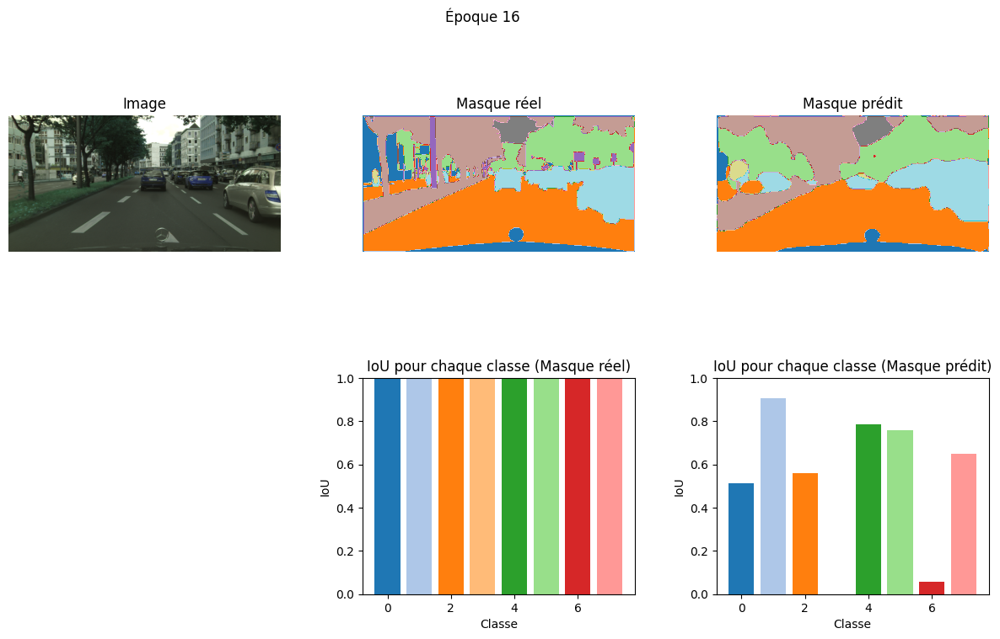

38/38 ━━━━━━━━━━━━━━━━━━━━ 667s 18s/step - accuracy: 0.8612 - dice_coeff: 0.7982 - dice_loss: 0.2018 - jaccard_score: 0.6645 - loss: 0.4108 - total_loss: 1.8200
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8686 - dice_coeff: 0.8104 - dice_loss: 0.1896 - jaccard_score: 0.6814 -


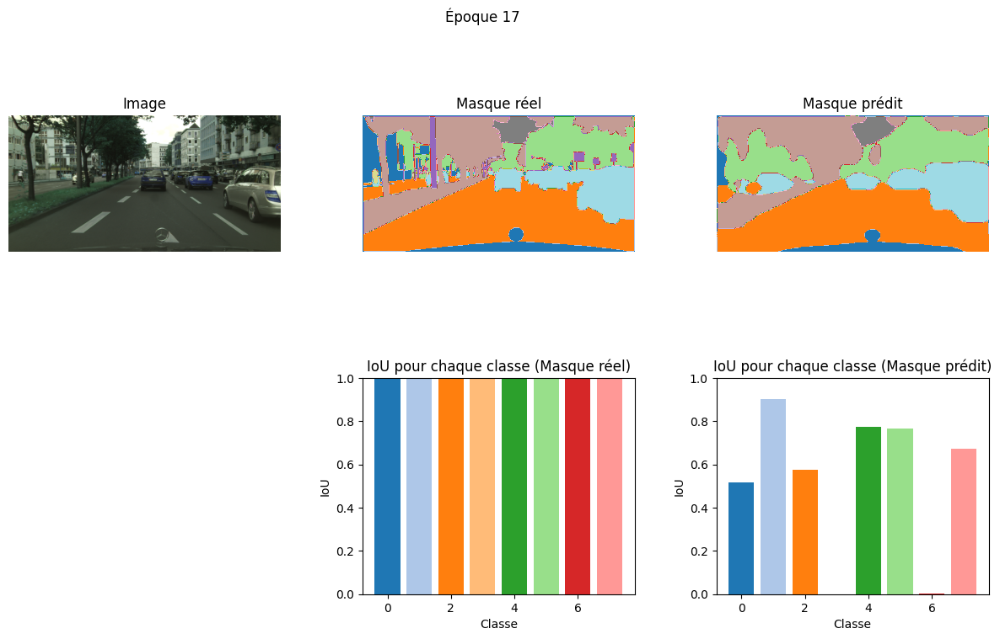

38/38 ━━━━━━━━━━━━━━━━━━━━ 664s 17s/step - accuracy: 0.8685 - dice_coeff: 0.8102 - dice_loss: 0.1898 - jaccard_score: 0.6813 - loss: 0.3891 - total_loss: 1.7921
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8720 - dice_coeff: 0.8153 - dice_loss: 0.1847 - jaccard_score: 0.6885 -


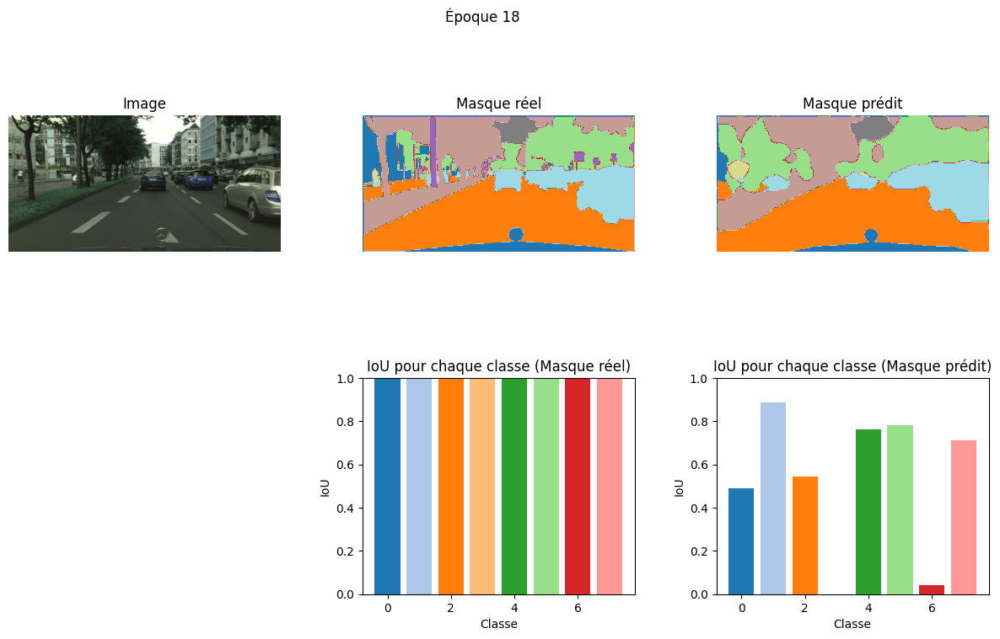

38/38 ━━━━━━━━━━━━━━━━━━━━ 667s 18s/step - accuracy: 0.8720 - dice_coeff: 0.8152 - dice_loss: 0.1848 - jaccard_score: 0.6885 - loss: 0.3798 - total_loss: 1.8161
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8808 - dice_coeff: 0.8284 - dice_loss: 0.1716 - jaccard_score: 0.7073 -


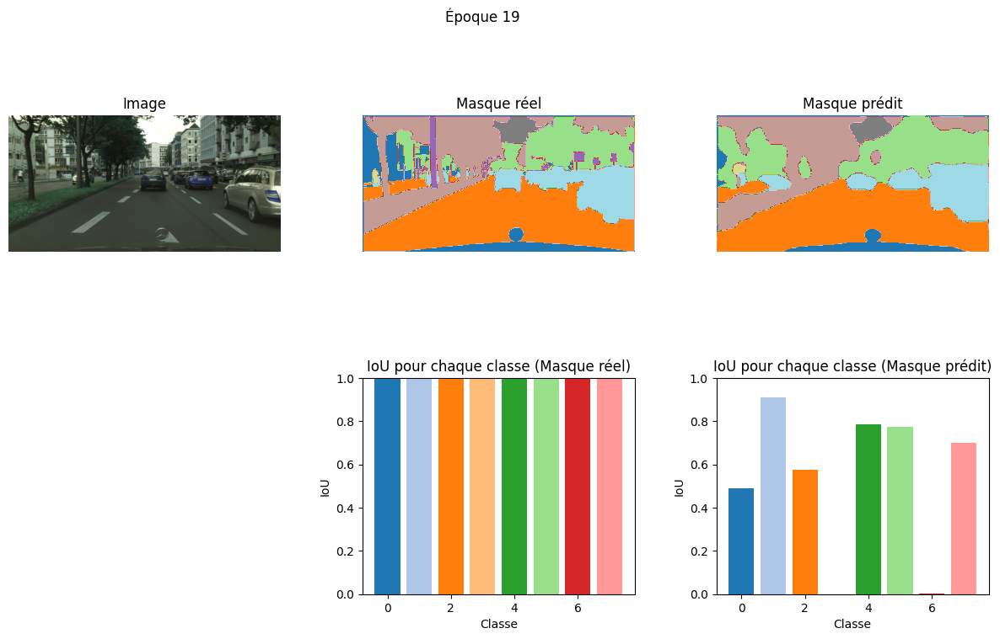

38/38 ━━━━━━━━━━━━━━━━━━━━ 667s 17s/step - accuracy: 0.8807 - dice_coeff: 0.8283 - dice_loss: 0.1717 - jaccard_score: 0.7072 - loss: 0.3511 - total_loss: 1.7834
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8894 - dice_coeff: 0.8392 - dice_loss: 0.1608 - jaccard_score: 0.7232 -


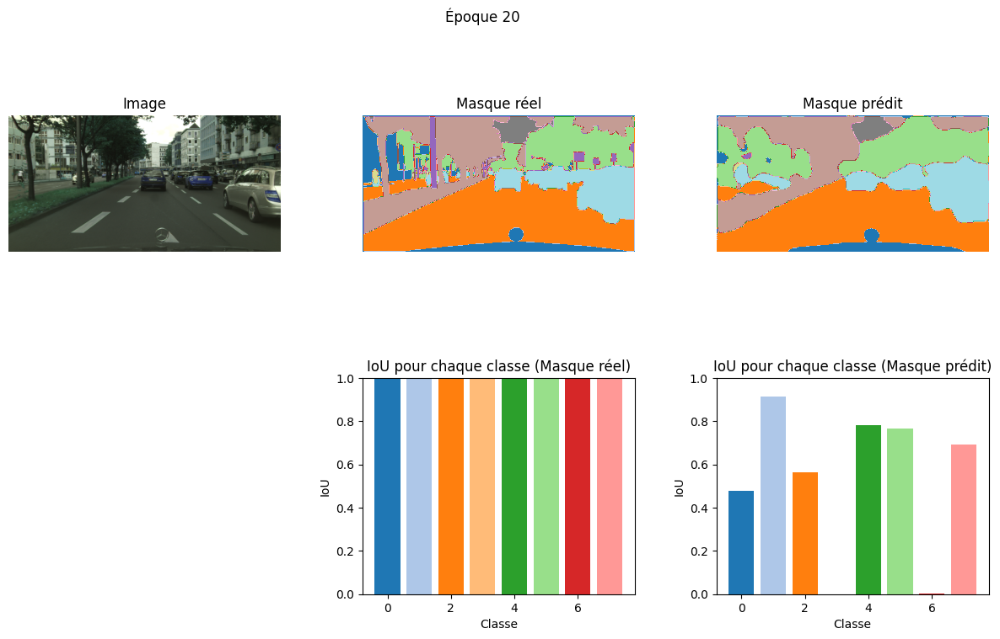

38/38 ━━━━━━━━━━━━━━━━━━━━ 660s 17s/step - accuracy: 0.8894 - dice_coeff: 0.8392 - dice_loss: 0.1608 - jaccard_score: 0.7231 - loss: 0.3246 - total_loss: 1.8621


In [42]:
# Entraînement du modèle avec les données augmentées
history = model.fit(
    images_aug,
    masks_aug,
    batch_size=8,
    epochs=20,
    callbacks=[PredictionCallback()]
)

#### Entraînement 2

In [43]:
# Utilisation de la fonction d'augmentation avec transformations supplémentaires avec albumentations
images_aug, masks_aug = augment_data_albumentations_extended(df_train_sample)

Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7616 - dice_coeff: 0.6722 - dice_loss: 0.3278 - jaccard_score: 0.5090 -


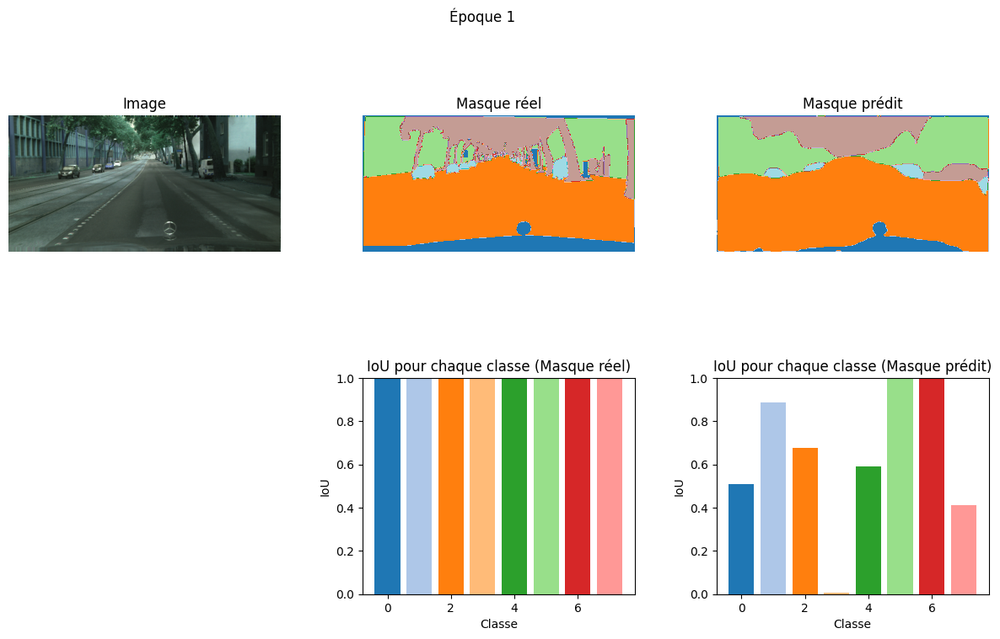

38/38 ━━━━━━━━━━━━━━━━━━━━ 666s 17s/step - accuracy: 0.7614 - dice_coeff: 0.6717 - dice_loss: 0.3283 - jaccard_score: 0.5085 - loss: 0.7501 - total_loss: 2.0646
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.7827 - dice_coeff: 0.6797 - dice_loss: 0.3203 - jaccard_score: 0.5156 -


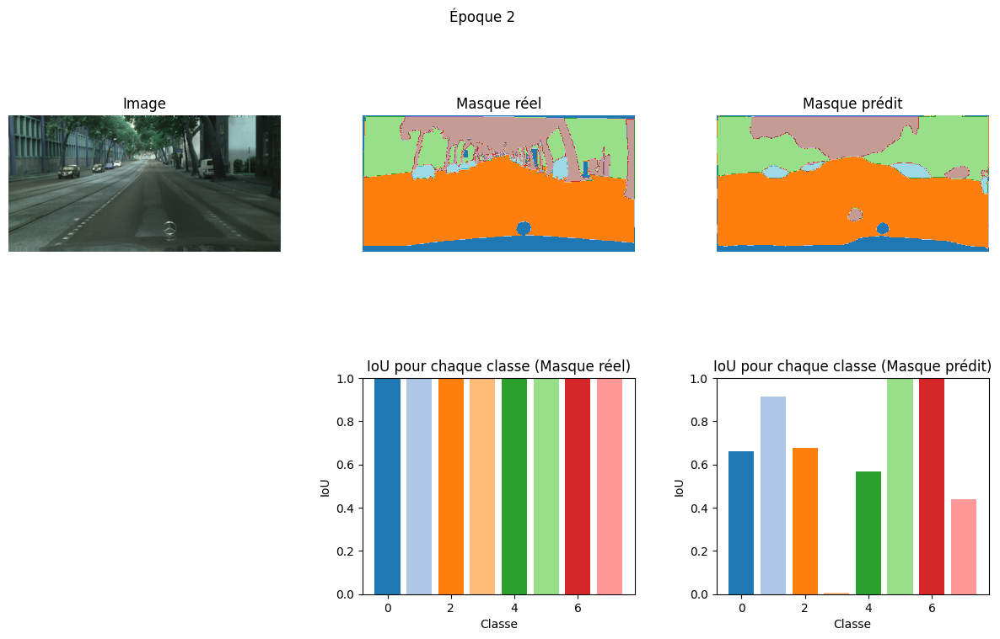

38/38 ━━━━━━━━━━━━━━━━━━━━ 668s 18s/step - accuracy: 0.7827 - dice_coeff: 0.6799 - dice_loss: 0.3201 - jaccard_score: 0.5158 - loss: 0.6779 - total_loss: 1.8115
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.7984 - dice_coeff: 0.7150 - dice_loss: 0.2850 - jaccard_score: 0.5570 -


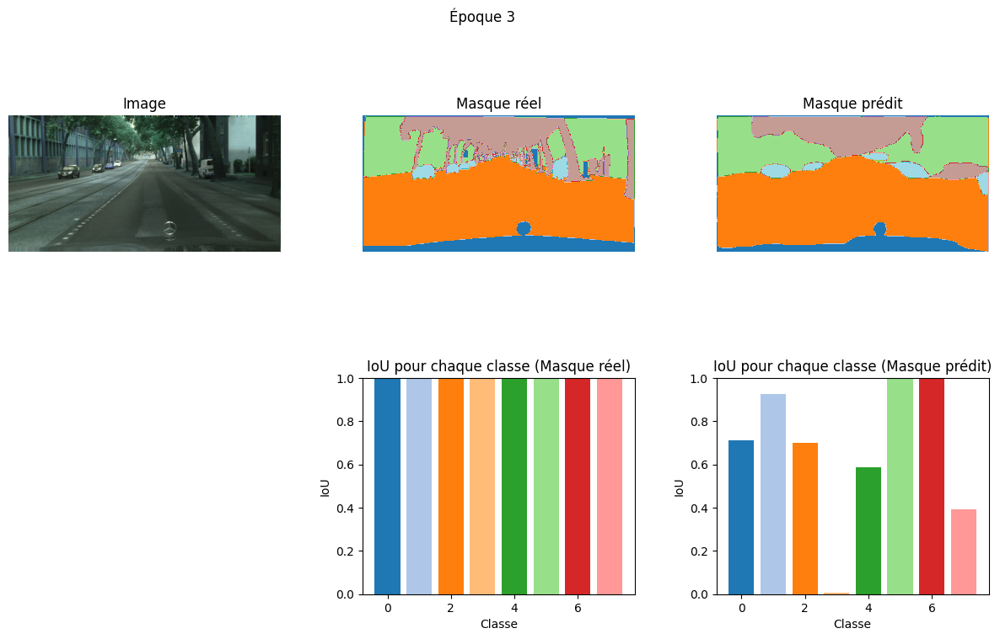

38/38 ━━━━━━━━━━━━━━━━━━━━ 676s 18s/step - accuracy: 0.7984 - dice_coeff: 0.7150 - dice_loss: 0.2850 - jaccard_score: 0.5569 - loss: 0.6075 - total_loss: 1.7427
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.8147 - dice_coeff: 0.7357 - dice_loss: 0.2643 - jaccard_score: 0.5824 -


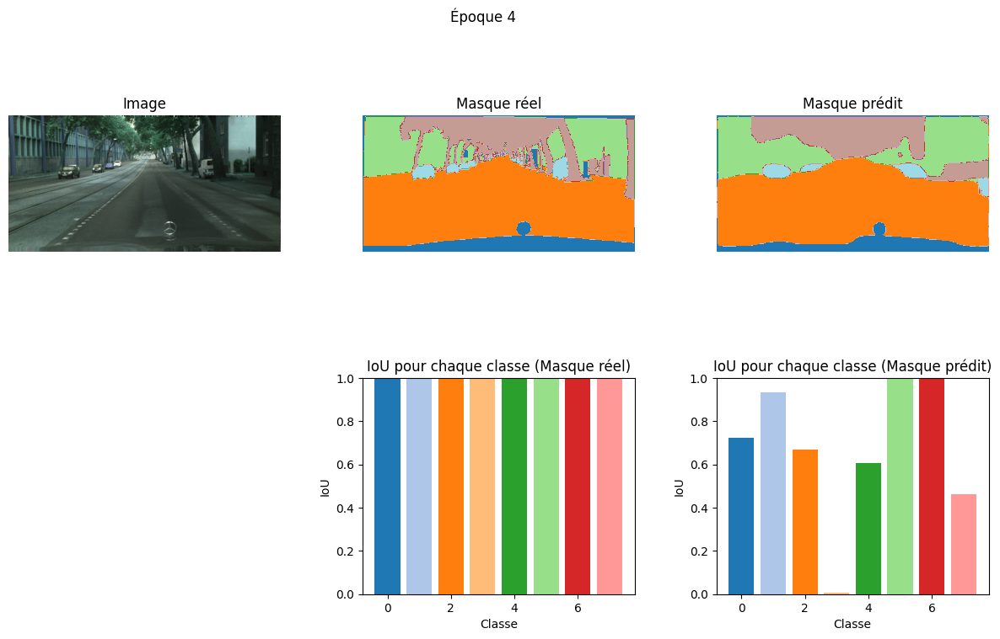

38/38 ━━━━━━━━━━━━━━━━━━━━ 686s 18s/step - accuracy: 0.8148 - dice_coeff: 0.7358 - dice_loss: 0.2642 - jaccard_score: 0.5826 - loss: 0.5530 - total_loss: 1.7335
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8273 - dice_coeff: 0.7502 - dice_loss: 0.2498 - jaccard_score: 0.6008 -


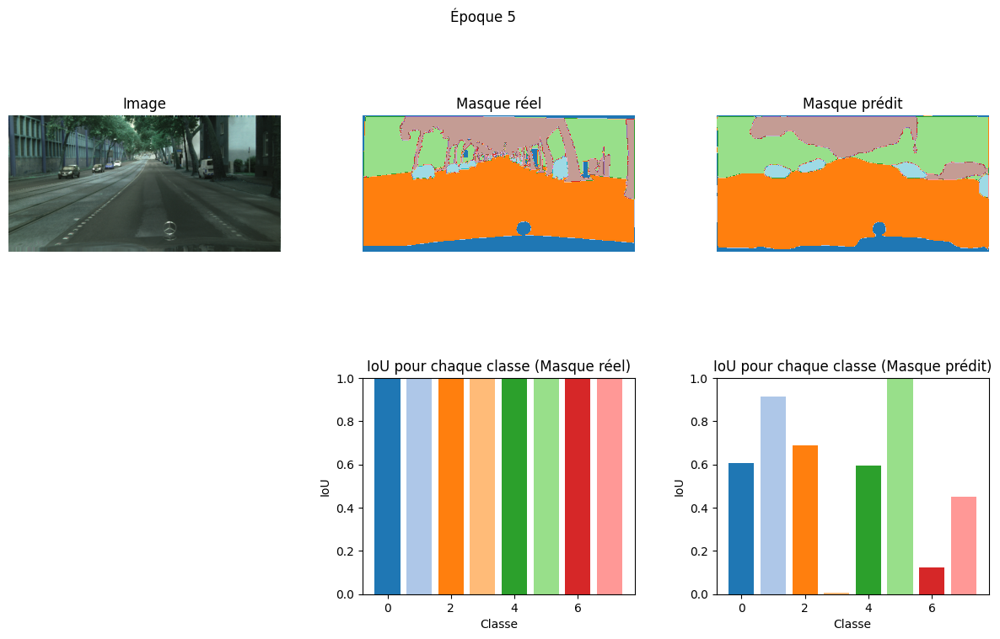

38/38 ━━━━━━━━━━━━━━━━━━━━ 689s 18s/step - accuracy: 0.8273 - dice_coeff: 0.7502 - dice_loss: 0.2498 - jaccard_score: 0.6008 - loss: 0.5203 - total_loss: 1.7041
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8389 - dice_coeff: 0.7644 - dice_loss: 0.2356 - jaccard_score: 0.6192 -


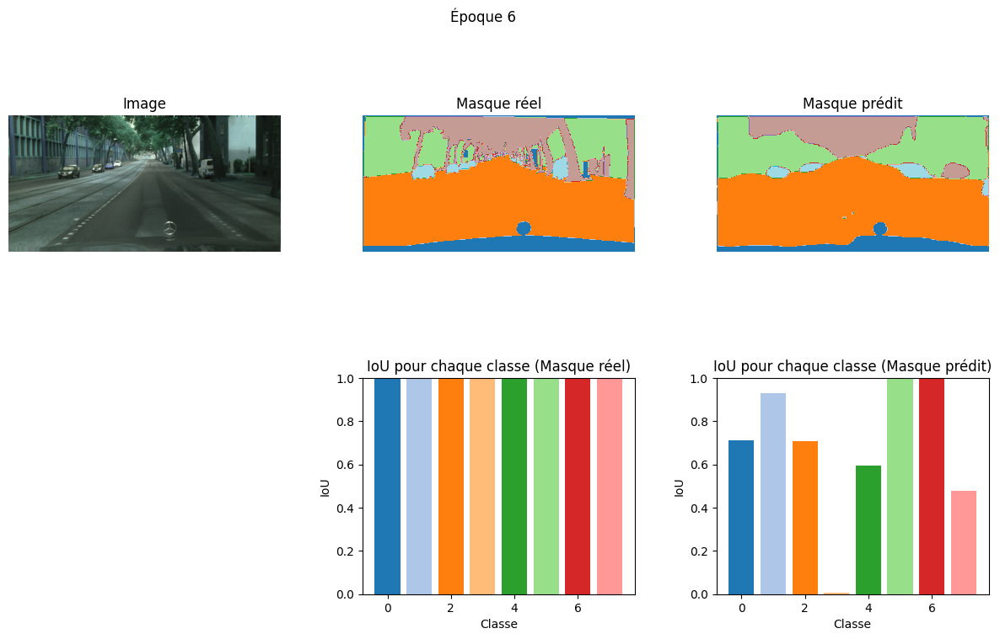

38/38 ━━━━━━━━━━━━━━━━━━━━ 670s 18s/step - accuracy: 0.8389 - dice_coeff: 0.7645 - dice_loss: 0.2355 - jaccard_score: 0.6194 - loss: 0.4817 - total_loss: 1.7291
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8507 - dice_coeff: 0.7836 - dice_loss: 0.2164 - jaccard_score: 0.6447 -


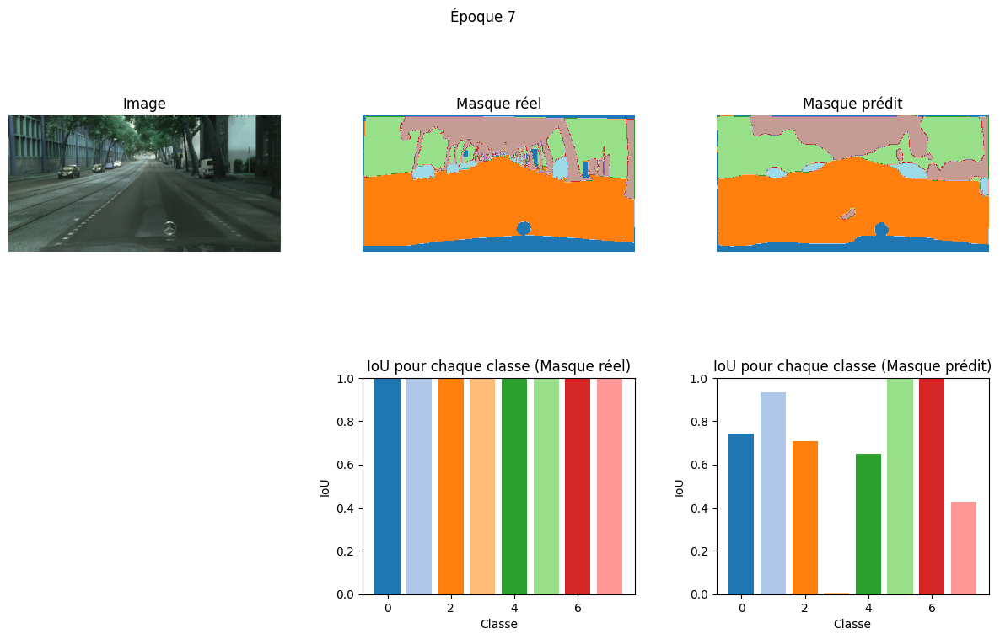

38/38 ━━━━━━━━━━━━━━━━━━━━ 670s 18s/step - accuracy: 0.8506 - dice_coeff: 0.7835 - dice_loss: 0.2165 - jaccard_score: 0.6446 - loss: 0.4486 - total_loss: 1.7360
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8603 - dice_coeff: 0.7975 - dice_loss: 0.2025 - jaccard_score: 0.6635 -


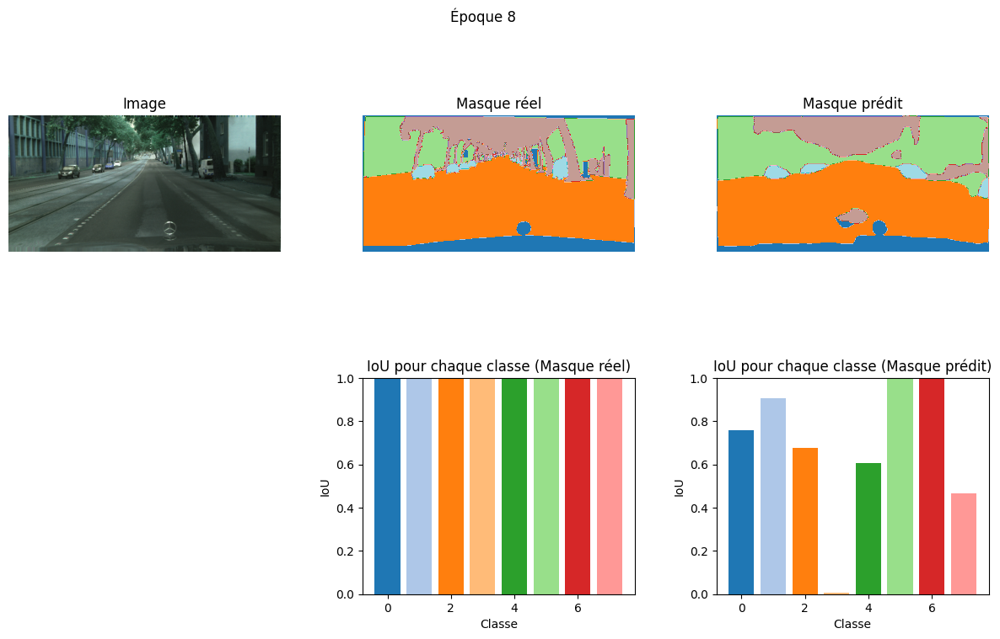

38/38 ━━━━━━━━━━━━━━━━━━━━ 668s 18s/step - accuracy: 0.8602 - dice_coeff: 0.7974 - dice_loss: 0.2026 - jaccard_score: 0.6633 - loss: 0.4161 - total_loss: 1.7990
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8618 - dice_coeff: 0.7988 - dice_loss: 0.2012 - jaccard_score: 0.6655 -


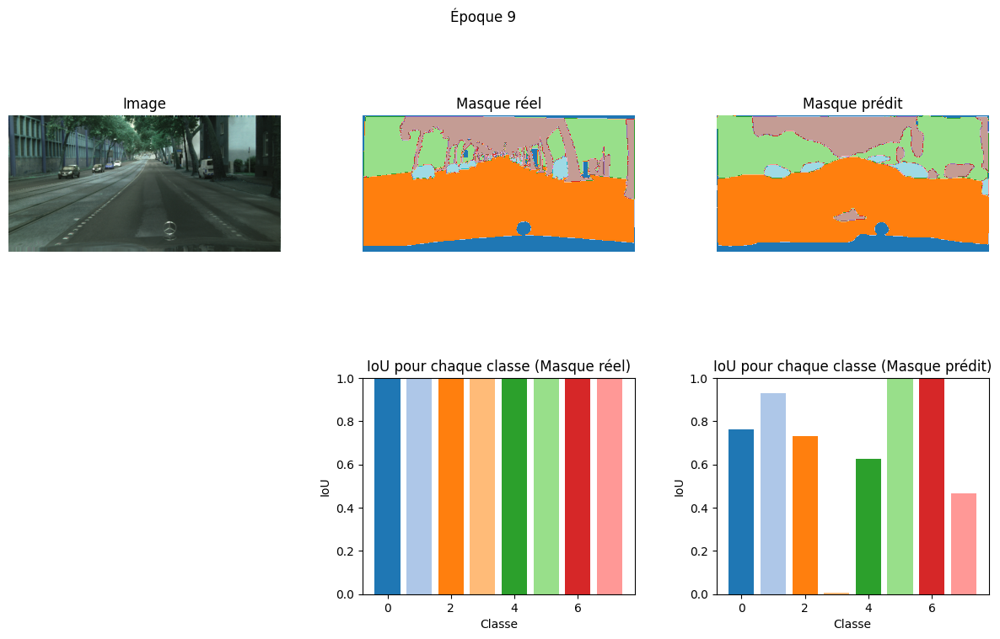

38/38 ━━━━━━━━━━━━━━━━━━━━ 662s 17s/step - accuracy: 0.8619 - dice_coeff: 0.7989 - dice_loss: 0.2011 - jaccard_score: 0.6657 - loss: 0.4097 - total_loss: 1.8182
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8788 - dice_coeff: 0.8261 - dice_loss: 0.1739 - jaccard_score: 0.7042 -


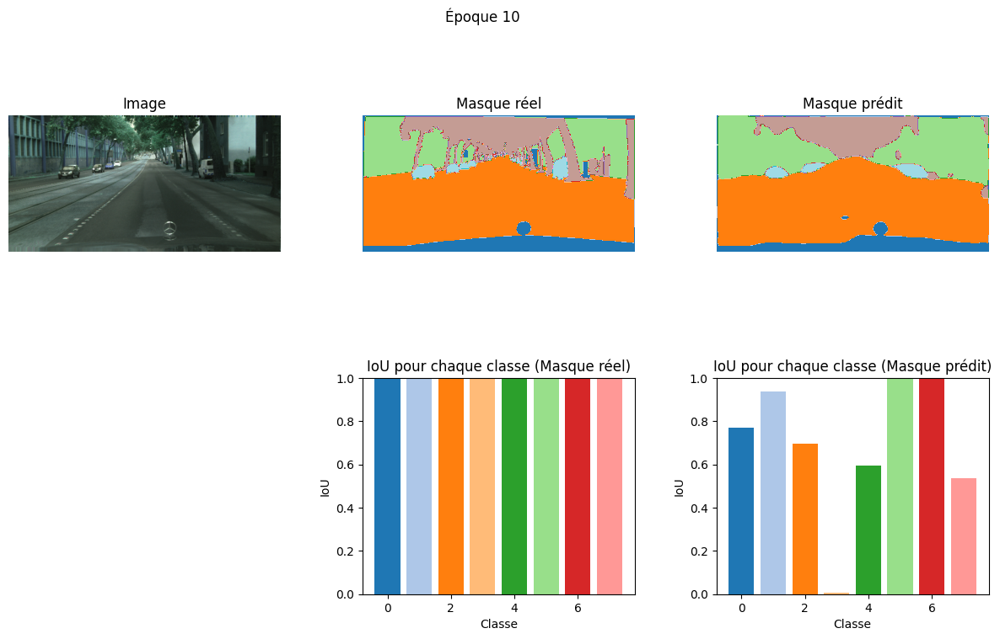

38/38 ━━━━━━━━━━━━━━━━━━━━ 675s 18s/step - accuracy: 0.8787 - dice_coeff: 0.8260 - dice_loss: 0.1740 - jaccard_score: 0.7040 - loss: 0.3581 - total_loss: 1.8395
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8800 - dice_coeff: 0.8262 - dice_loss: 0.1738 - jaccard_score: 0.7041 -


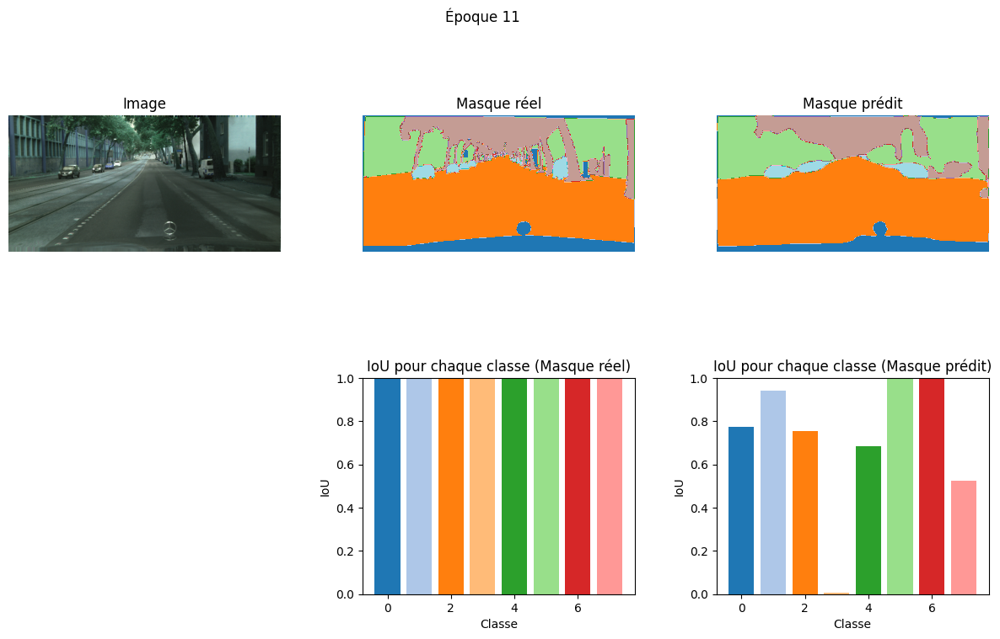

38/38 ━━━━━━━━━━━━━━━━━━━━ 660s 17s/step - accuracy: 0.8801 - dice_coeff: 0.8263 - dice_loss: 0.1737 - jaccard_score: 0.7043 - loss: 0.3505 - total_loss: 1.9433
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8904 - dice_coeff: 0.8406 - dice_loss: 0.1594 - jaccard_score: 0.7253 -


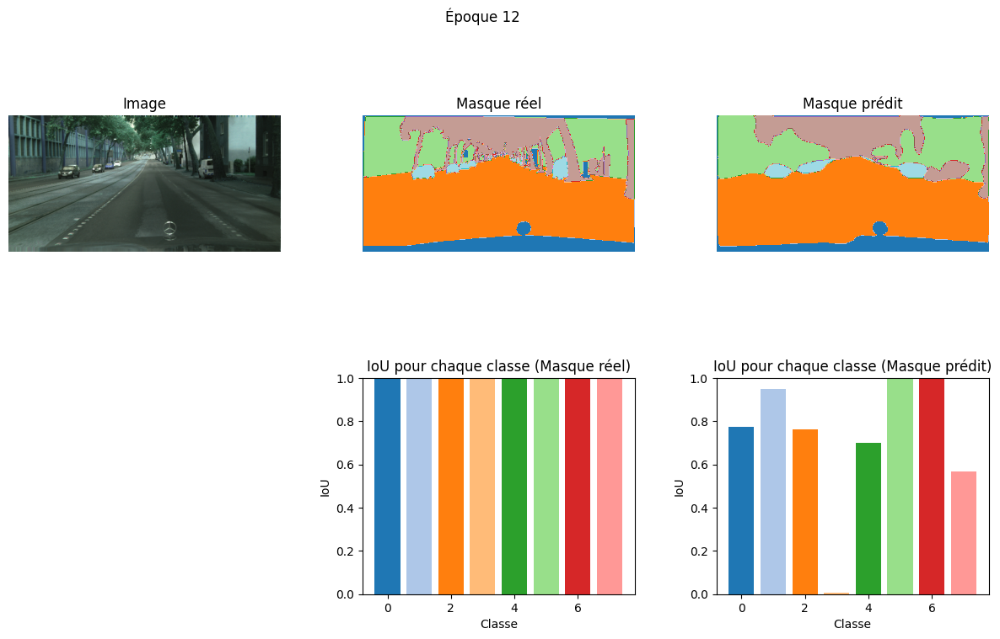

38/38 ━━━━━━━━━━━━━━━━━━━━ 662s 17s/step - accuracy: 0.8904 - dice_coeff: 0.8406 - dice_loss: 0.1594 - jaccard_score: 0.7253 - loss: 0.3210 - total_loss: 1.9615
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8974 - dice_coeff: 0.8510 - dice_loss: 0.1490 - jaccard_score: 0.7408 -


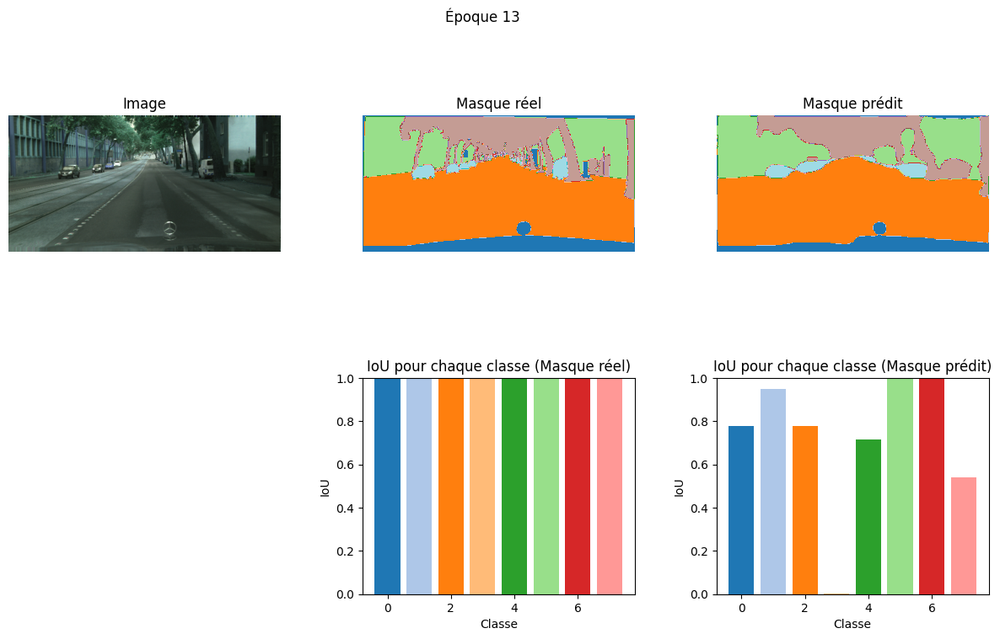

38/38 ━━━━━━━━━━━━━━━━━━━━ 669s 18s/step - accuracy: 0.8974 - dice_coeff: 0.8510 - dice_loss: 0.1490 - jaccard_score: 0.7408 - loss: 0.2973 - total_loss: 2.0183
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.9001 - dice_coeff: 0.8552 - dice_loss: 0.1448 - jaccard_score: 0.7473 -


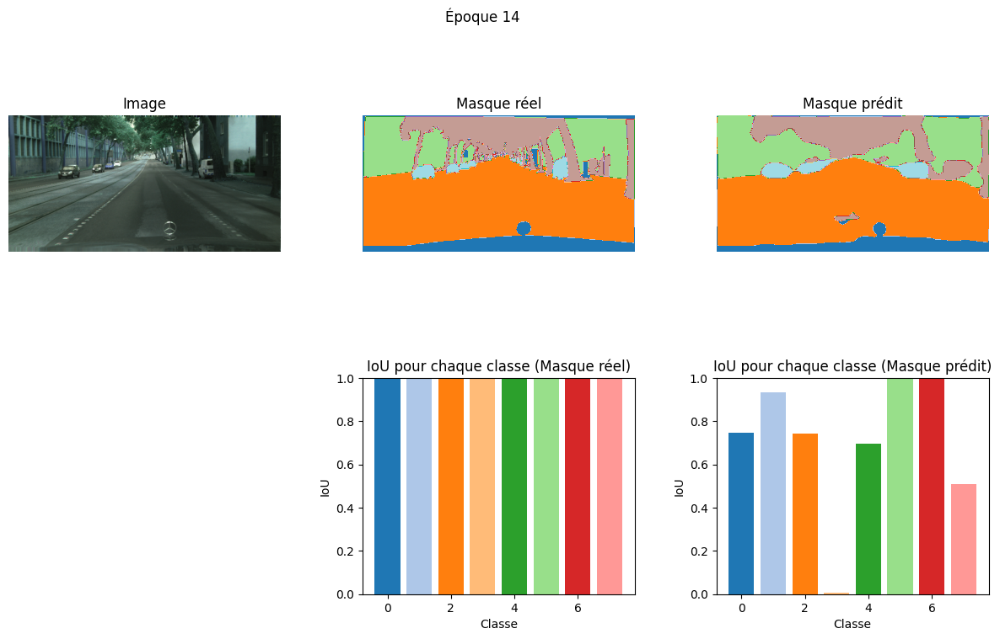

38/38 ━━━━━━━━━━━━━━━━━━━━ 676s 18s/step - accuracy: 0.8999 - dice_coeff: 0.8550 - dice_loss: 0.1450 - jaccard_score: 0.7470 - loss: 0.2913 - total_loss: 2.0529
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.8943 - dice_coeff: 0.8473 - dice_loss: 0.1527 - jaccard_score: 0.7352 -


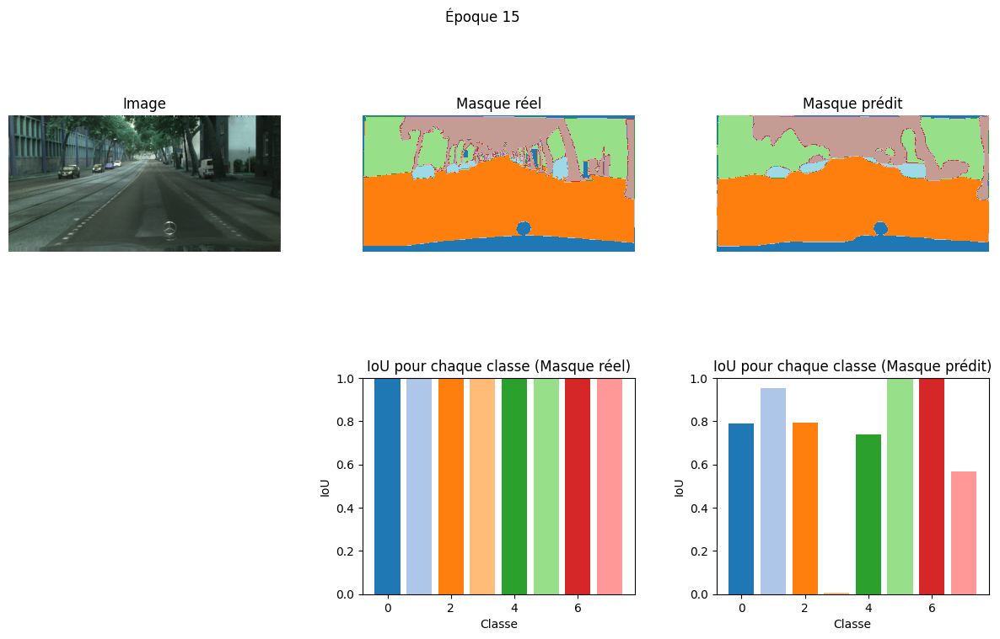

38/38 ━━━━━━━━━━━━━━━━━━━━ 664s 18s/step - accuracy: 0.8943 - dice_coeff: 0.8473 - dice_loss: 0.1527 - jaccard_score: 0.7352 - loss: 0.3067 - total_loss: 1.9383
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.9077 - dice_coeff: 0.8672 - dice_loss: 0.1328 - jaccard_score: 0.7657 -


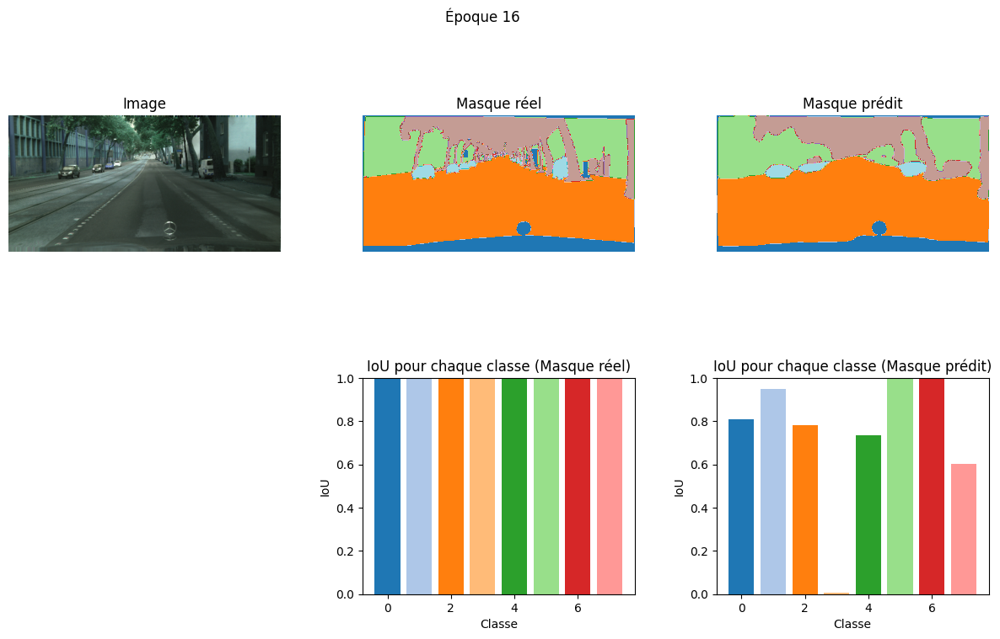

38/38 ━━━━━━━━━━━━━━━━━━━━ 676s 18s/step - accuracy: 0.9077 - dice_coeff: 0.8672 - dice_loss: 0.1328 - jaccard_score: 0.7656 - loss: 0.2664 - total_loss: 2.0629
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.9142 - dice_coeff: 0.8753 - dice_loss: 0.1247 - jaccard_score: 0.7783 -


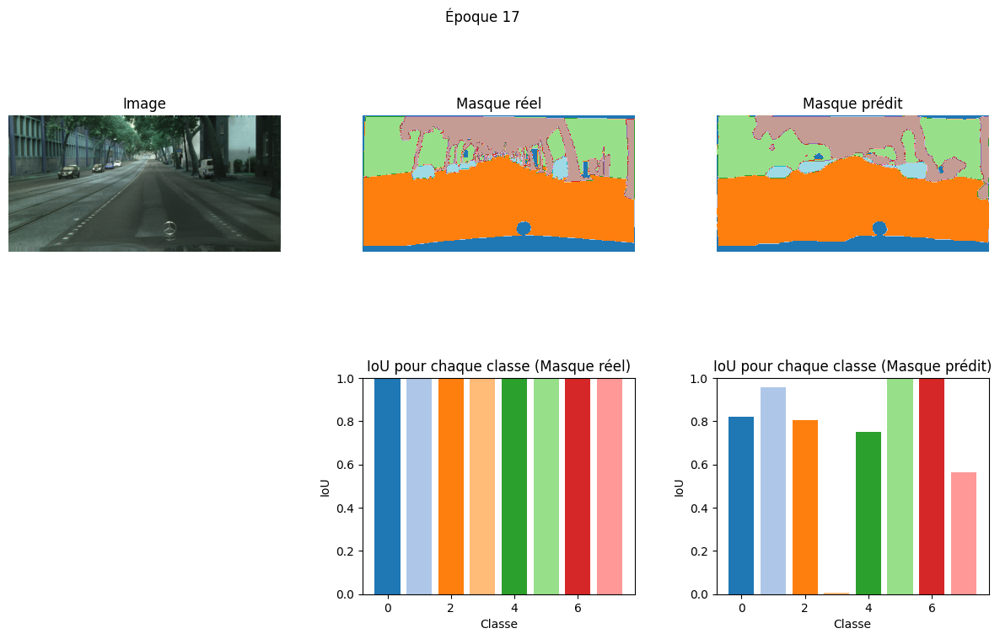

38/38 ━━━━━━━━━━━━━━━━━━━━ 682s 18s/step - accuracy: 0.9142 - dice_coeff: 0.8752 - dice_loss: 0.1248 - jaccard_score: 0.7783 - loss: 0.2446 - total_loss: 2.1504
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.9155 - dice_coeff: 0.8775 - dice_loss: 0.1225 - jaccard_score: 0.7819 -


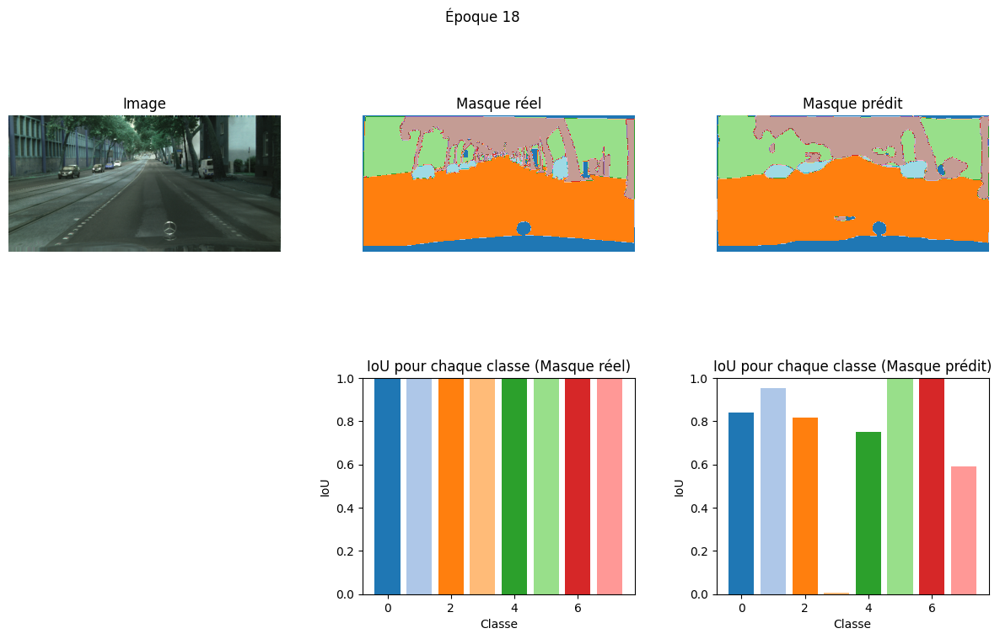

38/38 ━━━━━━━━━━━━━━━━━━━━ 678s 18s/step - accuracy: 0.9155 - dice_coeff: 0.8776 - dice_loss: 0.1224 - jaccard_score: 0.7821 - loss: 0.2402 - total_loss: 2.1866
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.9225 - dice_coeff: 0.8871 - dice_loss: 0.1129 - jaccard_score: 0.7972 -


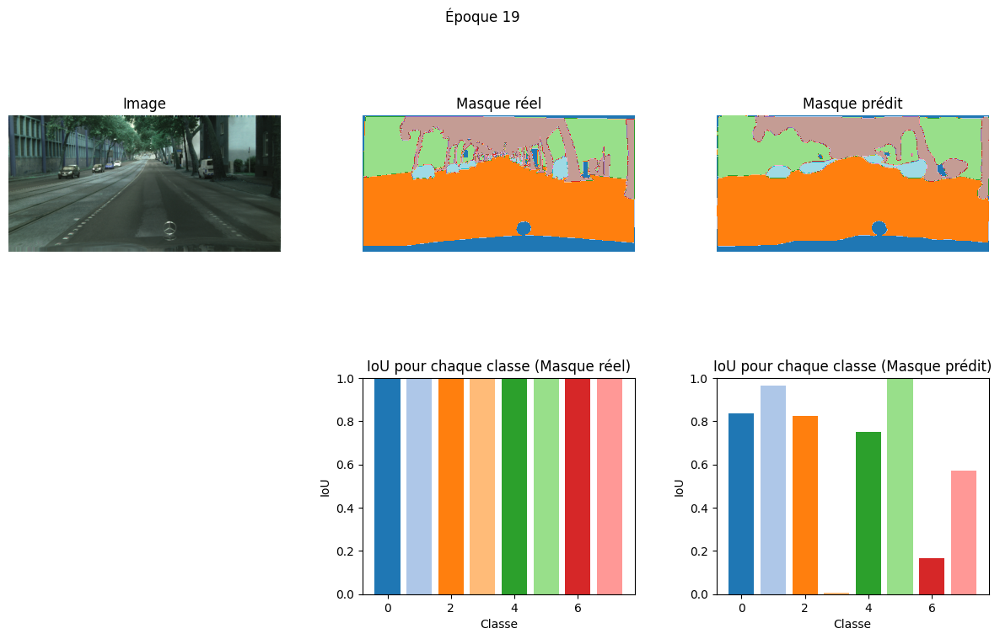

38/38 ━━━━━━━━━━━━━━━━━━━━ 679s 18s/step - accuracy: 0.9224 - dice_coeff: 0.8870 - dice_loss: 0.1130 - jaccard_score: 0.7971 - loss: 0.2201 - total_loss: 2.2428
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.9224 - dice_coeff: 0.8877 - dice_loss: 0.1123 - jaccard_score: 0.7981 -


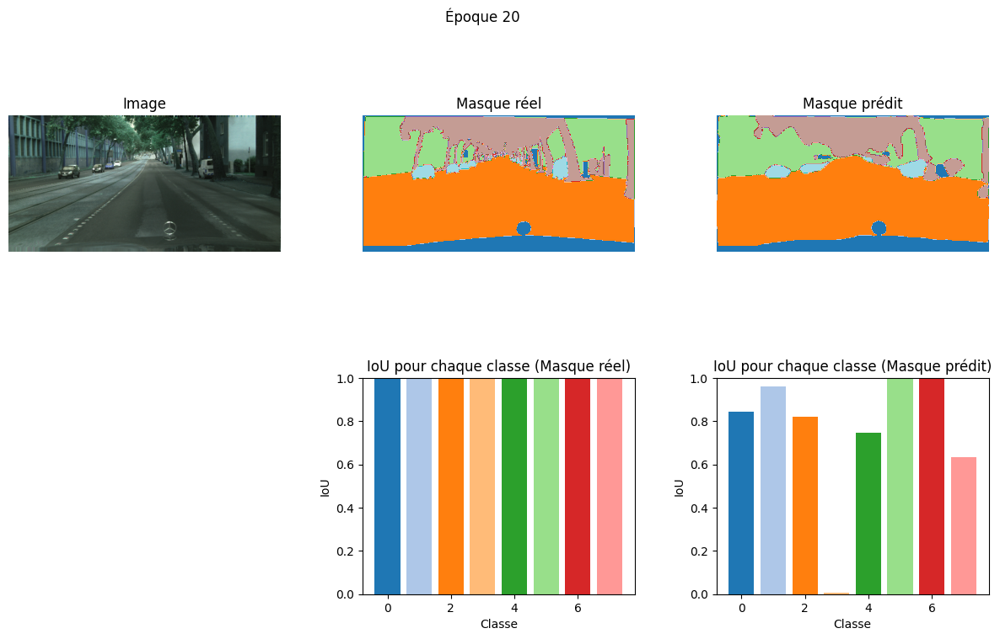

38/38 ━━━━━━━━━━━━━━━━━━━━ 671s 18s/step - accuracy: 0.9224 - dice_coeff: 0.8877 - dice_loss: 0.1123 - jaccard_score: 0.7982 - loss: 0.2177 - total_loss: 2.2766


In [44]:
# Entraînement du modèle avec les données augmentées
history = model.fit(
    images_aug,
    masks_aug,
    batch_size=8,
    epochs=20,
    callbacks=[PredictionCallback()]
)

## Avec TensorFlow

### Fonctions

In [45]:
# Fonction pour effectuer une rotation sans tensorflow-addons
def rotate_image_and_mask(image, mask, angle):
    # Calculer k, le nombre de rotations de 90 degrés à effectuer
    k = angle // 90
    image = tf.image.rot90(image, k=k)
    mask = tf.image.rot90(mask, k=k)
    return image, mask

In [46]:
# Fonction de data augmentation avec TensorFlow (sans tensorflow-addons)
def augment_data_tf(images, masks):
    def augment_image_and_mask(image, mask):
        # Flip horizontal avec probabilité de 50%
        image = tf.image.random_flip_left_right(image)
        mask = tf.image.random_flip_left_right(mask)

        # Flip vertical avec probabilité de 20%
        image = tf.image.random_flip_up_down(image)
        mask = tf.image.random_flip_up_down(mask)

        # Rotation aléatoire par multiples de 90 degrés
        angle = tf.random.uniform([], -90, 90, dtype=tf.int32)
        image, mask = rotate_image_and_mask(image, mask, angle)

        # Zoom de 80% à 120%
        scale = tf.random.uniform([], 0.8, 1.2)
        image = tf.image.resize(image, (int(256 * scale), int(512 * scale)))
        mask = tf.image.resize(mask, (int(256 * scale), int(512 * scale)))

        # Redimensionner pour la taille d'origine
        image = tf.image.resize(image, (256, 512))
        mask = tf.image.resize(mask, (256, 512))
        
        return image, mask

    # Appliquer la data augmentation
    images_aug = []
    masks_aug = []
    for img, msk in zip(images, masks):
        img_aug, msk_aug = augment_image_and_mask(img, msk)
        images_aug.append(img_aug)
        masks_aug.append(msk_aug)

    # Convertir en tensors de type tf.Tensor
    images_aug = tf.convert_to_tensor(images_aug)
    masks_aug = tf.convert_to_tensor(masks_aug)
    
    return images_aug, masks_aug

In [47]:
# Fonction avancée de data augmentation avec TensorFlow (sans tensorflow-addons)
def augment_data_tf_extended(images, masks):
    def augment_image_and_mask(image, mask):
        # Flip horizontal avec probabilité de 50%
        image = tf.image.random_flip_left_right(image)
        mask = tf.image.random_flip_left_right(mask)

        # Flip vertical avec probabilité de 20%
        image = tf.image.random_flip_up_down(image)
        mask = tf.image.random_flip_up_down(mask)

        # Rotation aléatoire par multiples de 90 degrés
        angle = tf.random.uniform([], -90, 90, dtype=tf.int32)
        image, mask = rotate_image_and_mask(image, mask, angle)

        # Zoom de 80% à 120%
        scale = tf.random.uniform([], 0.8, 1.2)
        image = tf.image.resize(image, (int(256 * scale), int(512 * scale)))
        mask = tf.image.resize(mask, (int(256 * scale), int(512 * scale)))

        # Redimensionner pour la taille d'origine
        image = tf.image.resize(image, (256, 512))
        mask = tf.image.resize(mask, (256, 512))

        # Ajout de transformations supplémentaires

        # Ajuste la luminosité
        image = tf.image.random_brightness(image, max_delta=0.2)  # delta de luminosité max de 20%

        # Ajuste le contraste
        image = tf.image.random_contrast(image, lower=0.8, upper=1.2)  # Contraste entre 80% et 120%

        # Ajuste la saturation (pour les images en couleur)
        image = tf.image.random_saturation(image, lower=0.8, upper=1.2)  # Saturation entre 80% et 120%

        # Ajuste la teinte
        image = tf.image.random_hue(image, max_delta=0.1)  # Variation de teinte max de 10%

        return image, mask

    # Appliquer la data augmentation
    images_aug = []
    masks_aug = []
    for img, msk in zip(images, masks):
        img_aug, msk_aug = augment_image_and_mask(img, msk)
        images_aug.append(img_aug)
        masks_aug.append(msk_aug)

    # Convertir en tensors de type tf.Tensor
    images_aug = tf.convert_to_tensor(images_aug)
    masks_aug = tf.convert_to_tensor(masks_aug)
    
    return images_aug, masks_aug

### Entraînement du modèle

In [48]:
# Chargement des images et masques
images = load_images(df_train_sample)
masks = load_masks(df_train_sample)

#### Entraînement 1

In [49]:
# Appliquer la data augmentation
images_aug, masks_aug = augment_data_tf(images, masks)

Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4045 - dice_coeff: 0.2836 - dice_loss: 0.7164 - jaccard_score: 0.1697 -


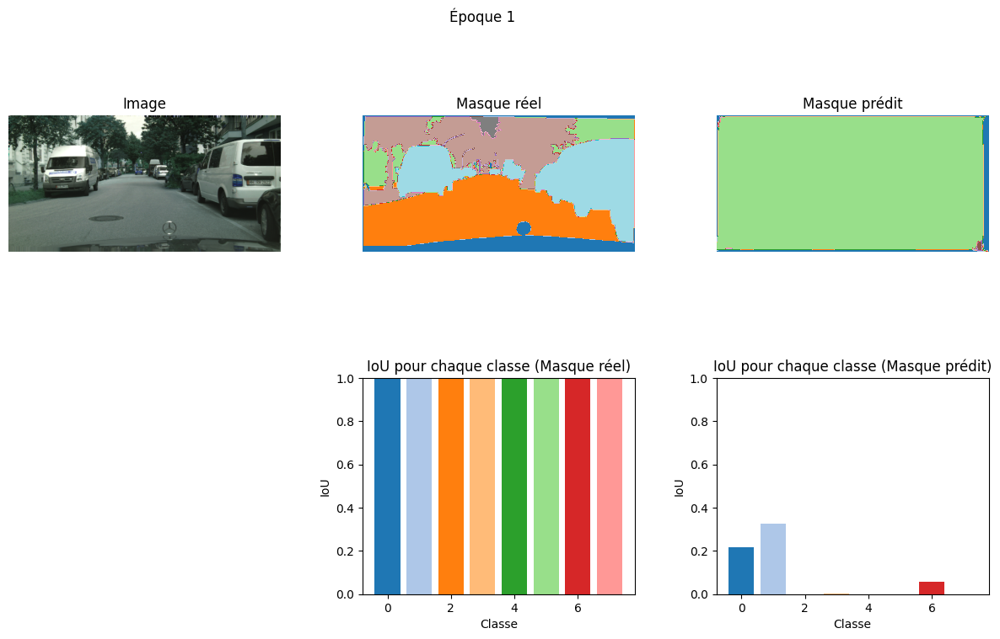

38/38 ━━━━━━━━━━━━━━━━━━━━ 674s 18s/step - accuracy: 0.4043 - dice_coeff: 0.2830 - dice_loss: 0.7170 - jaccard_score: 0.1691 - loss: 2.1197 - total_loss: 3.0385
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4146 - dice_coeff: 0.2659 - dice_loss: 0.7341 - jaccard_score: 0.1535 -


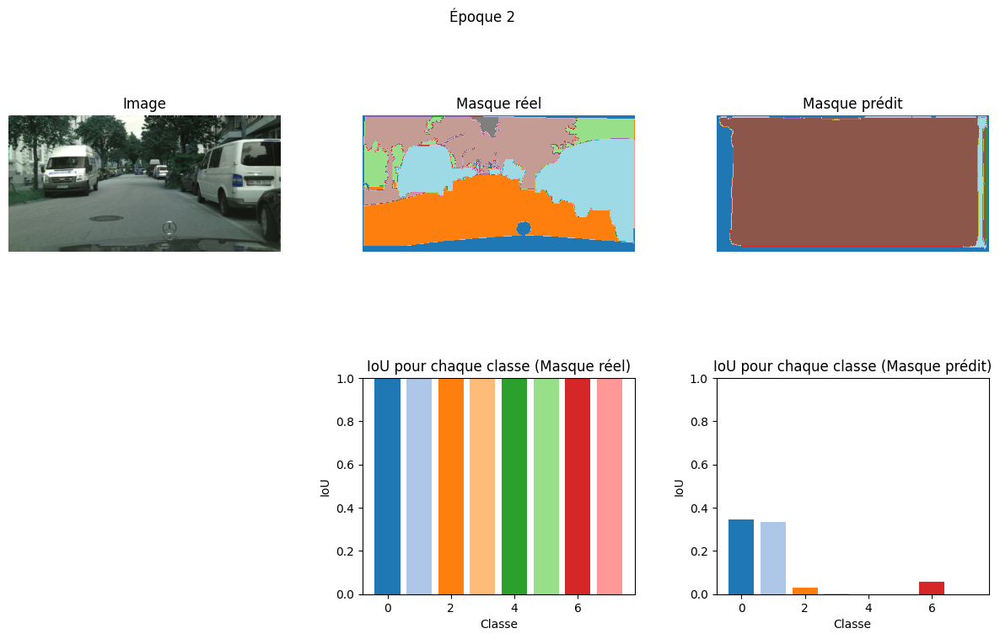

38/38 ━━━━━━━━━━━━━━━━━━━━ 666s 17s/step - accuracy: 0.4145 - dice_coeff: 0.2658 - dice_loss: 0.7342 - jaccard_score: 0.1534 - loss: 1.6060 - total_loss: 2.8351
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4102 - dice_coeff: 0.2649 - dice_loss: 0.7351 - jaccard_score: 0.1529 -


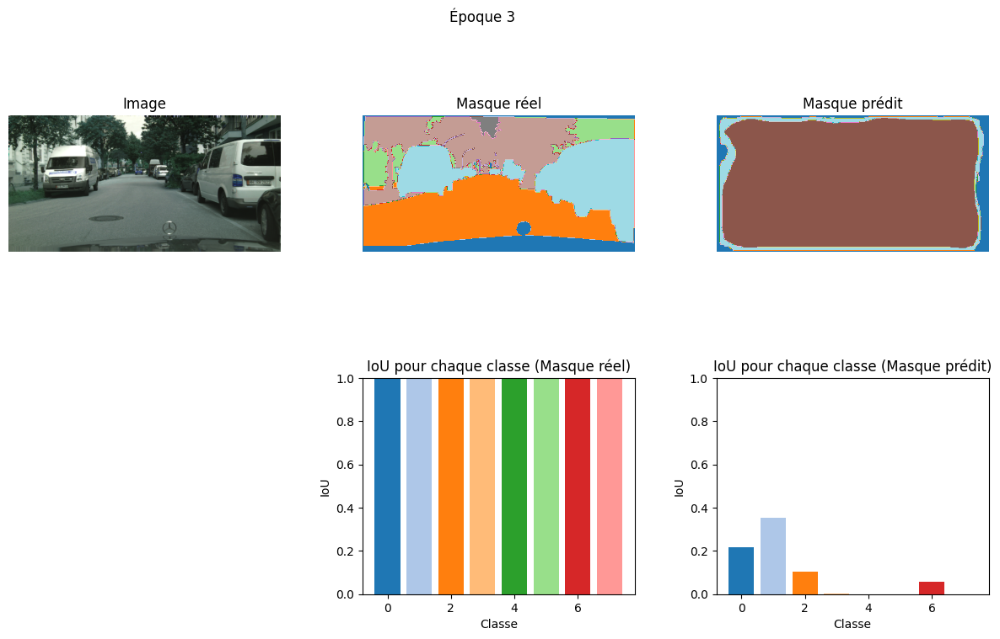

38/38 ━━━━━━━━━━━━━━━━━━━━ 661s 17s/step - accuracy: 0.4102 - dice_coeff: 0.2649 - dice_loss: 0.7351 - jaccard_score: 0.1529 - loss: 1.6239 - total_loss: 2.8500
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4116 - dice_coeff: 0.2658 - dice_loss: 0.7342 - jaccard_score: 0.1534 -


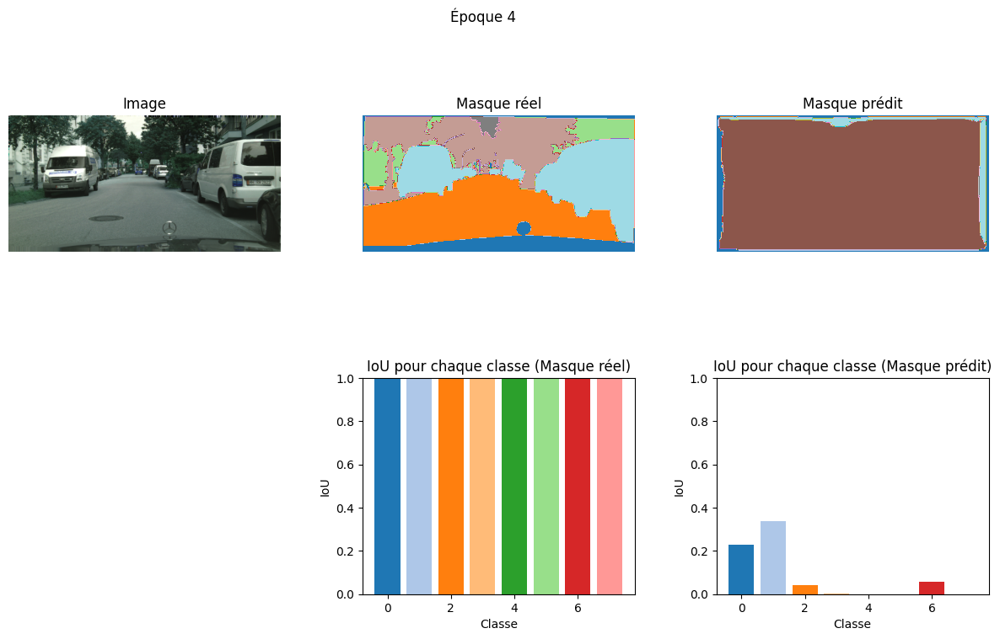

38/38 ━━━━━━━━━━━━━━━━━━━━ 666s 17s/step - accuracy: 0.4117 - dice_coeff: 0.2659 - dice_loss: 0.7341 - jaccard_score: 0.1534 - loss: 1.5910 - total_loss: 2.8461
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4089 - dice_coeff: 0.2624 - dice_loss: 0.7376 - jaccard_score: 0.1511 -


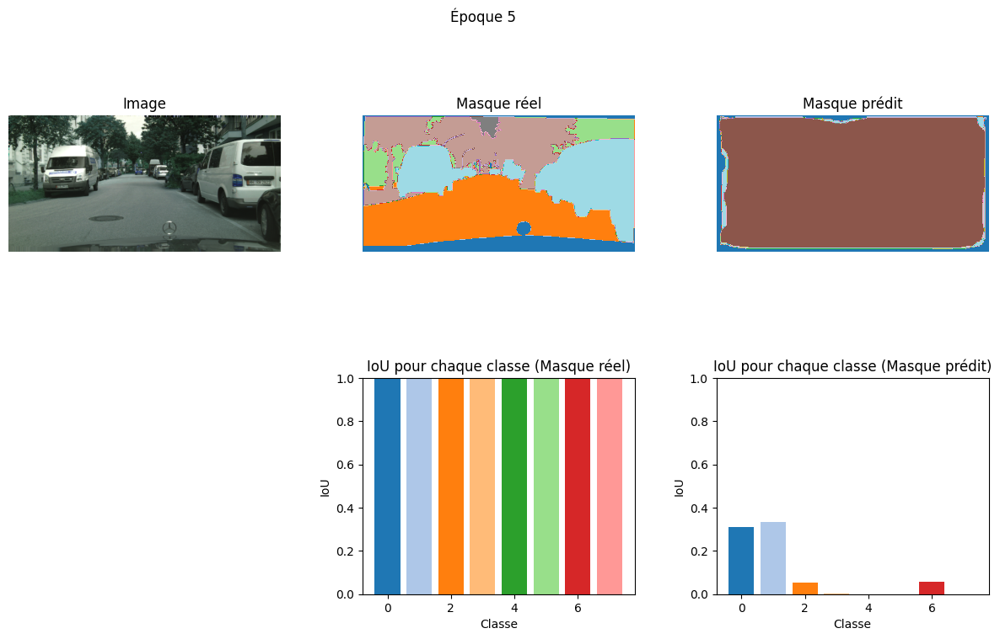

38/38 ━━━━━━━━━━━━━━━━━━━━ 664s 17s/step - accuracy: 0.4091 - dice_coeff: 0.2626 - dice_loss: 0.7374 - jaccard_score: 0.1512 - loss: 1.5782 - total_loss: 2.8480
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4167 - dice_coeff: 0.2780 - dice_loss: 0.7220 - jaccard_score: 0.1615 -


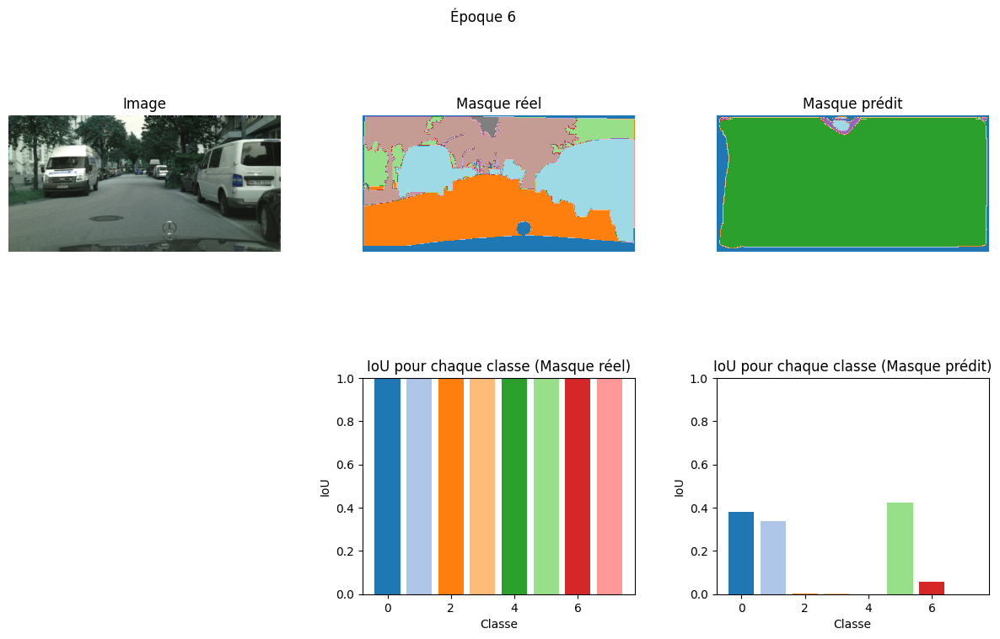

38/38 ━━━━━━━━━━━━━━━━━━━━ 663s 17s/step - accuracy: 0.4167 - dice_coeff: 0.2779 - dice_loss: 0.7221 - jaccard_score: 0.1614 - loss: 1.5495 - total_loss: 2.8261
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4158 - dice_coeff: 0.2718 - dice_loss: 0.7282 - jaccard_score: 0.1573 -


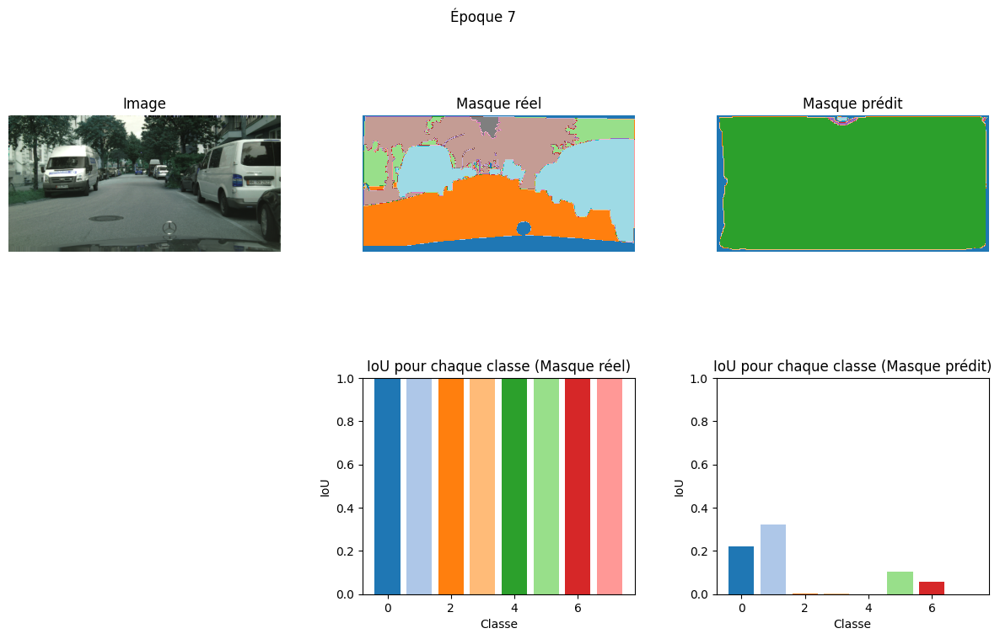

38/38 ━━━━━━━━━━━━━━━━━━━━ 666s 17s/step - accuracy: 0.4158 - dice_coeff: 0.2719 - dice_loss: 0.7281 - jaccard_score: 0.1574 - loss: 1.5527 - total_loss: 2.8386
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4169 - dice_coeff: 0.2764 - dice_loss: 0.7236 - jaccard_score: 0.1604 -


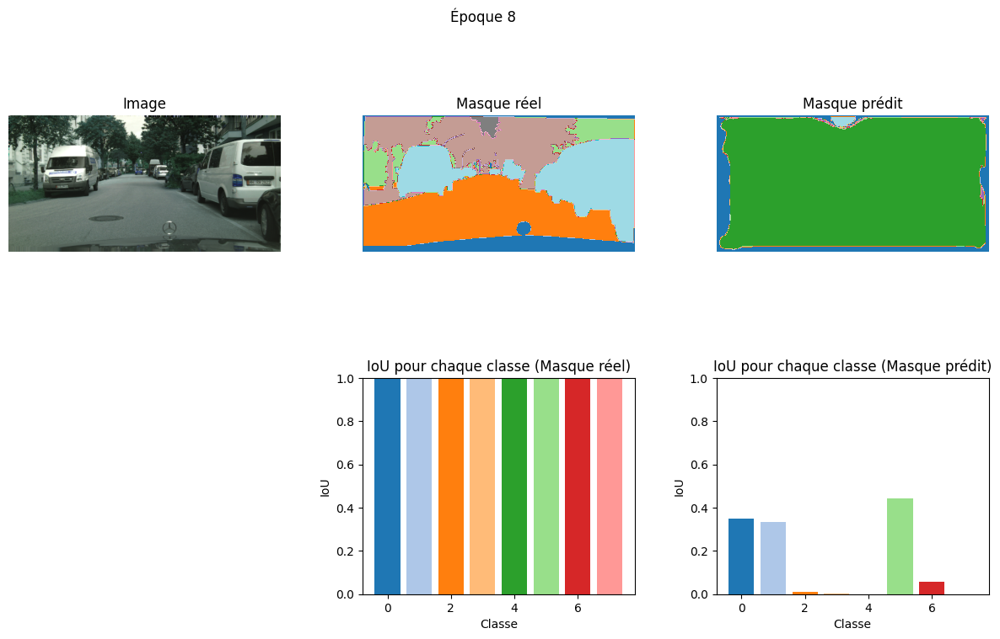

38/38 ━━━━━━━━━━━━━━━━━━━━ 662s 17s/step - accuracy: 0.4169 - dice_coeff: 0.2763 - dice_loss: 0.7237 - jaccard_score: 0.1604 - loss: 1.5436 - total_loss: 2.8406
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.4182 - dice_coeff: 0.2767 - dice_loss: 0.7233 - jaccard_score: 0.1606 -


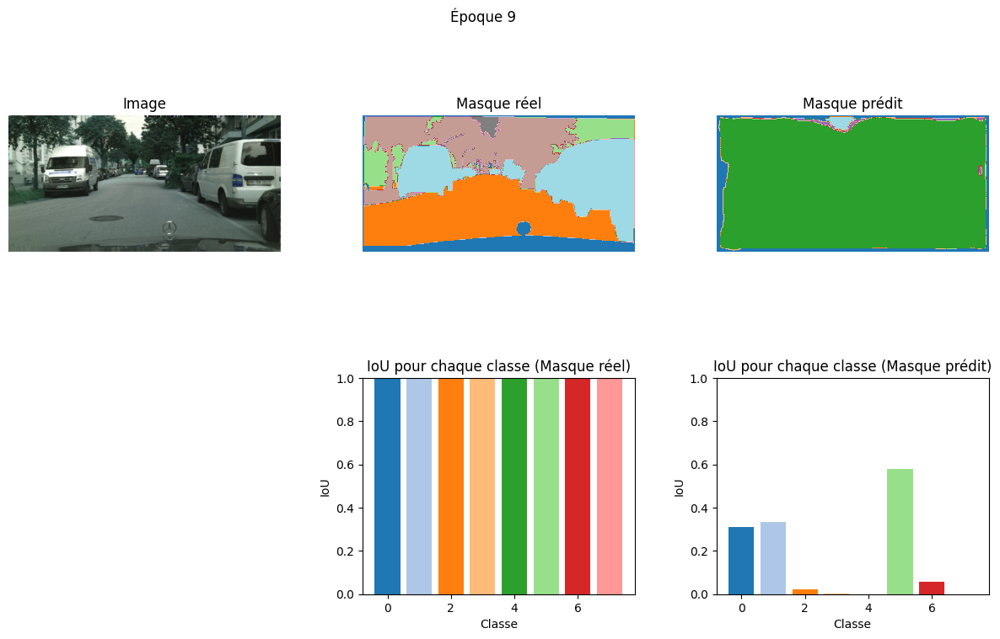

38/38 ━━━━━━━━━━━━━━━━━━━━ 669s 18s/step - accuracy: 0.4182 - dice_coeff: 0.2767 - dice_loss: 0.7233 - jaccard_score: 0.1606 - loss: 1.5473 - total_loss: 2.8516
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.4158 - dice_coeff: 0.2776 - dice_loss: 0.7224 - jaccard_score: 0.1612 -


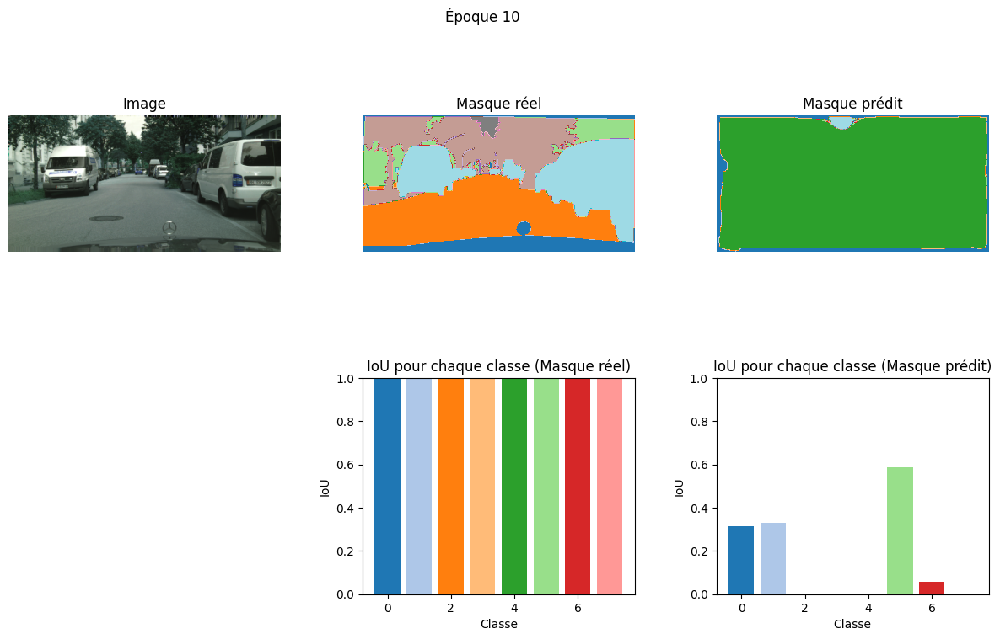

38/38 ━━━━━━━━━━━━━━━━━━━━ 678s 18s/step - accuracy: 0.4159 - dice_coeff: 0.2776 - dice_loss: 0.7224 - jaccard_score: 0.1612 - loss: 1.5395 - total_loss: 2.8483
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.4232 - dice_coeff: 0.2820 - dice_loss: 0.7180 - jaccard_score: 0.1643 -


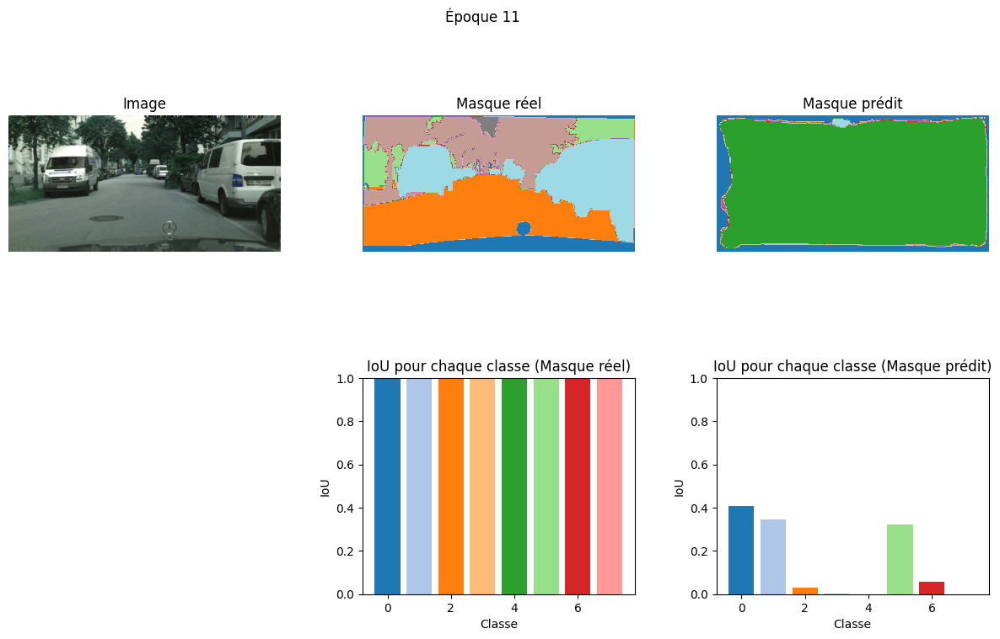

38/38 ━━━━━━━━━━━━━━━━━━━━ 678s 18s/step - accuracy: 0.4231 - dice_coeff: 0.2820 - dice_loss: 0.7180 - jaccard_score: 0.1642 - loss: 1.5293 - total_loss: 2.8684
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.4238 - dice_coeff: 0.2848 - dice_loss: 0.7152 - jaccard_score: 0.1661 -


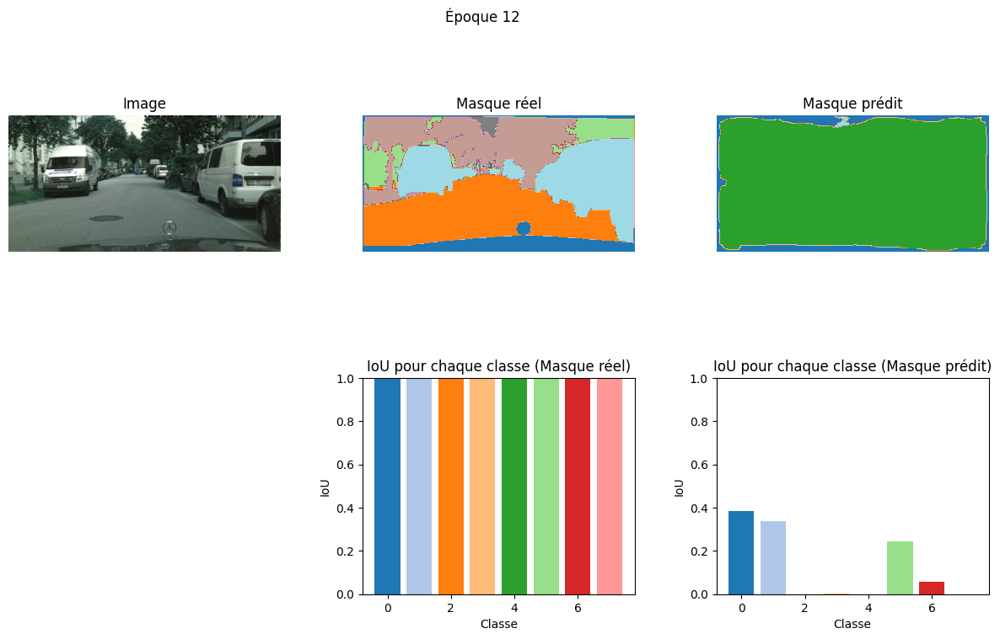

38/38 ━━━━━━━━━━━━━━━━━━━━ 673s 18s/step - accuracy: 0.4237 - dice_coeff: 0.2847 - dice_loss: 0.7153 - jaccard_score: 0.1661 - loss: 1.5076 - total_loss: 2.8535
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.4179 - dice_coeff: 0.2819 - dice_loss: 0.7181 - jaccard_score: 0.1641 -


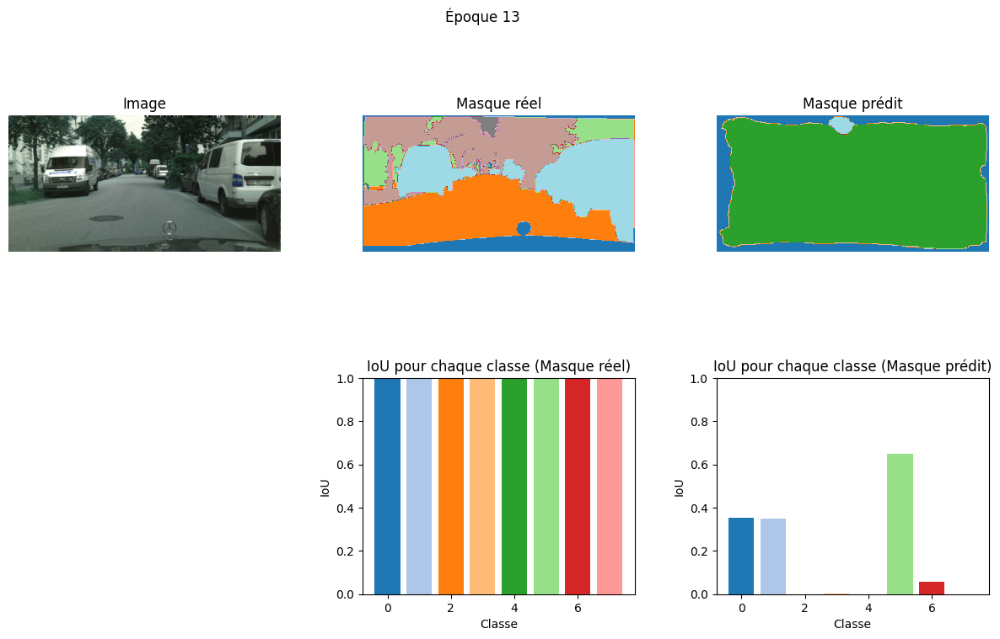

38/38 ━━━━━━━━━━━━━━━━━━━━ 669s 18s/step - accuracy: 0.4181 - dice_coeff: 0.2819 - dice_loss: 0.7181 - jaccard_score: 0.1641 - loss: 1.5063 - total_loss: 2.8750
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4269 - dice_coeff: 0.2902 - dice_loss: 0.7098 - jaccard_score: 0.1698 -


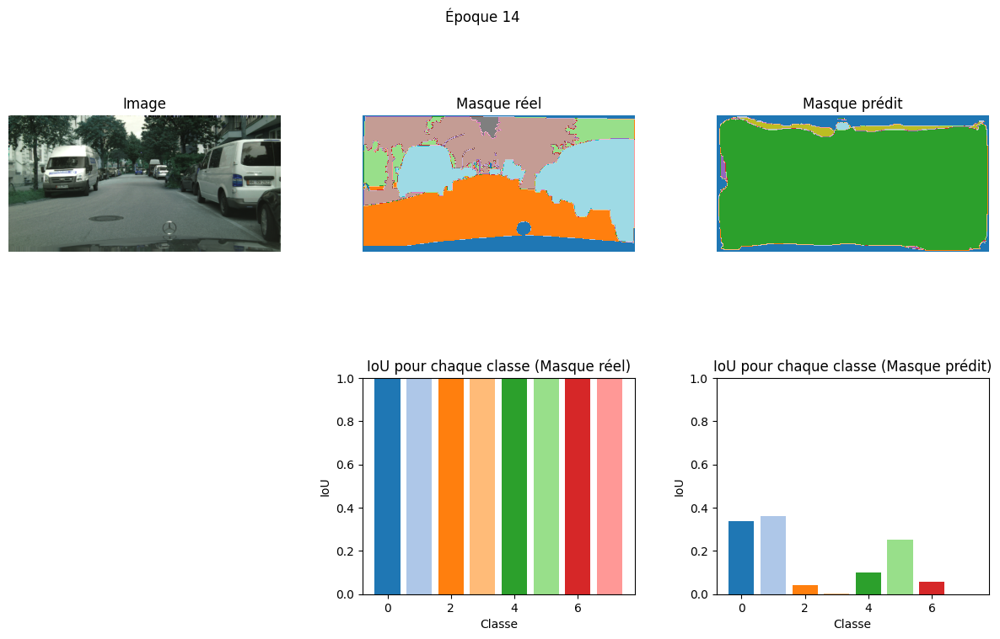

38/38 ━━━━━━━━━━━━━━━━━━━━ 660s 17s/step - accuracy: 0.4269 - dice_coeff: 0.2902 - dice_loss: 0.7098 - jaccard_score: 0.1698 - loss: 1.4914 - total_loss: 2.8717
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4246 - dice_coeff: 0.2924 - dice_loss: 0.7076 - jaccard_score: 0.1713 -


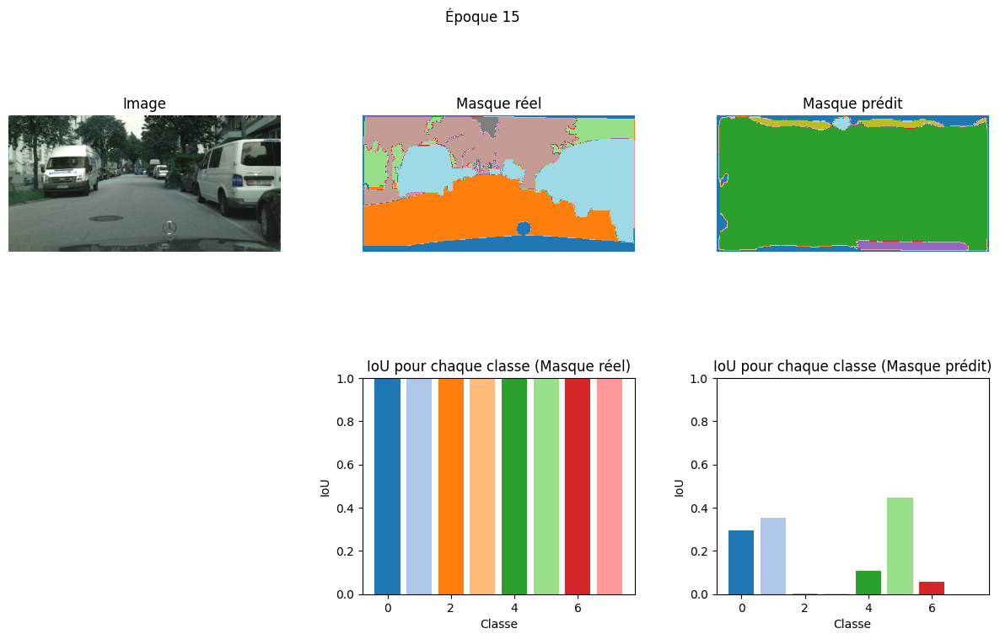

38/38 ━━━━━━━━━━━━━━━━━━━━ 665s 17s/step - accuracy: 0.4247 - dice_coeff: 0.2924 - dice_loss: 0.7076 - jaccard_score: 0.1713 - loss: 1.4798 - total_loss: 2.8516
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4221 - dice_coeff: 0.2910 - dice_loss: 0.7090 - jaccard_score: 0.1704 -


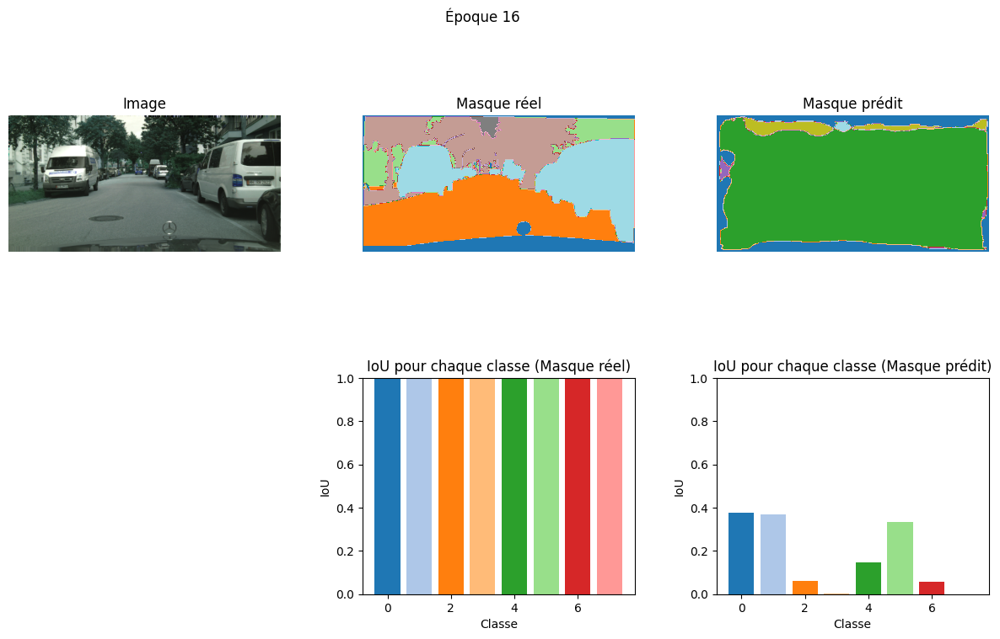

38/38 ━━━━━━━━━━━━━━━━━━━━ 671s 18s/step - accuracy: 0.4223 - dice_coeff: 0.2911 - dice_loss: 0.7089 - jaccard_score: 0.1704 - loss: 1.4969 - total_loss: 2.8484
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4282 - dice_coeff: 0.2944 - dice_loss: 0.7056 - jaccard_score: 0.1726 -


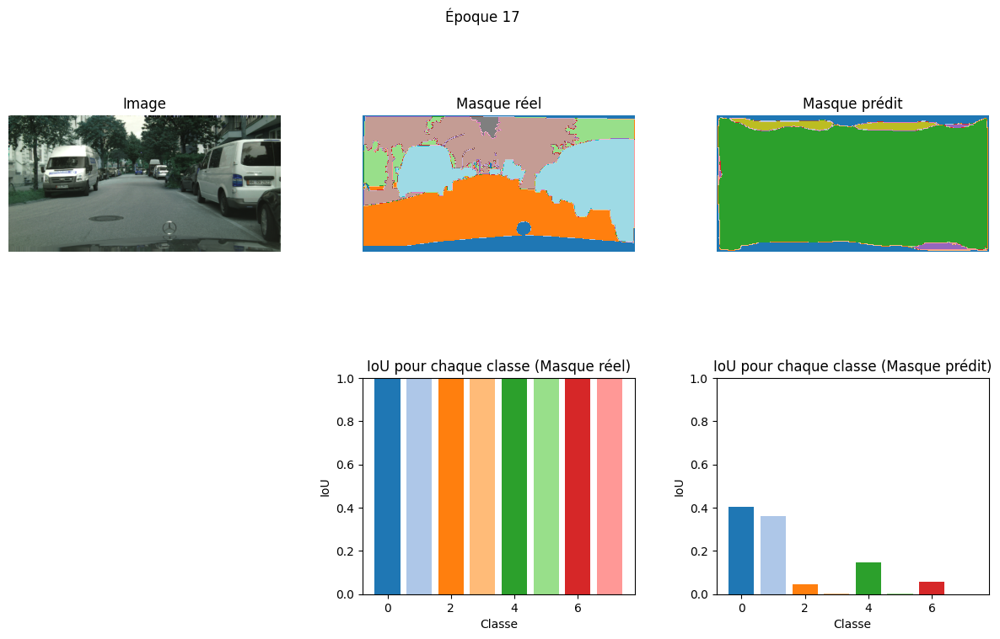

38/38 ━━━━━━━━━━━━━━━━━━━━ 669s 18s/step - accuracy: 0.4283 - dice_coeff: 0.2945 - dice_loss: 0.7055 - jaccard_score: 0.1727 - loss: 1.4660 - total_loss: 2.8429
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4457 - dice_coeff: 0.3071 - dice_loss: 0.6929 - jaccard_score: 0.1815 -


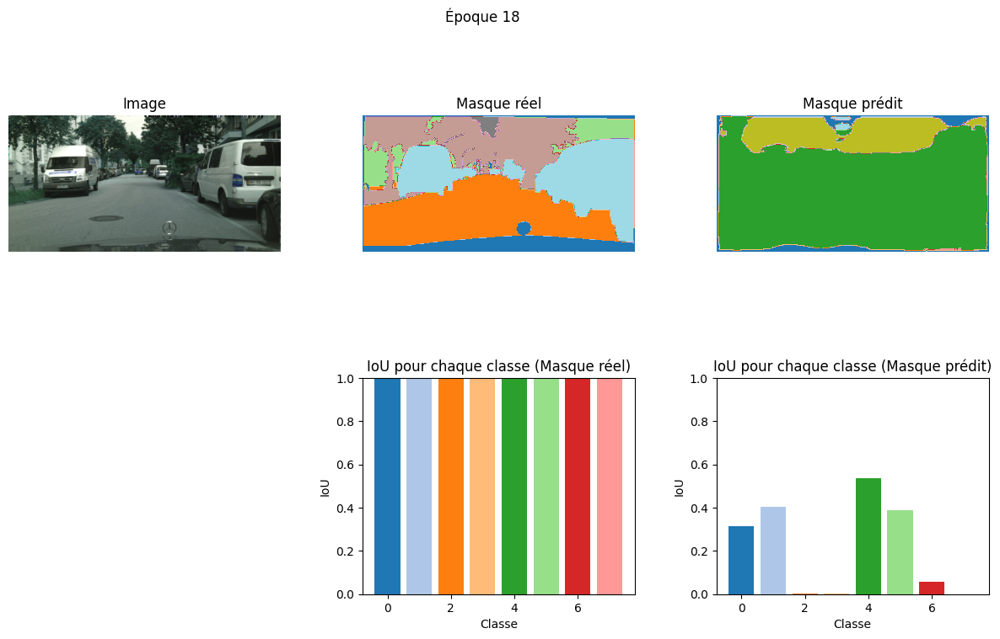

38/38 ━━━━━━━━━━━━━━━━━━━━ 661s 17s/step - accuracy: 0.4455 - dice_coeff: 0.3069 - dice_loss: 0.6931 - jaccard_score: 0.1814 - loss: 1.4479 - total_loss: 2.8203
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4356 - dice_coeff: 0.2983 - dice_loss: 0.7017 - jaccard_score: 0.1754 -


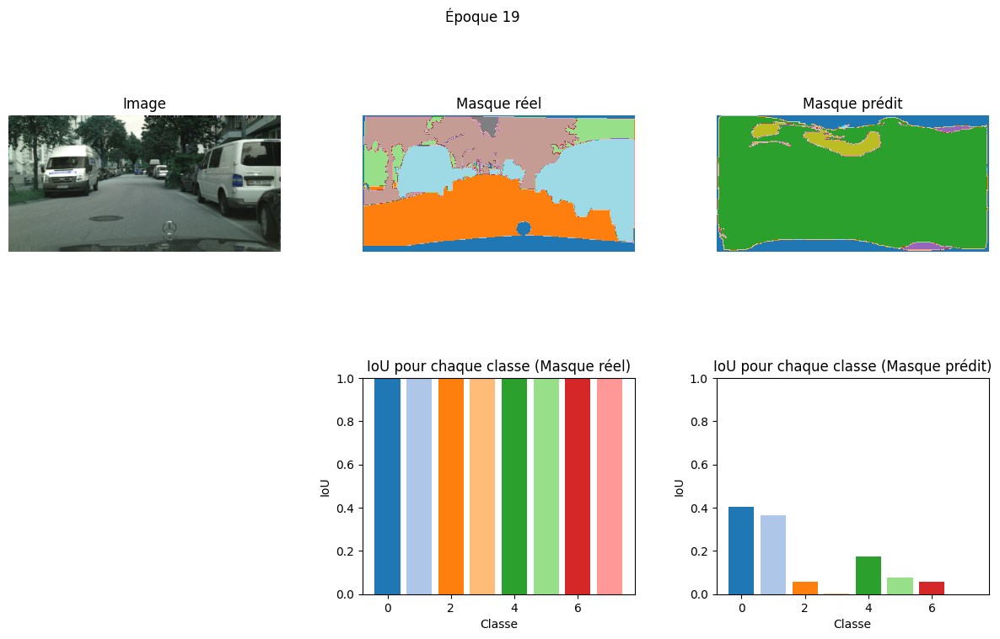

38/38 ━━━━━━━━━━━━━━━━━━━━ 664s 17s/step - accuracy: 0.4356 - dice_coeff: 0.2984 - dice_loss: 0.7016 - jaccard_score: 0.1754 - loss: 1.4630 - total_loss: 2.8471
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4398 - dice_coeff: 0.3085 - dice_loss: 0.6915 - jaccard_score: 0.1825 -


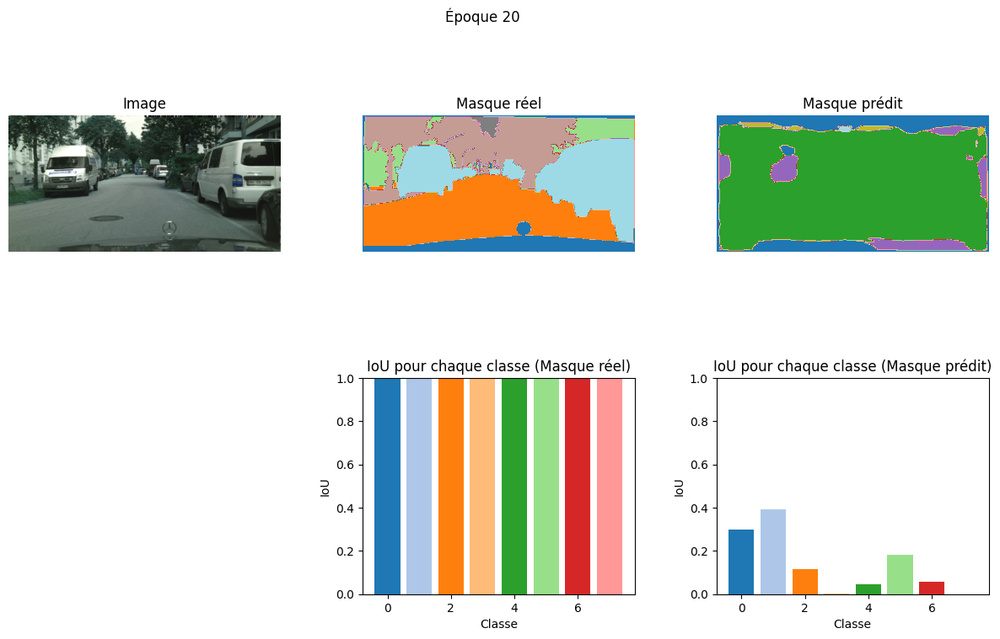

38/38 ━━━━━━━━━━━━━━━━━━━━ 666s 17s/step - accuracy: 0.4397 - dice_coeff: 0.3084 - dice_loss: 0.6916 - jaccard_score: 0.1824 - loss: 1.4340 - total_loss: 2.8283


In [50]:
# Entraînement du modèle avec les données augmentées
history = model.fit(
    images_aug,
    masks_aug,
    batch_size=8,
    epochs=20,
    callbacks=[PredictionCallback()]
)

#### Entraînement 2

In [51]:
images_aug, masks_aug = augment_data_tf_extended(images, masks)

Epoch 1/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4313 - dice_coeff: 0.2897 - dice_loss: 0.7103 - jaccard_score: 0.1694 -


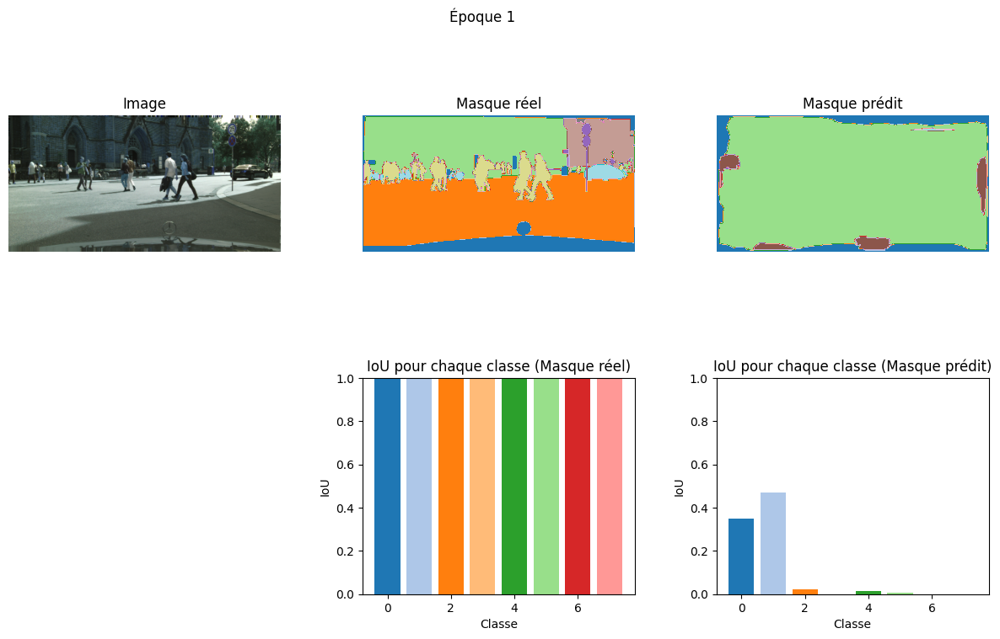

38/38 ━━━━━━━━━━━━━━━━━━━━ 572s 15s/step - accuracy: 0.4313 - dice_coeff: 0.2895 - dice_loss: 0.7105 - jaccard_score: 0.1693 - loss: 1.4962 - total_loss: 2.8574
Epoch 2/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4266 - dice_coeff: 0.2912 - dice_loss: 0.7088 - jaccard_score: 0.1705 -


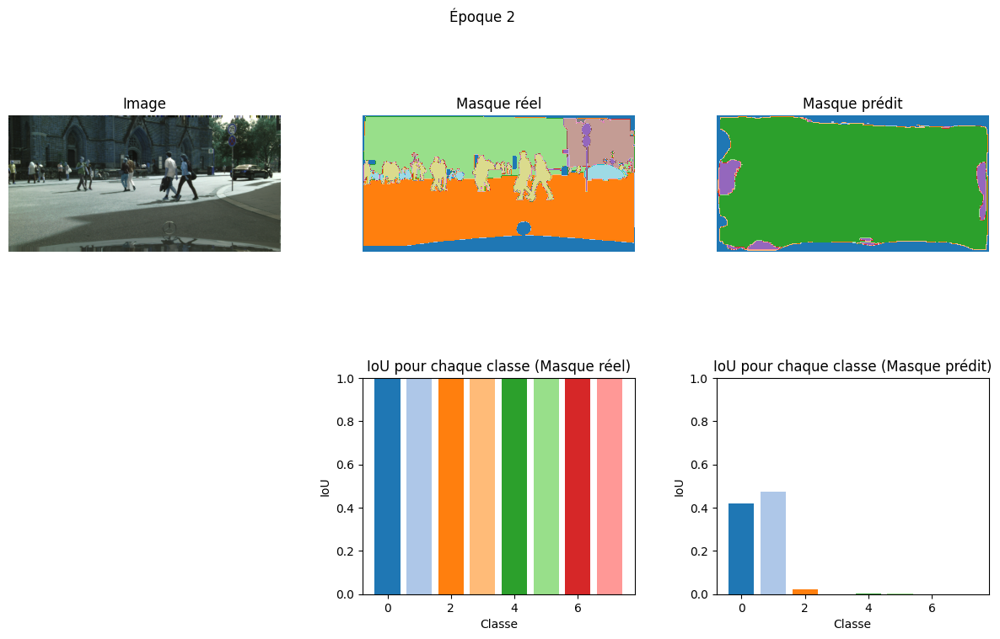

38/38 ━━━━━━━━━━━━━━━━━━━━ 652s 17s/step - accuracy: 0.4267 - dice_coeff: 0.2913 - dice_loss: 0.7087 - jaccard_score: 0.1705 - loss: 1.4949 - total_loss: 2.8629
Epoch 3/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.4285 - dice_coeff: 0.2936 - dice_loss: 0.7064 - jaccard_score: 0.1721 -


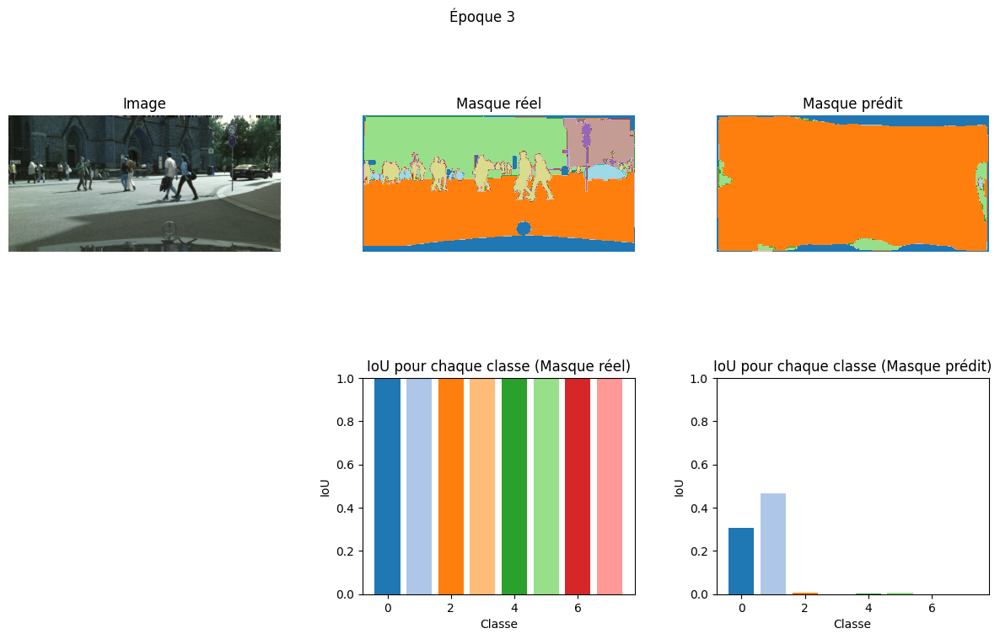

38/38 ━━━━━━━━━━━━━━━━━━━━ 621s 16s/step - accuracy: 0.4287 - dice_coeff: 0.2936 - dice_loss: 0.7064 - jaccard_score: 0.1721 - loss: 1.4764 - total_loss: 2.8760
Epoch 4/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.4413 - dice_coeff: 0.3005 - dice_loss: 0.6995 - jaccard_score: 0.1769 -


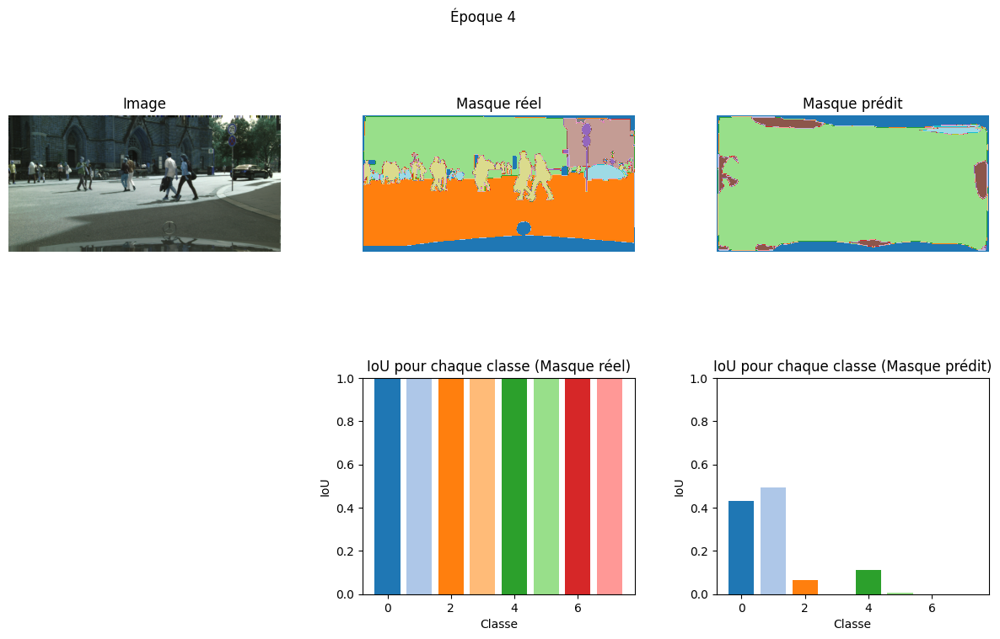

38/38 ━━━━━━━━━━━━━━━━━━━━ 619s 16s/step - accuracy: 0.4412 - dice_coeff: 0.3005 - dice_loss: 0.6995 - jaccard_score: 0.1769 - loss: 1.4719 - total_loss: 2.8666
Epoch 5/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4385 - dice_coeff: 0.3007 - dice_loss: 0.6993 - jaccard_score: 0.1770 -


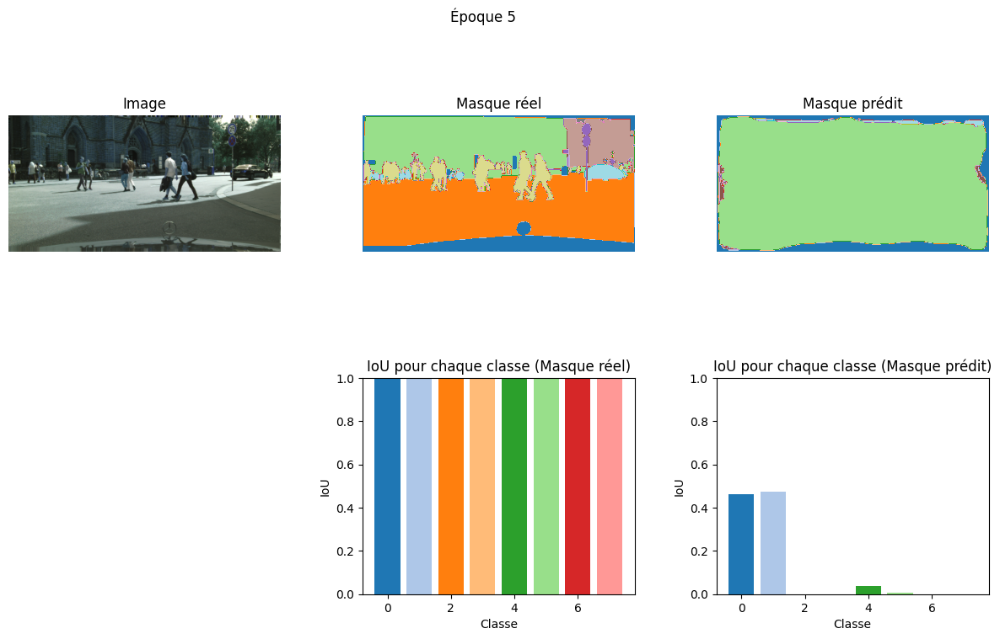

38/38 ━━━━━━━━━━━━━━━━━━━━ 630s 17s/step - accuracy: 0.4386 - dice_coeff: 0.3007 - dice_loss: 0.6993 - jaccard_score: 0.1770 - loss: 1.4491 - total_loss: 2.8621
Epoch 6/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4430 - dice_coeff: 0.3073 - dice_loss: 0.6927 - jaccard_score: 0.1816 -


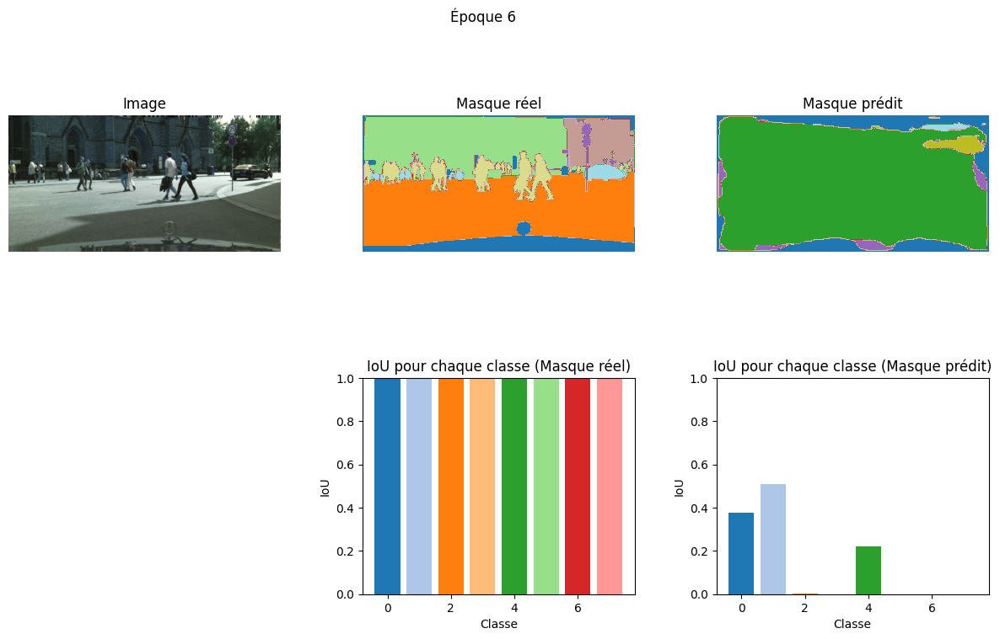

38/38 ━━━━━━━━━━━━━━━━━━━━ 649s 17s/step - accuracy: 0.4429 - dice_coeff: 0.3072 - dice_loss: 0.6928 - jaccard_score: 0.1815 - loss: 1.4456 - total_loss: 2.8605
Epoch 7/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4477 - dice_coeff: 0.3039 - dice_loss: 0.6961 - jaccard_score: 0.1792 -


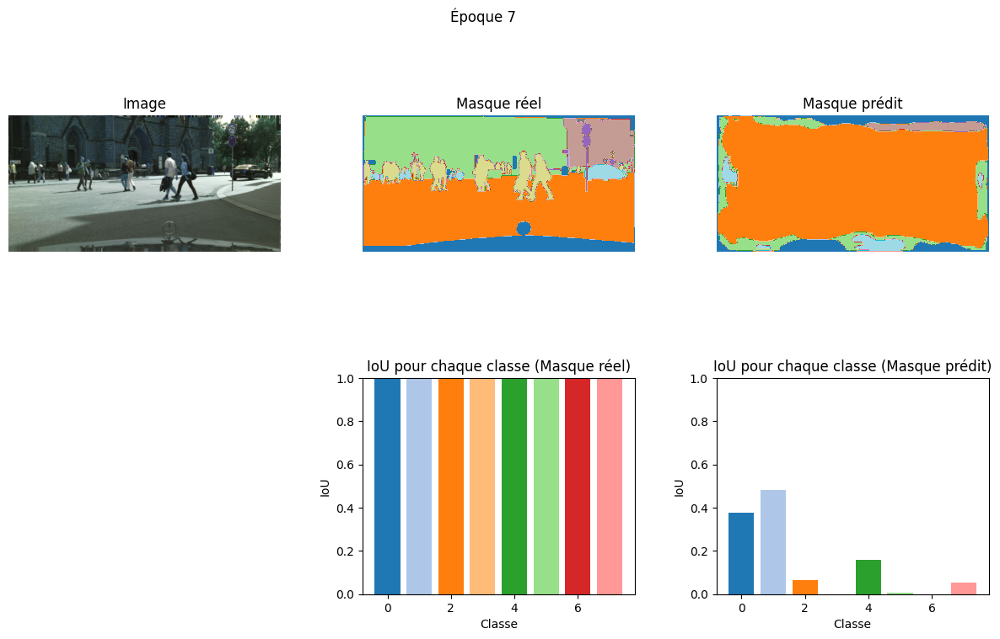

38/38 ━━━━━━━━━━━━━━━━━━━━ 659s 17s/step - accuracy: 0.4476 - dice_coeff: 0.3038 - dice_loss: 0.6962 - jaccard_score: 0.1792 - loss: 1.4385 - total_loss: 2.8845
Epoch 8/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/steptep - accuracy: 0.4553 - dice_coeff: 0.3162 - dice_loss: 0.6838 - jaccard_score: 0.1879 -


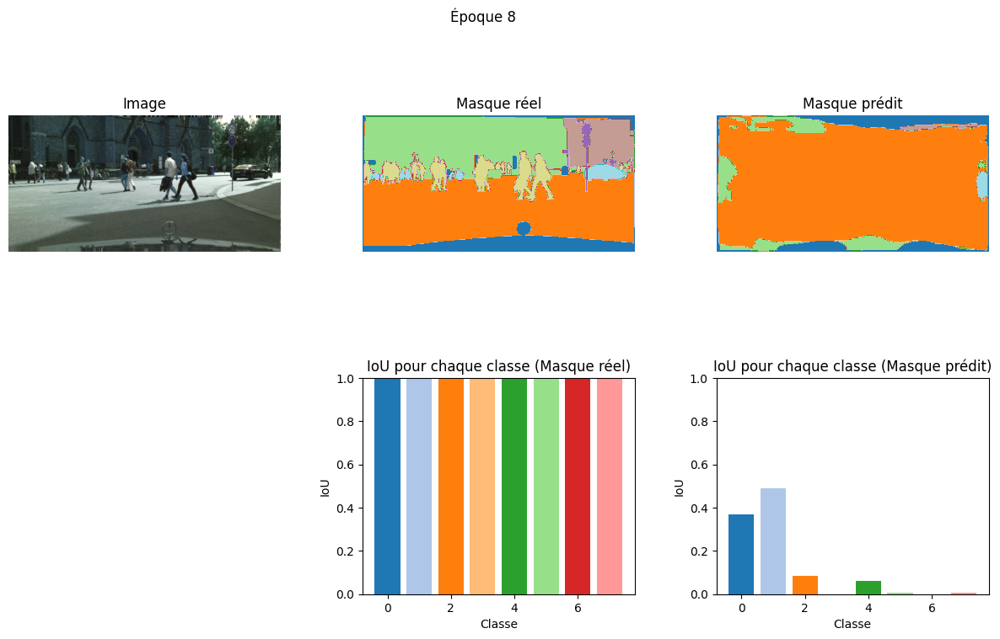

38/38 ━━━━━━━━━━━━━━━━━━━━ 663s 17s/step - accuracy: 0.4551 - dice_coeff: 0.3161 - dice_loss: 0.6839 - jaccard_score: 0.1878 - loss: 1.4228 - total_loss: 2.8439
Epoch 9/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4472 - dice_coeff: 0.3095 - dice_loss: 0.6905 - jaccard_score: 0.1831 -


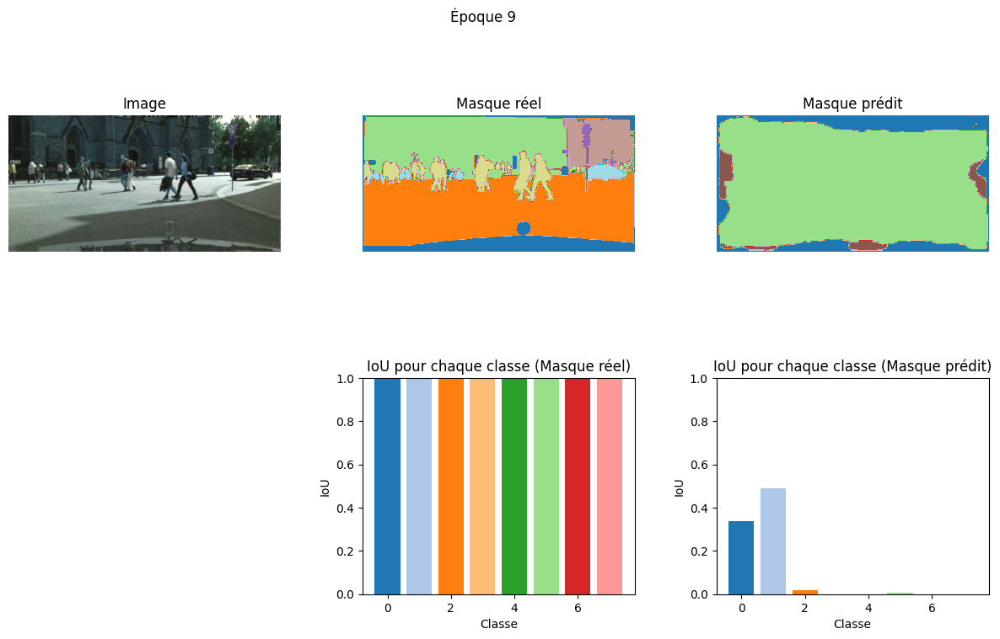

38/38 ━━━━━━━━━━━━━━━━━━━━ 638s 17s/step - accuracy: 0.4472 - dice_coeff: 0.3095 - dice_loss: 0.6905 - jaccard_score: 0.1831 - loss: 1.4199 - total_loss: 2.8697
Epoch 10/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/steptep - accuracy: 0.4561 - dice_coeff: 0.3223 - dice_loss: 0.6777 - jaccard_score: 0.1922 -


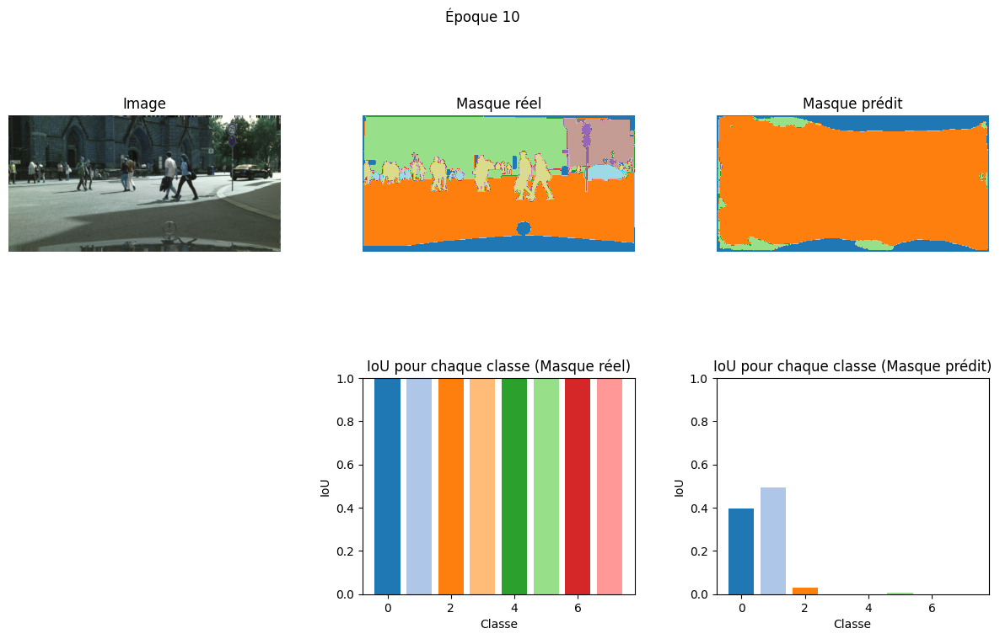

38/38 ━━━━━━━━━━━━━━━━━━━━ 740s 20s/step - accuracy: 0.4560 - dice_coeff: 0.3223 - dice_loss: 0.6777 - jaccard_score: 0.1921 - loss: 1.4043 - total_loss: 2.8494
Epoch 11/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4625 - dice_coeff: 0.3257 - dice_loss: 0.6743 - jaccard_score: 0.1946 -


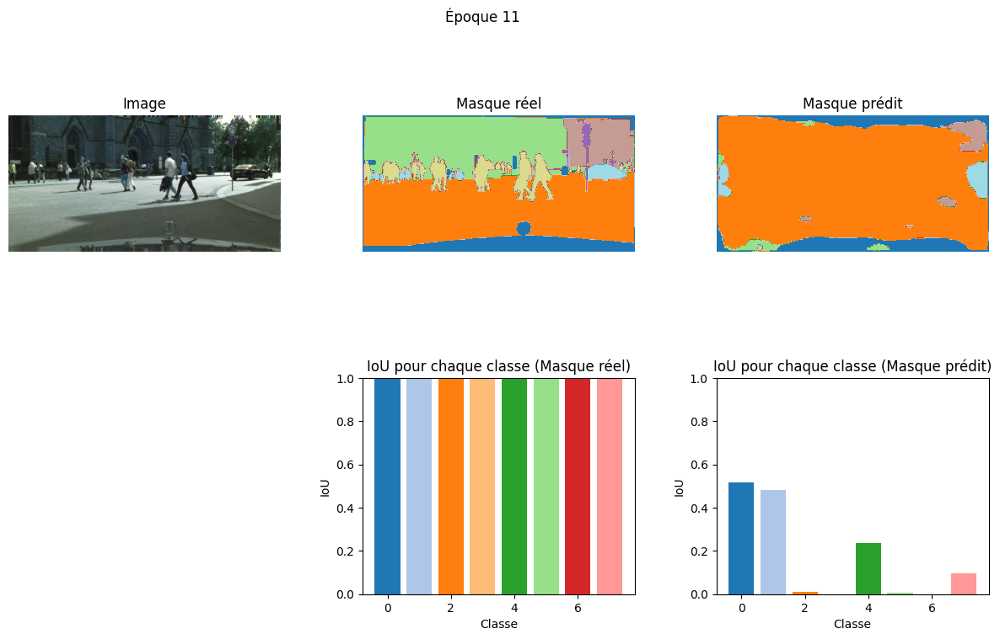

38/38 ━━━━━━━━━━━━━━━━━━━━ 697s 18s/step - accuracy: 0.4626 - dice_coeff: 0.3257 - dice_loss: 0.6743 - jaccard_score: 0.1947 - loss: 1.3816 - total_loss: 2.8633
Epoch 12/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4777 - dice_coeff: 0.3343 - dice_loss: 0.6657 - jaccard_score: 0.2008 -


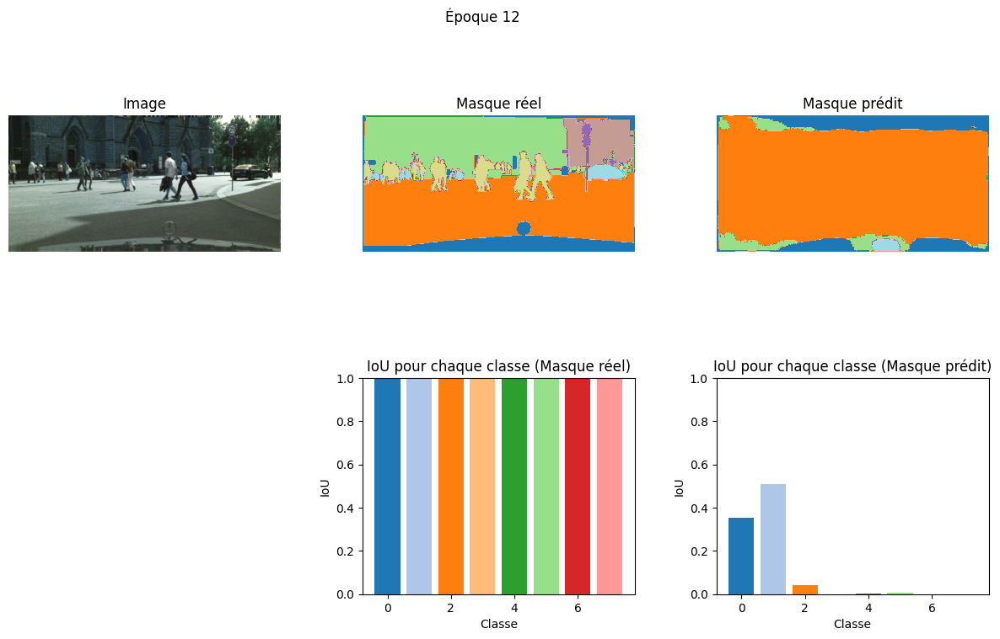

38/38 ━━━━━━━━━━━━━━━━━━━━ 751s 20s/step - accuracy: 0.4775 - dice_coeff: 0.3343 - dice_loss: 0.6657 - jaccard_score: 0.2008 - loss: 1.3599 - total_loss: 2.8698
Epoch 13/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4738 - dice_coeff: 0.3391 - dice_loss: 0.6609 - jaccard_score: 0.2043 -


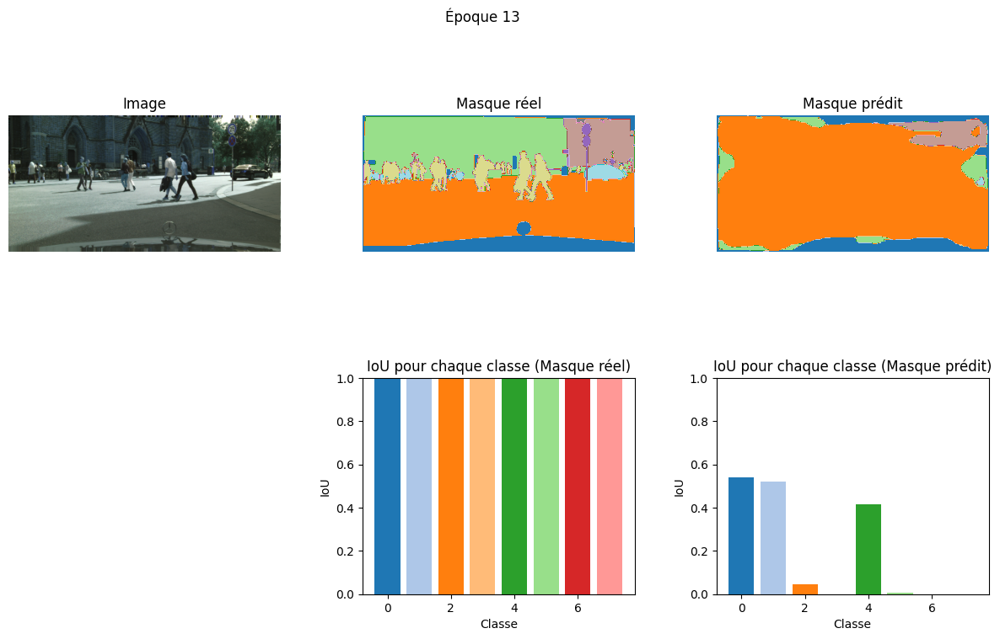

38/38 ━━━━━━━━━━━━━━━━━━━━ 745s 20s/step - accuracy: 0.4738 - dice_coeff: 0.3391 - dice_loss: 0.6609 - jaccard_score: 0.2042 - loss: 1.3585 - total_loss: 2.8393
Epoch 14/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4924 - dice_coeff: 0.3584 - dice_loss: 0.6416 - jaccard_score: 0.2185 -


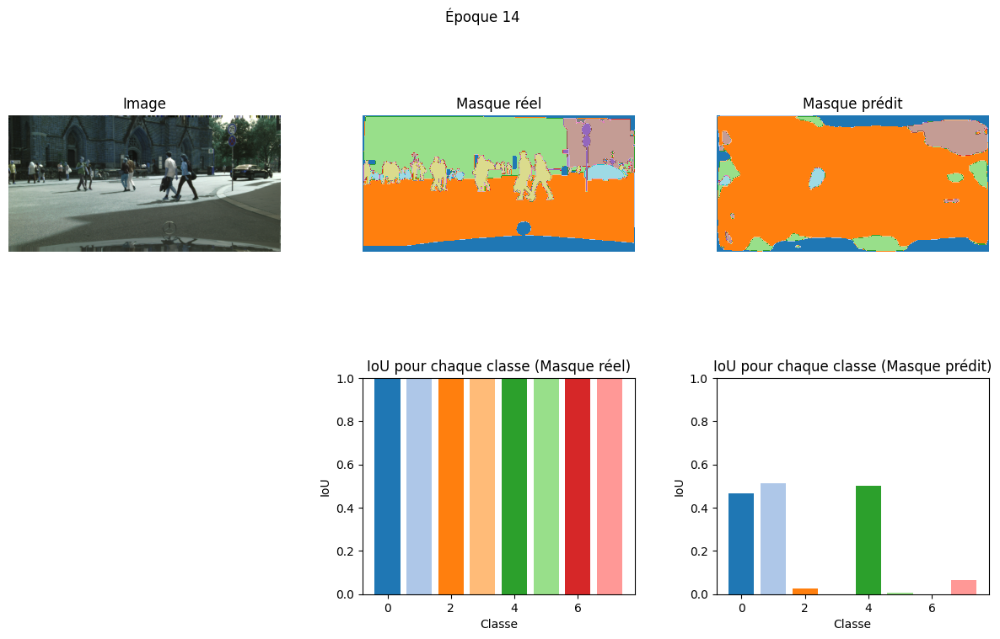

38/38 ━━━━━━━━━━━━━━━━━━━━ 725s 19s/step - accuracy: 0.4922 - dice_coeff: 0.3583 - dice_loss: 0.6417 - jaccard_score: 0.2184 - loss: 1.3195 - total_loss: 2.8131
Epoch 15/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.4979 - dice_coeff: 0.3606 - dice_loss: 0.6394 - jaccard_score: 0.2201 -


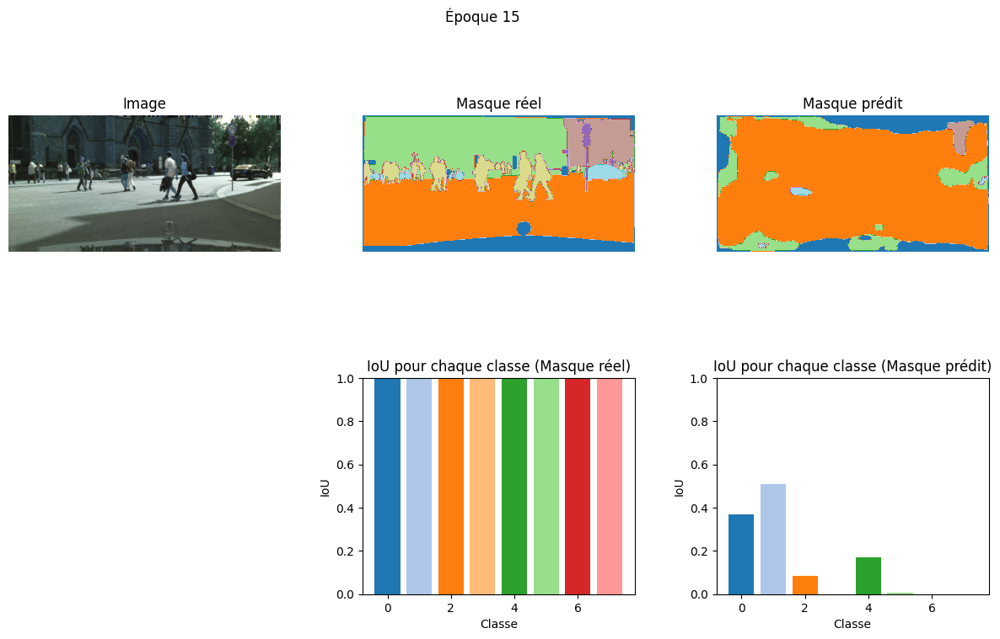

38/38 ━━━━━━━━━━━━━━━━━━━━ 768s 20s/step - accuracy: 0.4980 - dice_coeff: 0.3607 - dice_loss: 0.6393 - jaccard_score: 0.2202 - loss: 1.3050 - total_loss: 2.7986
Epoch 16/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.5115 - dice_coeff: 0.3811 - dice_loss: 0.6189 - jaccard_score: 0.2356 -


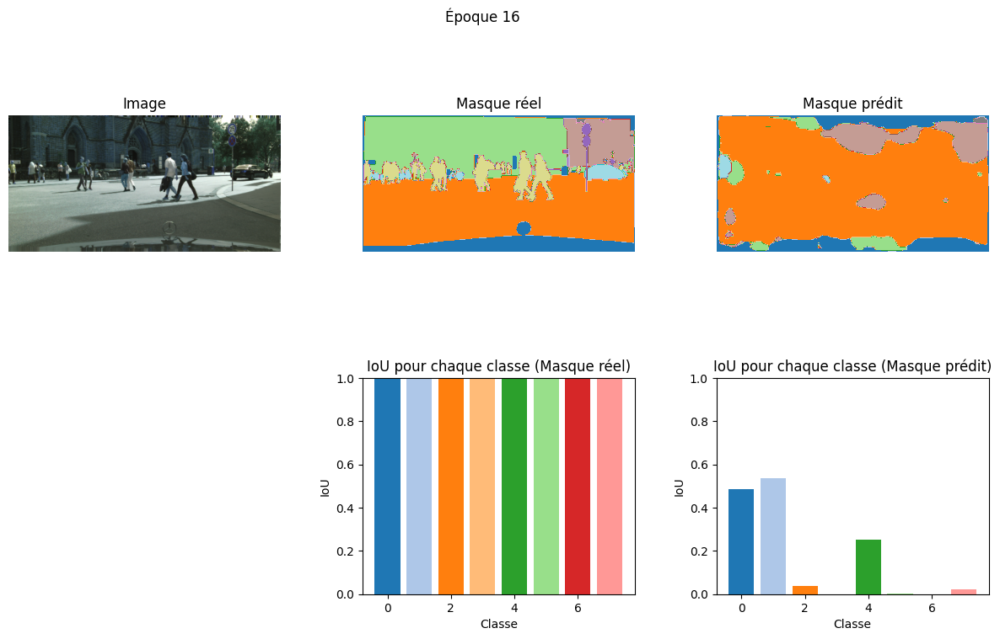

38/38 ━━━━━━━━━━━━━━━━━━━━ 686s 18s/step - accuracy: 0.5114 - dice_coeff: 0.3811 - dice_loss: 0.6189 - jaccard_score: 0.2355 - loss: 1.2715 - total_loss: 2.8033
Epoch 17/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.5273 - dice_coeff: 0.3966 - dice_loss: 0.6034 - jaccard_score: 0.2475 -


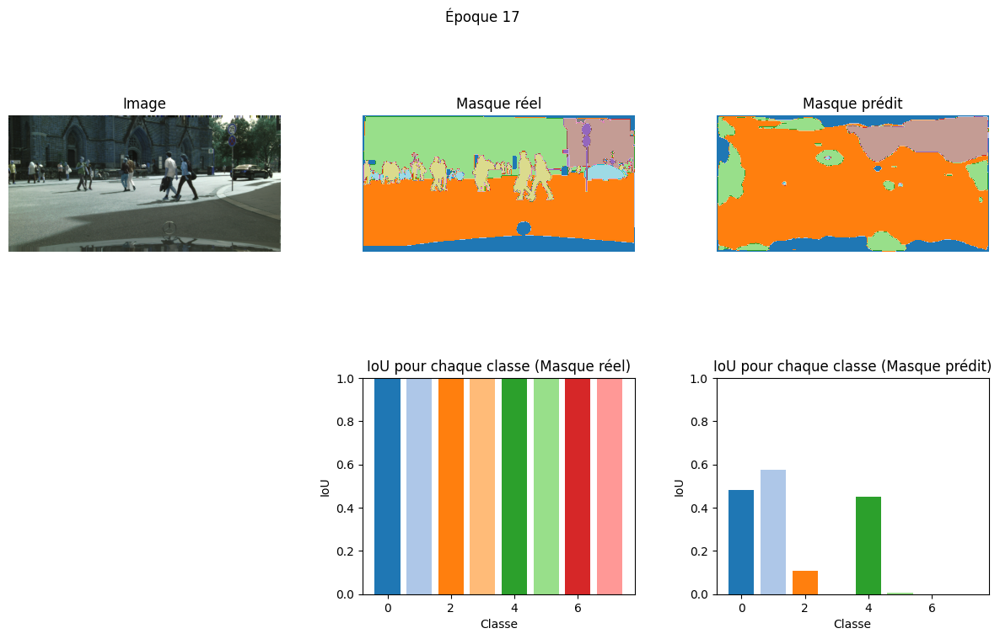

38/38 ━━━━━━━━━━━━━━━━━━━━ 669s 18s/step - accuracy: 0.5273 - dice_coeff: 0.3966 - dice_loss: 0.6034 - jaccard_score: 0.2475 - loss: 1.2438 - total_loss: 2.8104
Epoch 18/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.5527 - dice_coeff: 0.4221 - dice_loss: 0.5779 - jaccard_score: 0.2677 -


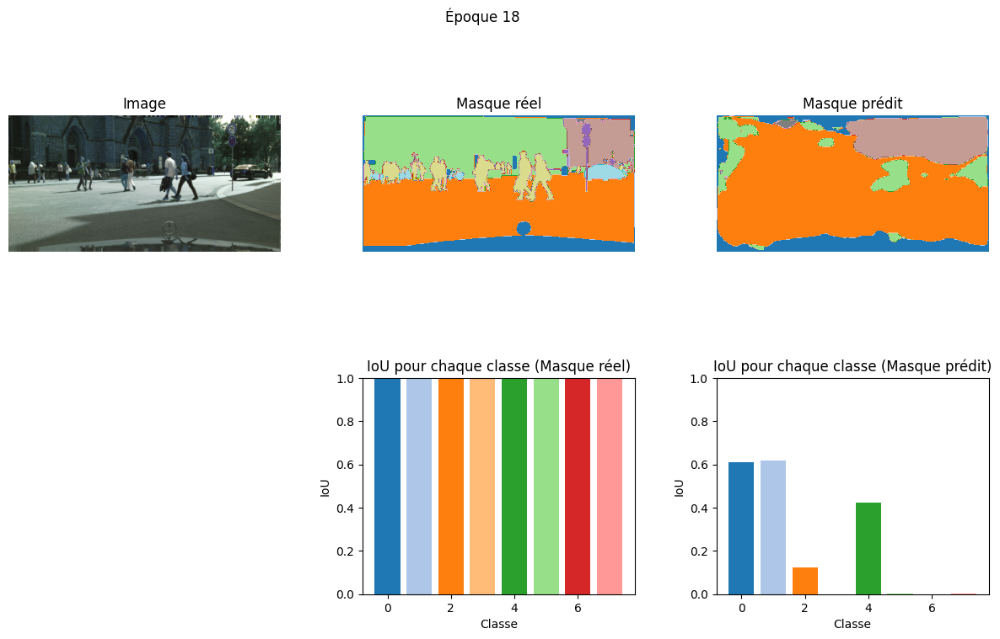

38/38 ━━━━━━━━━━━━━━━━━━━━ 692s 18s/step - accuracy: 0.5526 - dice_coeff: 0.4219 - dice_loss: 0.5781 - jaccard_score: 0.2676 - loss: 1.1833 - total_loss: 2.7020
Epoch 19/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.5779 - dice_coeff: 0.4505 - dice_loss: 0.5495 - jaccard_score: 0.2910 -


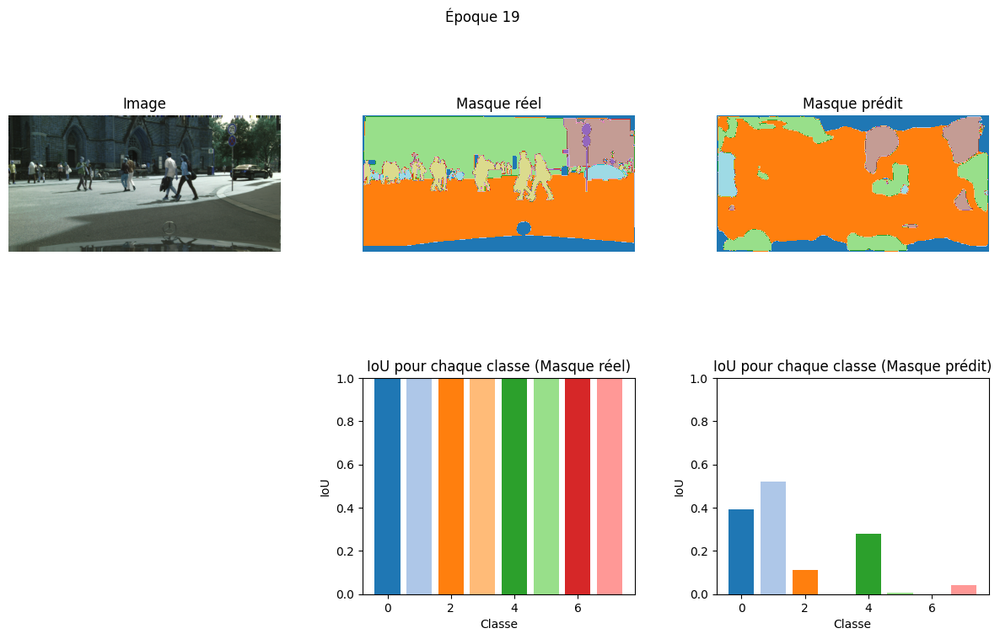

38/38 ━━━━━━━━━━━━━━━━━━━━ 698s 18s/step - accuracy: 0.5777 - dice_coeff: 0.4503 - dice_loss: 0.5497 - jaccard_score: 0.2907 - loss: 1.1367 - total_loss: 2.6911
Epoch 20/20
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/steptep - accuracy: 0.5854 - dice_coeff: 0.4479 - dice_loss: 0.5521 - jaccard_score: 0.2889 -


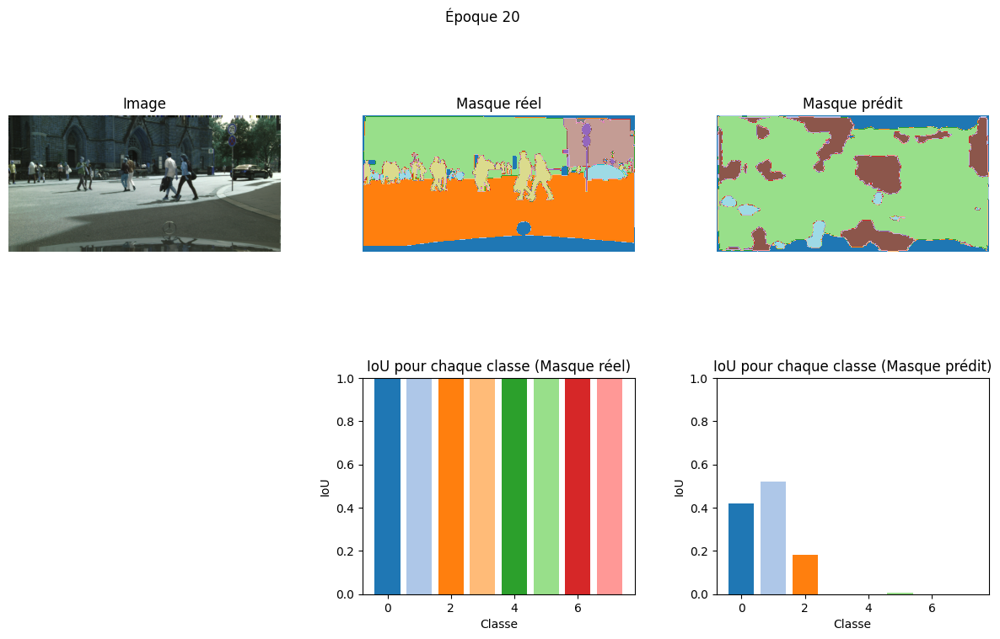

38/38 ━━━━━━━━━━━━━━━━━━━━ 692s 18s/step - accuracy: 0.5853 - dice_coeff: 0.4480 - dice_loss: 0.5520 - jaccard_score: 0.2890 - loss: 1.1267 - total_loss: 2.6452


In [53]:
# Entraînement du modèle avec les données augmentées
history = model.fit(
    images_aug,
    masks_aug,
    batch_size=8,
    epochs=20,
    callbacks=[PredictionCallback()]
)